El cuarto acercamiento se realiza con el archivo "230512_formaciones_oferta_724.csv", que tiene contiene 39.102 instancias (registros) con 52 características

-Identificación de archivo a procesar

-Cargue del archivo en Github

-Cargue del archivo desde Github

-Exploración de las caracteríticas del archivo

-Identificación de características

-Identificación de características categóricas y las características numéricas

-Exploración de valores en las características:

  *Faltantes

  *Únicos
-Identificación de posibles caracteríticas a desechar

-Identificación de estrategia para valores faltantes en las caracteríticas

Cargue del archivo desde github

In [929]:
import numpy as np, random, operator, pandas as pd, matplotlib.pyplot as plt
import seaborn as sns
#https://drive.google.com/file/d/1flzdpualWKZrAtri3LvlOuAL0dgeFttj/view?usp=share_link

Cargue del conjunto de datos 230512_formaciones_oferta_724.csv en Pandas.

In [930]:
#para leerlo desde github
df = pd.read_csv('https://raw.githubusercontent.com/armaacum/data/main/230512_formaciones_oferta_724.csv',encoding='latin1', sep = ';')


Se exploran las caracteríticas del archivo

In [931]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   NIS                       39102 non-null  int64  
 1   GENERO                    39102 non-null  object 
 2   FECHA_NACIMIENTO          39102 non-null  object 
 3   ESTADO_CIVIL              39102 non-null  object 
 4   ESTRATO                   39102 non-null  int64  
 5   PUNTAJE_ICFES             1910 non-null   object 
 6   NIVEL_SISBEN              6995 non-null   float64
 7   DBU_HIJOS                 115 non-null    float64
 8   COD_PAIS_RESIDENCIA       39102 non-null  int64  
 9   PAIS_RESIDENCIA           39102 non-null  object 
 10  COD_DPTO_RESIDENCIA       39102 non-null  int64  
 11  DPTO_RESIDENCIA           39102 non-null  object 
 12  COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64  
 13  MUNICIPIO_RESIDENCIA      39102 non-null  object 
 14  COD_ZO

In [932]:
df.shape

(39102, 52)

El archivo contiene 39102 intancias por 52 características

Se identifican los nombre de todas las características

In [933]:
def check(data):
    l=[]
    columns=data.columns
    for col in columns:
        dtypes=data[col].dtypes
        nunique=data[col].nunique()
        sum_null=data[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    res=pd.DataFrame(l)
    res.columns=['column','dtypes','nunique','sum_null']
    return res
check(df)

,column,dtypes,nunique,sum_null
0,NIS,int64,38054,0
1,GENERO,object,2,0
2,FECHA_NACIMIENTO,object,10113,0
3,ESTADO_CIVIL,object,7,0
4,ESTRATO,int64,6,0
5,PUNTAJE_ICFES,object,398,37192
6,NIVEL_SISBEN,float64,5,32107
7,DBU_HIJOS,float64,3,38987
8,COD_PAIS_RESIDENCIA,int64,15,0
9,PAIS_RESIDENCIA,object,15,0


In [934]:
columns = df.columns.values
columns

array(['NIS', 'GENERO', 'FECHA_NACIMIENTO', 'ESTADO_CIVIL', 'ESTRATO',
       'PUNTAJE_ICFES', 'NIVEL_SISBEN', 'DBU_HIJOS',
       'COD_PAIS_RESIDENCIA', 'PAIS_RESIDENCIA', 'COD_DPTO_RESIDENCIA',
       'DPTO_RESIDENCIA', 'COD_MUNICIPIO_RESIDENCIA',
       'MUNICIPIO_RESIDENCIA', 'COD_ZONA_RESIDENCIA',
       'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO', 'ESTADO_APRENDIZ',
       'COD_NIVEL_FORMACION', 'NIVEL_FORMACION', 'MODALIDAD',
       'COD_PROGRAMA', 'NOMBRE_PROGRAMA', 'CODIGO_RED_CONOCIMIENTO',
       'NOM_RED_CONOCIMIENTO', 'COD_LINEA_TECNOLÓGICA',
       'NOM_LINEA_TECNOLÓGICA', 'CÓDIGO_TECNOLOGÍA_DE_RED',
       'NOMBRE_TECNOLOGÍA_DE_RED', 'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL',
       'NOMBRE_REGIONAL', 'CÓDIGO_CENTRO', 'SEDE', 'EDAD',
       'CÓDIGO_TIPO_POBLACIÓN', 'NOMBRE_TIPO_POBLACIÓN',
       'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019',
       'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021',
       'APOYO_SOSTNMTO_2022', 'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018',
       'APOYO_F

Se identifican las características categóricas y las características numéricas

In [935]:
for t in columns:
  print(t, df[t].dtype)

NIS int64
GENERO object
FECHA_NACIMIENTO object
ESTADO_CIVIL object
ESTRATO int64
PUNTAJE_ICFES object
NIVEL_SISBEN float64
DBU_HIJOS float64
COD_PAIS_RESIDENCIA int64
PAIS_RESIDENCIA object
COD_DPTO_RESIDENCIA int64
DPTO_RESIDENCIA object
COD_MUNICIPIO_RESIDENCIA int64
MUNICIPIO_RESIDENCIA object
COD_ZONA_RESIDENCIA float64
COD_BARRIO_RESIDENCIA float64
CODIGO_ESTADO int64
ESTADO_APRENDIZ object
COD_NIVEL_FORMACION int64
NIVEL_FORMACION object
MODALIDAD object
COD_PROGRAMA int64
NOMBRE_PROGRAMA object
CODIGO_RED_CONOCIMIENTO float64
NOM_RED_CONOCIMIENTO object
COD_LINEA_TECNOLÓGICA int64
NOM_LINEA_TECNOLÓGICA object
CÓDIGO_TECNOLOGÍA_DE_RED int64
NOMBRE_TECNOLOGÍA_DE_RED object
FICHA_NUM_CURSO int64
CÓDIGO_REGIONAL int64
NOMBRE_REGIONAL object
CÓDIGO_CENTRO int64
SEDE object
EDAD int64
CÓDIGO_TIPO_POBLACIÓN int64
NOMBRE_TIPO_POBLACIÓN object
APOYO_SOSTNMTO_2018 int64
APOYO_SOSTNMTO_2019 int64
APOYO_SOSTNMTO_2020 int64
APOYO_SOSTNMTO_2021 int64
APOYO_SOSTNMTO_2022 int64
APOYO_SOSTNMTO_

In [936]:
categoricos_col =[]
for t in columns:
  if df[t].dtype == 'object':
    categoricos_col.append(t)
categoricos_col


['GENERO',
 'FECHA_NACIMIENTO',
 'ESTADO_CIVIL',
 'PUNTAJE_ICFES',
 'PAIS_RESIDENCIA',
 'DPTO_RESIDENCIA',
 'MUNICIPIO_RESIDENCIA',
 'ESTADO_APRENDIZ',
 'NIVEL_FORMACION',
 'MODALIDAD',
 'NOMBRE_PROGRAMA',
 'NOM_RED_CONOCIMIENTO',
 'NOM_LINEA_TECNOLÓGICA',
 'NOMBRE_TECNOLOGÍA_DE_RED',
 'NOMBRE_REGIONAL',
 'SEDE',
 'NOMBRE_TIPO_POBLACIÓN',
 'PUNTAJE_TOTAL',
 'FECHA_MATRICULA',
 'FECHA_ULTIMO_ESTADO']

In [937]:
numericas_col=[]
for t in columns:
  if df[t].dtype == 'int64':
    numericas_col.append(t)
numericas_col

['NIS',
 'ESTRATO',
 'COD_PAIS_RESIDENCIA',
 'COD_DPTO_RESIDENCIA',
 'COD_MUNICIPIO_RESIDENCIA',
 'CODIGO_ESTADO',
 'COD_NIVEL_FORMACION',
 'COD_PROGRAMA',
 'COD_LINEA_TECNOLÓGICA',
 'CÓDIGO_TECNOLOGÍA_DE_RED',
 'FICHA_NUM_CURSO',
 'CÓDIGO_REGIONAL',
 'CÓDIGO_CENTRO',
 'EDAD',
 'CÓDIGO_TIPO_POBLACIÓN',
 'APOYO_SOSTNMTO_2018',
 'APOYO_SOSTNMTO_2019',
 'APOYO_SOSTNMTO_2020',
 'APOYO_SOSTNMTO_2021',
 'APOYO_SOSTNMTO_2022',
 'APOYO_SOSTNMTO_2023',
 'APOYO_FIC_2018',
 'APOYO_FIC_2019',
 'APOYO_FIC_2020',
 'APOYO_FIC_2021',
 'DURACIÓN_PROGRAMA']

In [938]:
data=[]
for d in columns:
  w=df[d].unique()
  print("Cantidad de valores únicos en ",d, " = ",len(w))


Cantidad de valores únicos en  NIS  =  38054
Cantidad de valores únicos en  GENERO  =  2
Cantidad de valores únicos en  FECHA_NACIMIENTO  =  10113
Cantidad de valores únicos en  ESTADO_CIVIL  =  7
Cantidad de valores únicos en  ESTRATO  =  6
Cantidad de valores únicos en  PUNTAJE_ICFES  =  399
Cantidad de valores únicos en  NIVEL_SISBEN  =  6
Cantidad de valores únicos en  DBU_HIJOS  =  4
Cantidad de valores únicos en  COD_PAIS_RESIDENCIA  =  15
Cantidad de valores únicos en  PAIS_RESIDENCIA  =  15
Cantidad de valores únicos en  COD_DPTO_RESIDENCIA  =  52
Cantidad de valores únicos en  DPTO_RESIDENCIA  =  54
Cantidad de valores únicos en  COD_MUNICIPIO_RESIDENCIA  =  900
Cantidad de valores únicos en  MUNICIPIO_RESIDENCIA  =  853
Cantidad de valores únicos en  COD_ZONA_RESIDENCIA  =  274
Cantidad de valores únicos en  COD_BARRIO_RESIDENCIA  =  1249
Cantidad de valores únicos en  CODIGO_ESTADO  =  9
Cantidad de valores únicos en  ESTADO_APRENDIZ  =  9
Cantidad de valores únicos en  COD_

De acuerdo a los resultados anteriores se concluye que la caracterítica MODALIDAD tiene el mismo valor para todas las intancias, al no variar, no se tendrá en cuenta en el análisis.

In [939]:
df.isnull().sum()

NIS                             0
GENERO                          0
FECHA_NACIMIENTO                0
ESTADO_CIVIL                    0
ESTRATO                         0
PUNTAJE_ICFES               37192
NIVEL_SISBEN                32107
DBU_HIJOS                   38987
COD_PAIS_RESIDENCIA             0
PAIS_RESIDENCIA                 0
COD_DPTO_RESIDENCIA             0
DPTO_RESIDENCIA                 0
COD_MUNICIPIO_RESIDENCIA        0
MUNICIPIO_RESIDENCIA            0
COD_ZONA_RESIDENCIA         36311
COD_BARRIO_RESIDENCIA       36675
CODIGO_ESTADO                   0
ESTADO_APRENDIZ                 0
COD_NIVEL_FORMACION             0
NIVEL_FORMACION                 0
MODALIDAD                       0
COD_PROGRAMA                    0
NOMBRE_PROGRAMA                 0
CODIGO_RED_CONOCIMIENTO     29138
NOM_RED_CONOCIMIENTO        29138
COD_LINEA_TECNOLÓGICA           0
NOM_LINEA_TECNOLÓGICA           0
CÓDIGO_TECNOLOGÍA_DE_RED        0
NOMBRE_TECNOLOGÍA_DE_RED        0
FICHA_NUM_CURS

In [940]:
df["NIS"].value_counts()

NIS
26104737    4
26160318    4
26206428    4
26039723    4
24361021    4
           ..
25261757    1
25859495    1
12481046    1
22761016    1
10292610    1
Name: count, Length: 38054, dtype: int64

In [941]:
frecuencia = df["NIS"].value_counts()
total_valores = len(df["NIS"])
for NIS, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 3 :
      print(f"NIS: {NIS}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NIS: 26104737, Frecuencia: 4, Porcentaje: 0.01%
NIS: 26160318, Frecuencia: 4, Porcentaje: 0.01%
NIS: 26206428, Frecuencia: 4, Porcentaje: 0.01%
NIS: 26039723, Frecuencia: 4, Porcentaje: 0.01%
NIS: 24361021, Frecuencia: 4, Porcentaje: 0.01%
NIS: 25775421, Frecuencia: 4, Porcentaje: 0.01%


In [942]:
print("Número de valores únicos: ",len(df["NIS"].unique()))

Número de valores únicos:  38054


In [943]:
df["GENERO"].value_counts()

GENERO
F    20044
M    19058
Name: count, dtype: int64

In [944]:
frecuencia = df["GENERO"].value_counts()
total_valores = len(df["GENERO"])
for GENERO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"GENERO: {GENERO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

GENERO: F, Frecuencia: 20044, Porcentaje: 51.26%
GENERO: M, Frecuencia: 19058, Porcentaje: 48.74%


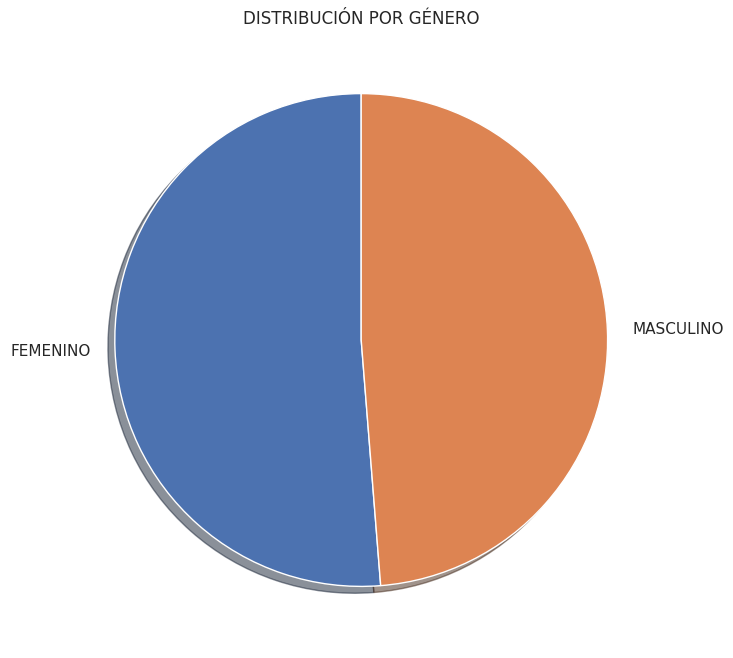

In [945]:
plt.figure(figsize=(12, 8))
plt.title('DISTRIBUCIÓN POR GÉNERO')
ay = df["GENERO"].value_counts()
mylabels = ["FEMENINO", "MASCULINO"]
plt.pie(ay, labels = mylabels, startangle = 90, shadow = True)
plt.show()

In [946]:
print("FEMENINO  {:.2f} %".format(df.apply(lambda x: x['GENERO'] == 'F', axis=1).sum() / len(df) *100))
print("MASCULINO {:.2f} %".format(df.apply(lambda x: x['GENERO'] == 'M', axis=1).sum() / len(df) *100))

FEMENINO  51.26 %
MASCULINO 48.74 %


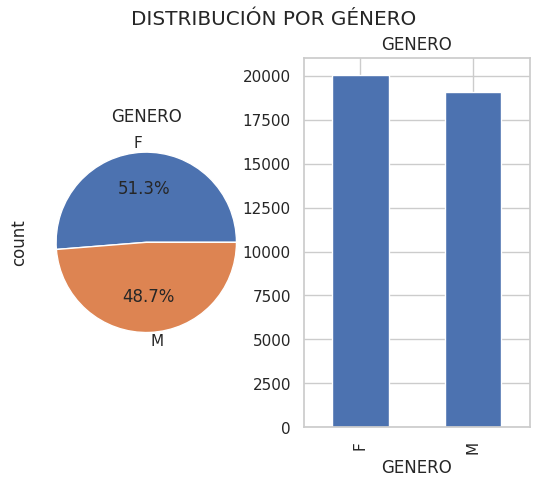

In [947]:
# INTENTO PARA GENERAR GRAFICA CON PORCENTAJES PARA GENERO
genero = df["GENERO"].value_counts()
plt.subplot(1,2,1)
genero.plot(kind="pie", autopct='%1.01f%%')
plt.title("GENERO")
#plt.suptitle("suptitle")

plt.subplot(1,2,2)
genero.plot(kind="bar")
plt.title("GENERO")
plt.suptitle("DISTRIBUCIÓN POR GÉNERO")
plt.show()

In [948]:
print("Número de valores únicos: ",len(df["FECHA_NACIMIENTO"].str.slice(6, 10).unique()))

Número de valores únicos:  133


In [949]:
df["FECHA_NACIMIENTO"].str.slice(6, 10)

0        2001
1         000
2         000
3        2000
4        1995
         ... 
39097    2000
39098    1998
39099    1995
39100     991
39101    1980
Name: FECHA_NACIMIENTO, Length: 39102, dtype: object

In [950]:
frecuencia = df["FECHA_NACIMIENTO"].value_counts()
total_valores = len(df["FECHA_NACIMIENTO"])
for FECHA_NACIMIENTO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"FECHA_NACIMIENTO: {FECHA_NACIMIENTO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

Se han truncado las últimas 5000 líneas del flujo de salida.
FECHA_NACIMIENTO: 8/01/1983, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 27/12/2001, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 3/11/1981, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 29/04/1980, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 28/04/1983, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 4/07/1988, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 2/10/1984, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 24/12/1981, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 4/02/1959, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 30/09/1982, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 26/09/1984, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 2/07/2002, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 27/12/1989, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 17/10/1975, Frecuencia: 2, Porcentaje: 0.01%
FECHA_NACIMIENTO: 19/11/1993, Frecuencia: 2, Porcentaje: 0.01%


In [951]:
#Estado civil del usuario. Valores de chequeo: V - Viudo; E - Separado ; U - Unión Libre ; C - Casado; S - Soltero; I - Indiferente ,  N No Ingresado
df["ESTADO_CIVIL"].value_counts()

ESTADO_CIVIL
S    20622
N     8977
U     4330
I     2557
C     2242
E      317
V       57
Name: count, dtype: int64

In [952]:
df["ESTADO_CIVIL"].unique()

array(['S', 'N', 'I', 'U', 'C', 'E', 'V'], dtype=object)

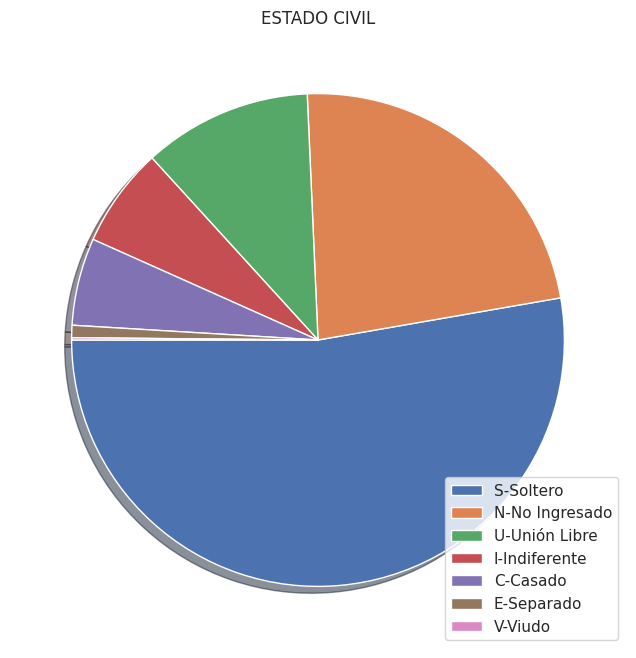

In [953]:
plt.figure(figsize=(12, 8))
plt.title('ESTADO CIVIL')
ay = df["ESTADO_CIVIL"].value_counts()
#mylabels = df["ESTADO_CIVIL"].unique() #["V-Viudo", "E-Separado", "U-Unión Libre", "C-Casado", "S-Soltero", "I-Indiferente", "N-No Ingresado"]
mylabels = ["S-Soltero","N-No Ingresado", "U-Unión Libre","I-Indiferente" ,"C-Casado","E-Separado","V-Viudo"]
plt.pie(df["ESTADO_CIVIL"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

In [954]:
print("SOLTERO  {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'S', axis=1).sum() / len(df) *100))
print("UNION LIBRE {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'U', axis=1).sum() / len(df) *100))
print("CASADO {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'C', axis=1).sum() / len(df) *100))
print("VIUDO {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'V', axis=1).sum() / len(df) *100))
print("SEPARADO {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'E', axis=1).sum() / len(df) *100))
print("INDIFERENTE {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'I', axis=1).sum() / len(df) *100))
print("NO INGRESADO {:.2f} %".format(df.apply(lambda x: x['ESTADO_CIVIL'] == 'N', axis=1).sum() / len(df) *100))


SOLTERO  52.74 %
UNION LIBRE 11.07 %
CASADO 5.73 %
VIUDO 0.15 %
SEPARADO 0.81 %
INDIFERENTE 6.54 %
NO INGRESADO 22.96 %


In [955]:
frecuencia = df["ESTADO_CIVIL"].value_counts()
total_valores = len(df["ESTADO_CIVIL"])
for ESTADO_CIVIL, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"ESTADO_CIVIL: {ESTADO_CIVIL}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

ESTADO_CIVIL: S, Frecuencia: 20622, Porcentaje: 52.74%
ESTADO_CIVIL: N, Frecuencia: 8977, Porcentaje: 22.96%
ESTADO_CIVIL: U, Frecuencia: 4330, Porcentaje: 11.07%
ESTADO_CIVIL: I, Frecuencia: 2557, Porcentaje: 6.54%
ESTADO_CIVIL: C, Frecuencia: 2242, Porcentaje: 5.73%
ESTADO_CIVIL: E, Frecuencia: 317, Porcentaje: 0.81%
ESTADO_CIVIL: V, Frecuencia: 57, Porcentaje: 0.15%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTADO CIVIL'}, xlabel='ESTADO_CIVIL', ylabel='No. DE APRENDICES'>

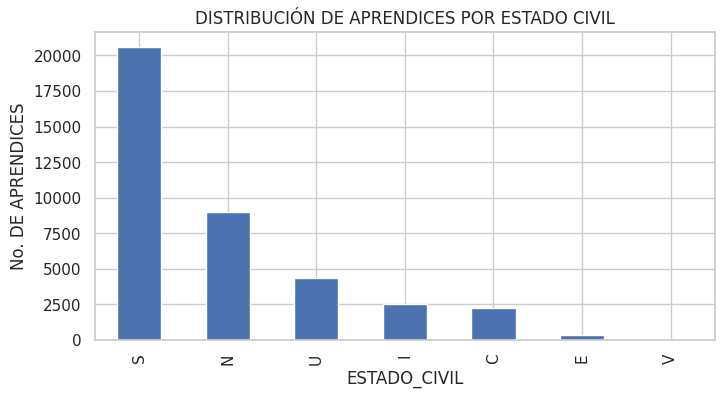

In [956]:
plt.xlabel("ESTADO_CIVIL")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTADO CIVIL")
df["ESTADO_CIVIL"].value_counts().plot(kind='bar', figsize=(8,4))

Análisis ESTRATO

In [957]:
#Estado civil del usuario. Valores de chequeo: V - Viudo; E - Separado ; U - Unión Libre ; C - Casado; S - Soltero; I - Indiferente ,  N No Ingresado
df["ESTRATO"].value_counts()

ESTRATO
1    19781
2    14610
3     4423
4      238
5       38
6       12
Name: count, dtype: int64

In [958]:
df["ESTRATO"].unique()

array([2, 1, 3, 6, 4, 5])

In [959]:
frecuencia = df["ESTRATO"].value_counts()
total_valores = len(df["ESTRATO"])
for ESTRATO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"ESTRATO: {ESTRATO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

ESTRATO: 1, Frecuencia: 19781, Porcentaje: 50.59%
ESTRATO: 2, Frecuencia: 14610, Porcentaje: 37.36%
ESTRATO: 3, Frecuencia: 4423, Porcentaje: 11.31%
ESTRATO: 4, Frecuencia: 238, Porcentaje: 0.61%
ESTRATO: 5, Frecuencia: 38, Porcentaje: 0.10%
ESTRATO: 6, Frecuencia: 12, Porcentaje: 0.03%


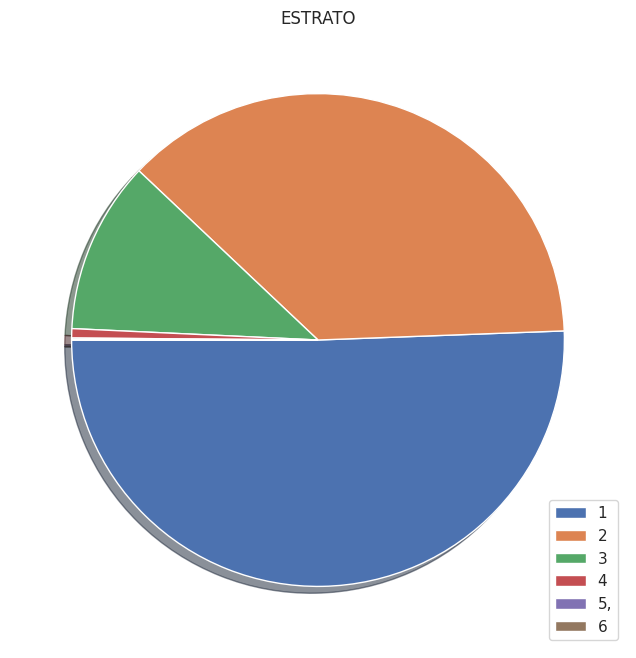

In [960]:
plt.figure(figsize=(12, 8))
plt.title('ESTRATO')
ay = df["ESTRATO"].value_counts()
mylabels = ['1', '2', '3', '4', '5,', '6']
plt.pie(df["ESTRATO"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTRATO'}, xlabel='ESTRATO', ylabel='No. DE APRENDICES'>

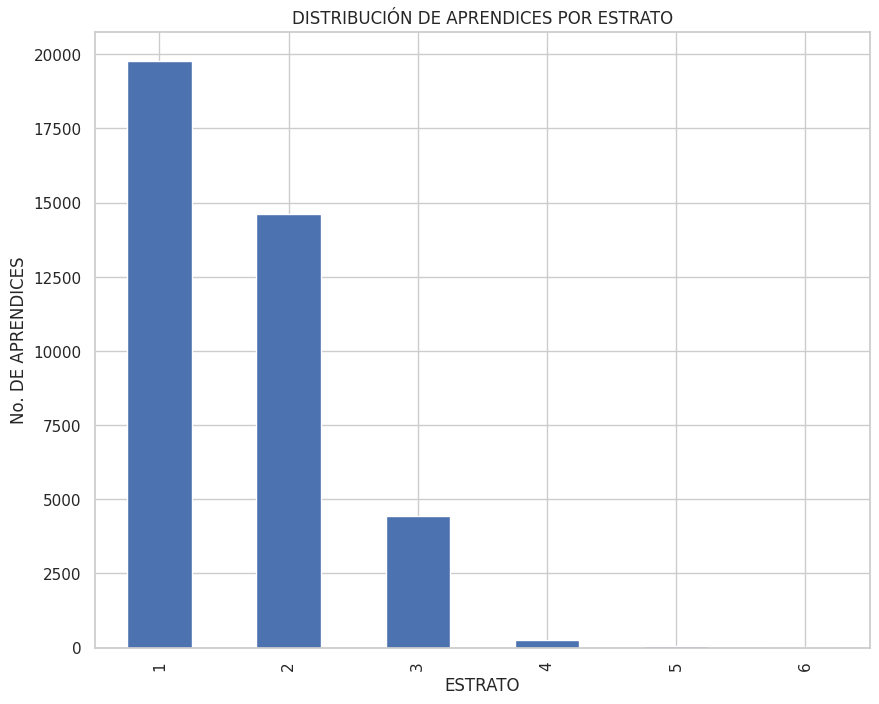

In [961]:
plt.xlabel("ESTRATO")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTRATO")
df["ESTRATO"].value_counts().plot(kind='bar', figsize=(10,8))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTRATO'}, ylabel='ESTRATO'>

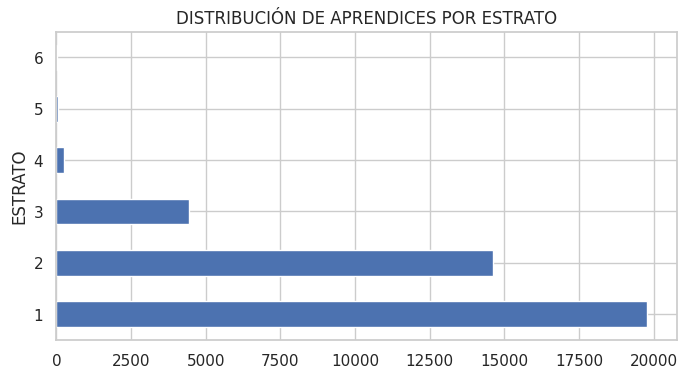

In [962]:
plt.xlabel("ESTRATO")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTRATO")
df["ESTRATO"].value_counts().plot(kind='barh', figsize=(8,4))

PUNTAJE ICFES

In [963]:
df["PUNTAJE_ICFES"].value_counts()

PUNTAJE_ICFES
45,00     33
250,00    27
298,00    25
300,00    23
48,00     21
          ..
652,00     1
422,00     1
134,00     1
424,00     1
449,00     1
Name: count, Length: 398, dtype: int64

In [964]:
df["PUNTAJE_ICFES"].isnull().sum()

37192

In [965]:
ICFES = df['PUNTAJE_ICFES'].str.replace(',', '.')
ICFES = ICFES.astype(float)

In [966]:
print("Valor máximo de FCH_REGISTRO:", ICFES.max())
print("Valor mínimo de FCH_REGISTRO:", ICFES.min())

Valor máximo de FCH_REGISTRO: 999.0
Valor mínimo de FCH_REGISTRO: 1.0


NIVEL_SISBEN

In [967]:
df["NIVEL_SISBEN"].value_counts()

NIVEL_SISBEN
1.0    3202
2.0    2139
6.0    1127
3.0     523
4.0       4
Name: count, dtype: int64

In [968]:
df["NIVEL_SISBEN"].unique()

array([nan,  1.,  2.,  3.,  6.,  4.])

In [969]:
df["NIVEL_SISBEN"].isnull().sum()

32107

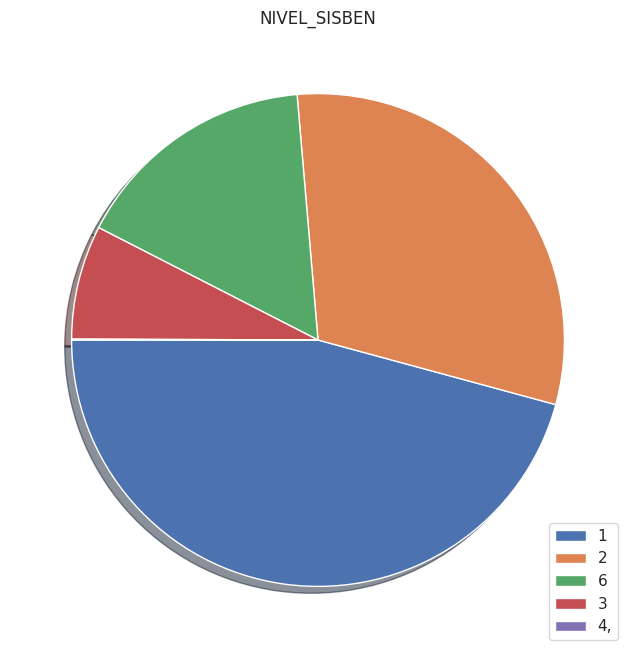

In [970]:
plt.figure(figsize=(12, 8))
plt.title('NIVEL_SISBEN')
ay = df["NIVEL_SISBEN"].value_counts()
mylabels = ['1', '2', '6', '3', '4,', 'nan']
plt.pie(df["NIVEL_SISBEN"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

DBU_HIJOS

In [971]:
df["DBU_HIJOS"].value_counts()

DBU_HIJOS
0.0    94
1.0    14
2.0     7
Name: count, dtype: int64

In [972]:
df["DBU_HIJOS"].unique()

array([nan,  0.,  1.,  2.])

In [973]:
print("Cantidad de nulos: ", df["DBU_HIJOS"].isnull().sum(), "  y  corresponde al ", df["DBU_HIJOS"].isnull().sum()/len(df["DBU_HIJOS"]) *100, " %")

Cantidad de nulos:  38987   y  corresponde al  99.7058973965526  %


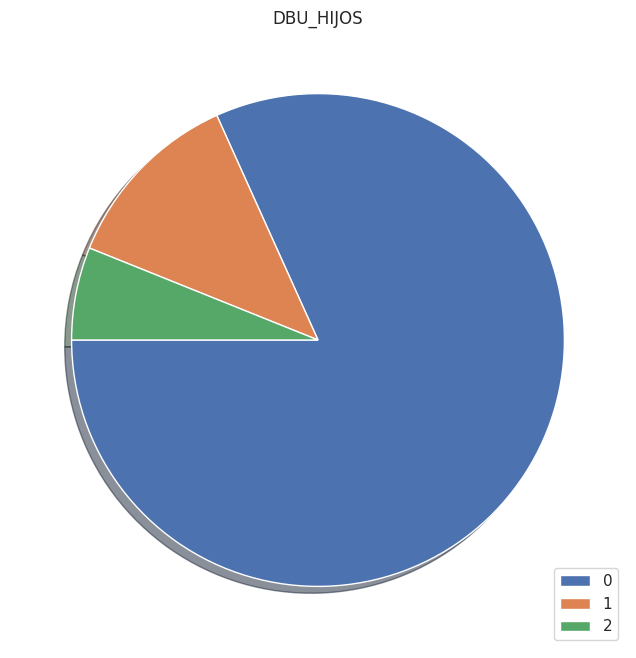

In [974]:
plt.figure(figsize=(12, 8))
plt.title('DBU_HIJOS')
ay = df["DBU_HIJOS"].value_counts()
mylabels = ['0', '1', '2', 'nan']
plt.pie(df["DBU_HIJOS"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR NÚMERO DE HIJOS'}, xlabel='DBU_HIJOS', ylabel='No. DE APRENDICES'>

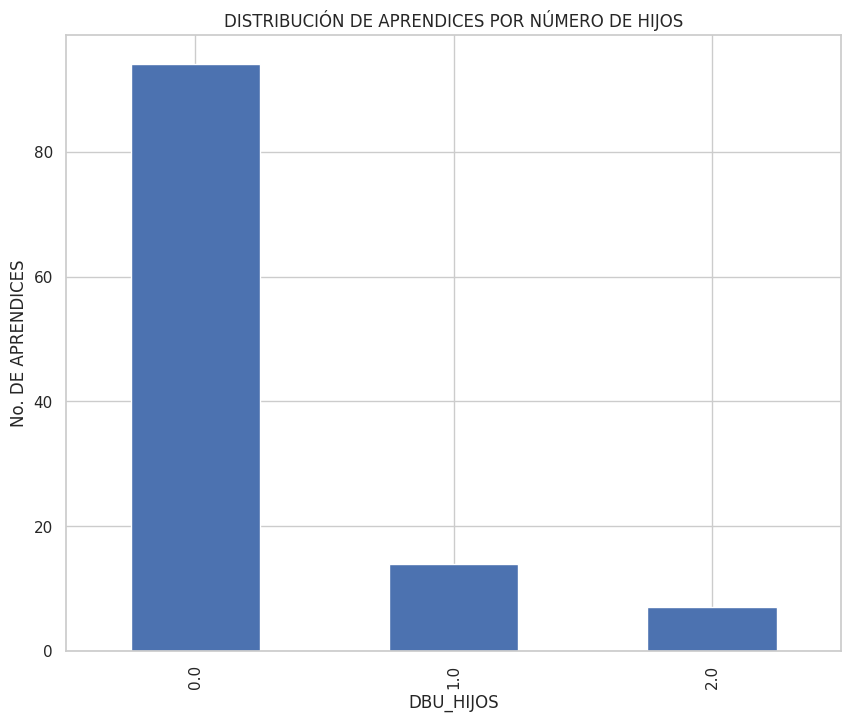

In [975]:
plt.xlabel("NÚMERO DE HIJOS")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR NÚMERO DE HIJOS")
df["DBU_HIJOS"].value_counts().plot(kind='bar', figsize=(10,8))

COD_PAIS_RESIDENCIA

In [976]:
df["COD_PAIS_RESIDENCIA"].value_counts()

COD_PAIS_RESIDENCIA
57     39077
58         6
34         5
56         3
147        1
351        1
39         1
32         1
51         1
61         1
49         1
593        1
54         1
40         1
52         1
Name: count, dtype: int64

In [977]:
df["COD_PAIS_RESIDENCIA"].unique()

array([ 57, 147, 351,  39,  34,  32,  58,  51,  61,  49, 593,  56,  54,
        40,  52])

In [978]:
frecuencia = df["COD_PAIS_RESIDENCIA"].value_counts()
total_valores = len(df["COD_PAIS_RESIDENCIA"])
for COD_PAIS_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"COD_PAIS_RESIDENCIA: {COD_PAIS_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_PAIS_RESIDENCIA: 57, Frecuencia: 39077, Porcentaje: 99.94%
COD_PAIS_RESIDENCIA: 58, Frecuencia: 6, Porcentaje: 0.02%
COD_PAIS_RESIDENCIA: 34, Frecuencia: 5, Porcentaje: 0.01%
COD_PAIS_RESIDENCIA: 56, Frecuencia: 3, Porcentaje: 0.01%
COD_PAIS_RESIDENCIA: 147, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 351, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 39, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 32, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 51, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 61, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 49, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 593, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 54, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 40, Frecuencia: 1, Porcentaje: 0.00%
COD_PAIS_RESIDENCIA: 52, Frecuencia: 1, Porcentaje: 0.00%


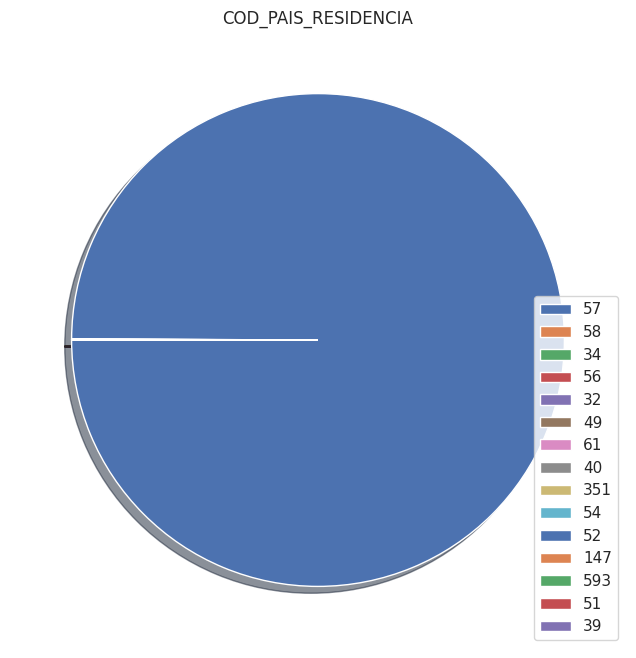

In [979]:
plt.figure(figsize=(12, 8))
plt.title('COD_PAIS_RESIDENCIA')
ay = df["COD_PAIS_RESIDENCIA"].value_counts()
mylabels = [57,  58,  34,  56,  32, 49, 61,  40, 351,  54,  52, 147, 593,
        51,  39]
plt.pie(df["COD_PAIS_RESIDENCIA"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR PAIS DE RESIDENCIA'}, ylabel='COD_PAIS_RESIDENCIA'>

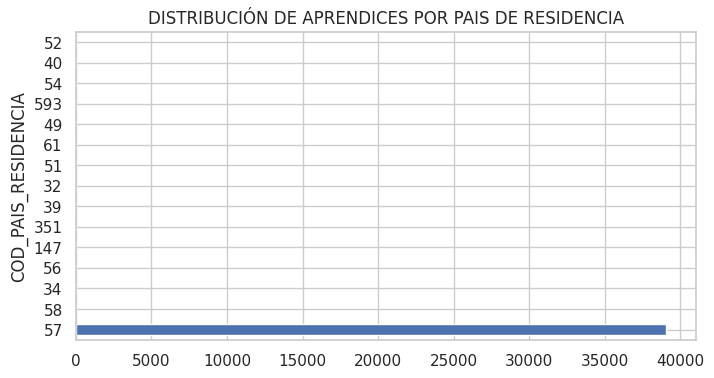

In [980]:
plt.xlabel("PAIS DE RESIDENCIA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR PAIS DE RESIDENCIA")
df["COD_PAIS_RESIDENCIA"].value_counts().plot(kind='barh',  figsize=(8,4))

In [981]:
df["PAIS_RESIDENCIA"].unique()

array(['COLOMBIA', 'ESTADOS UNIDOS', 'PORTUGAL', 'ITALIA', 'ESPAÑA',
       'BÉLGICA', 'VENEZUELA', 'PERÚ', 'AUSTRALIA', 'ALEMANIA', 'ECUADOR',
       'CHILE', 'ARGENTINA', 'RUMANIA', 'MÉXICO'], dtype=object)

In [982]:
frecuencia = df["PAIS_RESIDENCIA"].value_counts()
total_valores = len(df["PAIS_RESIDENCIA"])
for PAIS_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"PAIS_RESIDENCIA: {PAIS_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

PAIS_RESIDENCIA: COLOMBIA, Frecuencia: 39077, Porcentaje: 99.94%
PAIS_RESIDENCIA: VENEZUELA, Frecuencia: 6, Porcentaje: 0.02%
PAIS_RESIDENCIA: ESPAÑA, Frecuencia: 5, Porcentaje: 0.01%
PAIS_RESIDENCIA: CHILE, Frecuencia: 3, Porcentaje: 0.01%
PAIS_RESIDENCIA: ESTADOS UNIDOS, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: PORTUGAL, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: ITALIA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: BÉLGICA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: PERÚ, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: AUSTRALIA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: ALEMANIA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: ECUADOR, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: ARGENTINA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: RUMANIA, Frecuencia: 1, Porcentaje: 0.00%
PAIS_RESIDENCIA: MÉXICO, Frecuencia: 1, Porcentaje: 0.00%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR PAIS DE RESIDENCIA'}, xlabel='PAIS_RESIDENCIA', ylabel='No. DE APRENDICES'>

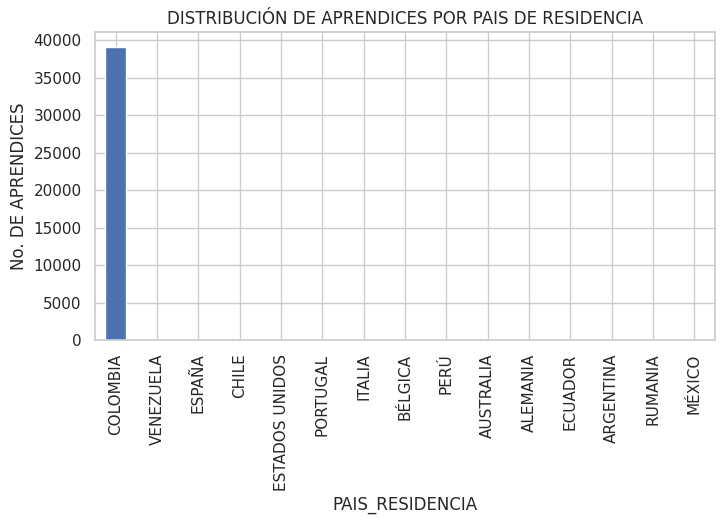

In [983]:
plt.xlabel("PAIS DE RESIDENCIA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR PAIS DE RESIDENCIA")
df["PAIS_RESIDENCIA"].value_counts().plot(kind='bar',  figsize=(8,4))

COD_DPTO_RESIDENCIA

In [984]:
df["COD_DPTO_RESIDENCIA"].value_counts()

COD_DPTO_RESIDENCIA
57011     9208
57005     3950
57025     3791
57068     1980
57008     1805
57023     1553
57054     1443
57076     1412
57013     1402
57015     1275
57086     1038
57047      886
57041      867
57066      848
57085      828
57063      817
57050      749
57073      732
57052      616
57027      591
57070      586
57019      470
57017      438
57081      397
57018      378
57095      204
57044      186
57094      171
57020      156
57099      103
57088       85
57097       68
57091       44
58019        5
34051        3
593020       1
56004        1
34046        1
40041        1
56013        1
54008        1
56009        1
51013        1
49010        1
61006        1
147013       1
58003        1
32001        1
34014        1
39070        1
351015       1
52008        1
Name: count, dtype: int64

In [985]:
df["COD_DPTO_RESIDENCIA"].unique()

array([ 57066,  57017,  57073,  57011,  57050,  57068,  57015,  57019,
        57020,  57023,  57013,  57047,  57008,  57025,  57076,  57005,
        57081,  57085,  57018,  57054,  57099,  57086,  57052, 147013,
        57070,  57088,  57094,  57044,  57063,  57027,  57041, 351015,
        39070,  57095,  57091,  34014,  32001,  57097,  58003,  58019,
        51013,  61006,  49010, 593020,  56009,  54008,  34051,  56013,
        40041,  34046,  56004,  52008])

In [986]:
print("Número de valores únicos: ",len(df["COD_DPTO_RESIDENCIA"].unique()))

Número de valores únicos:  52


In [987]:
frecuencia = df["COD_DPTO_RESIDENCIA"].value_counts()
total_valores = len(df["COD_DPTO_RESIDENCIA"])
for COD_DPTO_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1500:
      print(f"COD_DPTO_RESIDENCIA: {COD_DPTO_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_DPTO_RESIDENCIA: 57011, Frecuencia: 9208, Porcentaje: 23.55%
COD_DPTO_RESIDENCIA: 57005, Frecuencia: 3950, Porcentaje: 10.10%
COD_DPTO_RESIDENCIA: 57025, Frecuencia: 3791, Porcentaje: 9.70%
COD_DPTO_RESIDENCIA: 57068, Frecuencia: 1980, Porcentaje: 5.06%
COD_DPTO_RESIDENCIA: 57008, Frecuencia: 1805, Porcentaje: 4.62%
COD_DPTO_RESIDENCIA: 57023, Frecuencia: 1553, Porcentaje: 3.97%


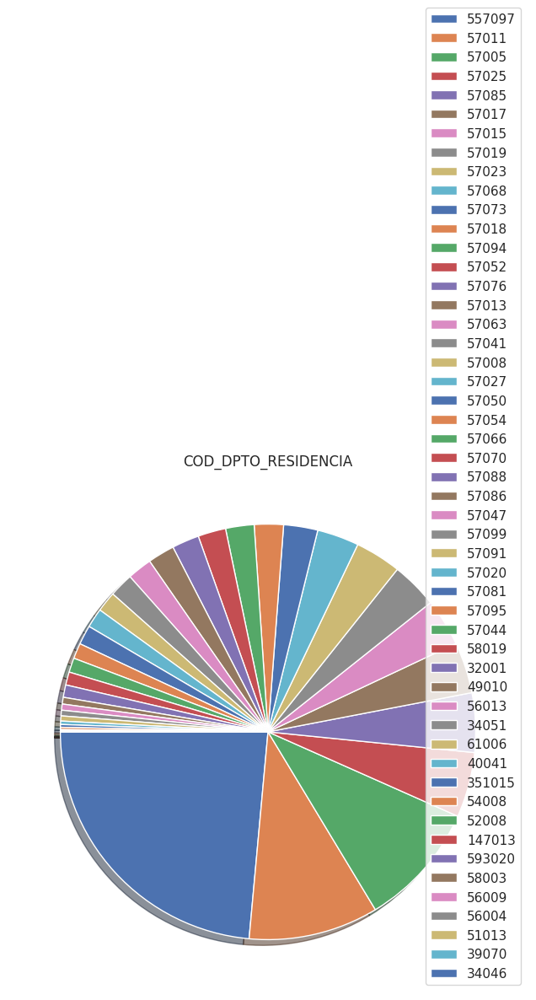

In [988]:
plt.figure(figsize=(12, 8))
plt.title('COD_DPTO_RESIDENCIA')
ay = df["COD_DPTO_RESIDENCIA"].value_counts()
mylabels = [557097,  57011,  57005,  57025,  57085,  57017,  57015,  57019,
        57023,  57068,  57073,  57018,  57094,  57052,  57076,  57013,
        57063,  57041,  57008,  57027,  57050,  57054,  57066,  57070,
        57088,  57086,  57047,  57099,  57091,  57020,  57081,  57095,
        57044,  58019,  32001,  49010,  56013,  34051,  61006,  40041,
       351015,  54008,  52008, 147013, 593020,  58003,  56009,  56004,
        51013,  39070,  34046]
plt.pie(df["COD_DPTO_RESIDENCIA"].value_counts(),  startangle = 180,shadow = True)
plt.legend(mylabels, loc='lower right',)
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR DPTO DE RESIDENCIA'}, xlabel='COD_DPTO_RESIDENCIA', ylabel='No. DE APRENDICES'>

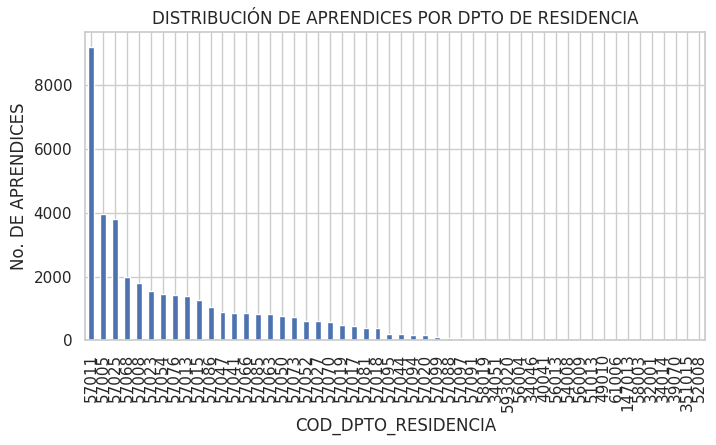

In [989]:
plt.xlabel("DEPARTAMENTO DE RESIDENCIA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR DPTO DE RESIDENCIA")
df["COD_DPTO_RESIDENCIA"].value_counts().plot(kind='bar',  figsize=(8,4))

In [990]:
df["DPTO_RESIDENCIA"].value_counts()

DPTO_RESIDENCIA
BOGOTÁ D.C.                         9208
ANTIOQUIA                           3950
CUNDINAMARCA                        3791
SANTANDER                           1980
ATLÁNTICO                           1805
CÓRDOBA                             1553
NORTE DE SANTANDER                  1443
VALLE DEL CAUCA                     1412
BOLÍVAR                             1402
BOYACÁ                              1275
PUTUMAYO                            1037
MAGDALENA                            885
HUILA                                867
RISARALDA                            848
CASANARE                             828
QUINDÍO                              817
META                                 749
TOLIMA                               732
NARIÑO                               616
CHOCÓ                                591
SUCRE                                586
CAUCA                                470
CALDAS                               438
ARAUCA                               397


In [991]:
df["DPTO_RESIDENCIA"].unique()

array(['RISARALDA', 'CALDAS', 'TOLIMA', 'BOGOTÁ D.C.', 'META',
       'SANTANDER', 'BOYACÁ', 'CAUCA', 'CESAR', 'CÓRDOBA', 'BOLÍVAR',
       'MAGDALENA', 'ATLÁNTICO', 'CUNDINAMARCA', 'VALLE DEL CAUCA',
       'ANTIOQUIA', 'ARAUCA', 'CASANARE', 'CAQUETÁ', 'NORTE DE SANTANDER',
       'VICHADA', 'PUTUMAYO', 'NARIÑO', 'FLORIDA', 'SUCRE',
       'SAN ANDRÉS Y PROVIDENCIA', 'GUAINÍA', 'LA GUAJIRA', 'QUINDÍO',
       'CHOCÓ', 'HUILA', 'SETÚBAL', 'ANCONA', 'GUAVIARE', 'AMAZONAS',
       'ASTURIAS', 'BRUSELAS', 'VAUPÉS', 'APURE', 'TÁCHIRA', 'LIMA',
       'PUTUMAYO ', 'VICTORIA', 'MAGDALENA ',
       'RENANIA SEPTENTRIONAL-WESTFALIA', 'PICHINCHA', 'IX LA ARAUCANÍA',
       'DISTRITO FEDERAL', 'MADRID', 'REGIÓN METROPOLITANA DE SANTIAGO',
       'BUCAREST', 'A CORUÑA', 'IV COQUIMBO', 'DURANGO'], dtype=object)

In [992]:
print("Número de valores únicos: ",len(df["DPTO_RESIDENCIA"].unique()))

Número de valores únicos:  54


In [993]:
frecuencia = df["DPTO_RESIDENCIA"].value_counts()
total_valores = len(df["DPTO_RESIDENCIA"])
for DPTO_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1500:
      print(f"DPTO_RESIDENCIA: {DPTO_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

DPTO_RESIDENCIA: BOGOTÁ D.C., Frecuencia: 9208, Porcentaje: 23.55%
DPTO_RESIDENCIA: ANTIOQUIA, Frecuencia: 3950, Porcentaje: 10.10%
DPTO_RESIDENCIA: CUNDINAMARCA, Frecuencia: 3791, Porcentaje: 9.70%
DPTO_RESIDENCIA: SANTANDER, Frecuencia: 1980, Porcentaje: 5.06%
DPTO_RESIDENCIA: ATLÁNTICO, Frecuencia: 1805, Porcentaje: 4.62%
DPTO_RESIDENCIA: CÓRDOBA, Frecuencia: 1553, Porcentaje: 3.97%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR DPTO DE RESIDENCIA'}, xlabel='DPTO_RESIDENCIA', ylabel='No. DE APRENDICES'>

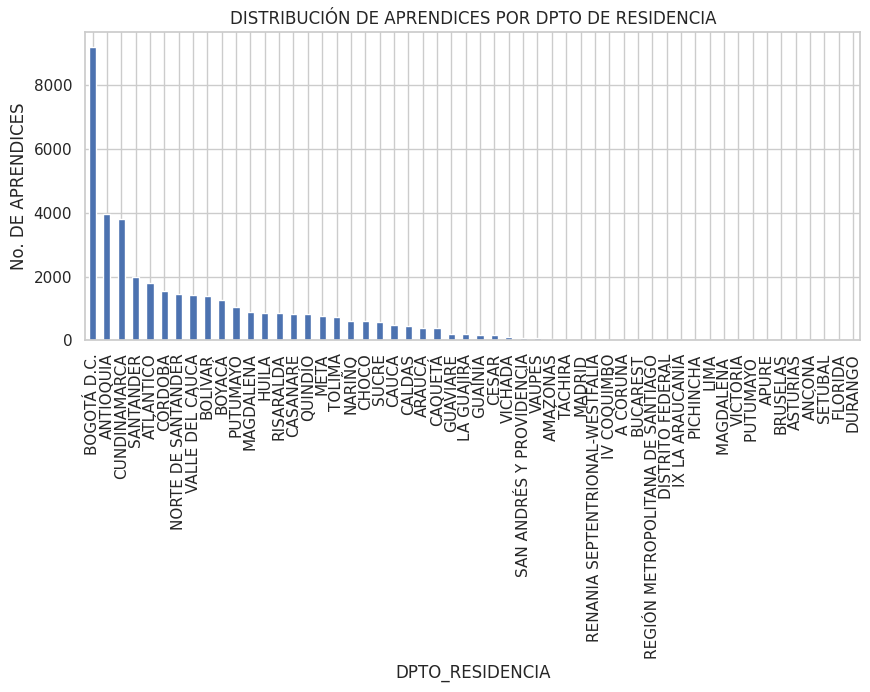

In [994]:
plt.xlabel("DEPARTAMENTO DE RESIDENCIA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR DPTO DE RESIDENCIA")
df["DPTO_RESIDENCIA"].value_counts().plot(kind='bar',  figsize=(10,4))

In [995]:
df["COD_MUNICIPIO_RESIDENCIA"].value_counts()

COD_MUNICIPIO_RESIDENCIA
57011001     9208
57005001     1698
57013001     1066
57025754      948
57008001      914
             ... 
351015001       1
57025328        1
57070678        1
57005321        1
57068468        1
Name: count, Length: 900, dtype: int64

In [996]:
print("Número de valores únicos: ",len(df["COD_MUNICIPIO_RESIDENCIA"].unique()))

Número de valores únicos:  900


In [997]:
frecuencia = df["COD_MUNICIPIO_RESIDENCIA"].value_counts()
total_valores = len(df["COD_MUNICIPIO_RESIDENCIA"])
for municipio, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo >= 500:
      print(f"Municipio: {municipio}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

Municipio: 57011001, Frecuencia: 9208, Porcentaje: 23.55%
Municipio: 57005001, Frecuencia: 1698, Porcentaje: 4.34%
Municipio: 57013001, Frecuencia: 1066, Porcentaje: 2.73%
Municipio: 57025754, Frecuencia: 948, Porcentaje: 2.42%
Municipio: 57008001, Frecuencia: 914, Porcentaje: 2.34%
Municipio: 57076001, Frecuencia: 696, Porcentaje: 1.78%
Municipio: 57054001, Frecuencia: 590, Porcentaje: 1.51%
Municipio: 57063001, Frecuencia: 536, Porcentaje: 1.37%


In [998]:
df["MUNICIPIO_RESIDENCIA"].value_counts()

MUNICIPIO_RESIDENCIA
BOGOTÁ                 9208
MEDELLÍN               1698
CARTAGENA              1066
SOACHA                  948
BARRANQUILLA            914
                       ... 
MIAMI                     1
GUAYABAL DE SIQUIMA       1
SAN BENITO ABAD           1
GUATAPÉ                   1
MOLAGAVITA                1
Name: count, Length: 853, dtype: int64

In [999]:
print("Número de valores únicos: ",len(df["MUNICIPIO_RESIDENCIA"].unique()))

Número de valores únicos:  853


In [1000]:
frecuencia = df["MUNICIPIO_RESIDENCIA"].value_counts()
total_valores = len(df["MUNICIPIO_RESIDENCIA"])
for municipio, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo >= 400:
      print(f"Municipio: {municipio}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

Municipio: BOGOTÁ, Frecuencia: 9208, Porcentaje: 23.55%
Municipio: MEDELLÍN, Frecuencia: 1698, Porcentaje: 4.34%
Municipio: CARTAGENA, Frecuencia: 1066, Porcentaje: 2.73%
Municipio: SOACHA, Frecuencia: 948, Porcentaje: 2.42%
Municipio: BARRANQUILLA, Frecuencia: 914, Porcentaje: 2.34%
Municipio: CALI, Frecuencia: 696, Porcentaje: 1.78%
Municipio: CÚCUTA, Frecuencia: 590, Porcentaje: 1.51%
Municipio: ARMENIA, Frecuencia: 537, Porcentaje: 1.37%
Municipio: VILLAVICENCIO, Frecuencia: 494, Porcentaje: 1.26%
Municipio: SOLEDAD, Frecuencia: 467, Porcentaje: 1.19%
Municipio: BUCARAMANGA, Frecuencia: 449, Porcentaje: 1.15%
Municipio: IBAGUÉ, Frecuencia: 437, Porcentaje: 1.12%
Municipio: YOPAL, Frecuencia: 425, Porcentaje: 1.09%


In [1001]:
df["COD_ZONA_RESIDENCIA"].value_counts()

COD_ZONA_RESIDENCIA
7.0      189
8.0      174
11.0     164
19.0     112
10.0     109
        ... 
354.0      1
194.0      1
349.0      1
39.0       1
225.0      1
Name: count, Length: 273, dtype: int64

In [1002]:
print("Número de valores únicos: ",len(df["COD_ZONA_RESIDENCIA"].unique()))

Número de valores únicos:  274


In [1003]:
frecuencia = df["COD_ZONA_RESIDENCIA"].value_counts()
total_valores = len(df["COD_ZONA_RESIDENCIA"])
for COD_ZONA_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo >= 100:
      print(f"COD_ZONA_RESIDENCIA: {COD_ZONA_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_ZONA_RESIDENCIA: 7.0, Frecuencia: 189, Porcentaje: 0.48%
COD_ZONA_RESIDENCIA: 8.0, Frecuencia: 174, Porcentaje: 0.44%
COD_ZONA_RESIDENCIA: 11.0, Frecuencia: 164, Porcentaje: 0.42%
COD_ZONA_RESIDENCIA: 19.0, Frecuencia: 112, Porcentaje: 0.29%
COD_ZONA_RESIDENCIA: 10.0, Frecuencia: 109, Porcentaje: 0.28%


In [1004]:
valores_nulos = df["COD_ZONA_RESIDENCIA"].isnull().sum()
total_valores = len(df["COD_ZONA_RESIDENCIA"])
porcentaje_nulos = (valores_nulos / total_valores) * 100
print(f"Valores nulos en 'COD_ZONA_RESIDENCIA': {valores_nulos}")
print(f"Porcentaje de valores nulos: {porcentaje_nulos:.2f}%")

Valores nulos en 'COD_ZONA_RESIDENCIA': 36311
Porcentaje de valores nulos: 92.86%


In [1005]:
df["COD_BARRIO_RESIDENCIA"].value_counts()

COD_BARRIO_RESIDENCIA
304.0     33
424.0     19
2920.0    16
664.0     14
2298.0    14
          ..
2123.0     1
8579.0     1
637.0      1
9016.0     1
702.0      1
Name: count, Length: 1248, dtype: int64

In [1006]:
print("Número de valores únicos: ",len(df["COD_BARRIO_RESIDENCIA"].unique()))

Número de valores únicos:  1249


In [1007]:
frecuencia = df["COD_BARRIO_RESIDENCIA"].value_counts()
total_valores = len(df["COD_BARRIO_RESIDENCIA"])
for COD_BARRIO_RESIDENCIA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo >= 14:
      print(f"COD_BARRIO_RESIDENCIA: {COD_BARRIO_RESIDENCIA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_BARRIO_RESIDENCIA: 304.0, Frecuencia: 33, Porcentaje: 0.08%
COD_BARRIO_RESIDENCIA: 424.0, Frecuencia: 19, Porcentaje: 0.05%
COD_BARRIO_RESIDENCIA: 2920.0, Frecuencia: 16, Porcentaje: 0.04%
COD_BARRIO_RESIDENCIA: 664.0, Frecuencia: 14, Porcentaje: 0.04%
COD_BARRIO_RESIDENCIA: 2298.0, Frecuencia: 14, Porcentaje: 0.04%


In [1008]:
valores_nulos = df["COD_BARRIO_RESIDENCIA"].isnull().sum()
total_valores = len(df["COD_BARRIO_RESIDENCIA"])
porcentaje_nulos = (valores_nulos / total_valores) * 100
print(f"Valores nulos en 'COD_BARRIO_RESIDENCIA': {valores_nulos}")
print(f"Porcentaje de valores nulos: {porcentaje_nulos:.2f}%")

Valores nulos en 'COD_BARRIO_RESIDENCIA': 36675
Porcentaje de valores nulos: 93.79%


In [1009]:
df["CODIGO_ESTADO"].value_counts()

CODIGO_ESTADO
3     19905
2     12352
6      3495
11     1776
7      1320
12      219
1        15
4        14
8         6
Name: count, dtype: int64

In [1010]:
df["CODIGO_ESTADO"].isnull().sum()

0

In [1011]:
print("Número de valores únicos: ",len(df["CODIGO_ESTADO"].unique()))

Número de valores únicos:  9


In [1012]:
frecuencia = df["CODIGO_ESTADO"].value_counts()
total_valores = len(df["CODIGO_ESTADO"])
for CODIGO_ESTADO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"CODIGO_ESTADO: {CODIGO_ESTADO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CODIGO_ESTADO: 3, Frecuencia: 19905, Porcentaje: 50.91%
CODIGO_ESTADO: 2, Frecuencia: 12352, Porcentaje: 31.59%
CODIGO_ESTADO: 6, Frecuencia: 3495, Porcentaje: 8.94%
CODIGO_ESTADO: 11, Frecuencia: 1776, Porcentaje: 4.54%
CODIGO_ESTADO: 7, Frecuencia: 1320, Porcentaje: 3.38%
CODIGO_ESTADO: 12, Frecuencia: 219, Porcentaje: 0.56%
CODIGO_ESTADO: 1, Frecuencia: 15, Porcentaje: 0.04%
CODIGO_ESTADO: 4, Frecuencia: 14, Porcentaje: 0.04%
CODIGO_ESTADO: 8, Frecuencia: 6, Porcentaje: 0.02%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTADO'}, xlabel='CODIGO_ESTADO', ylabel='No. DE APRENDICES'>

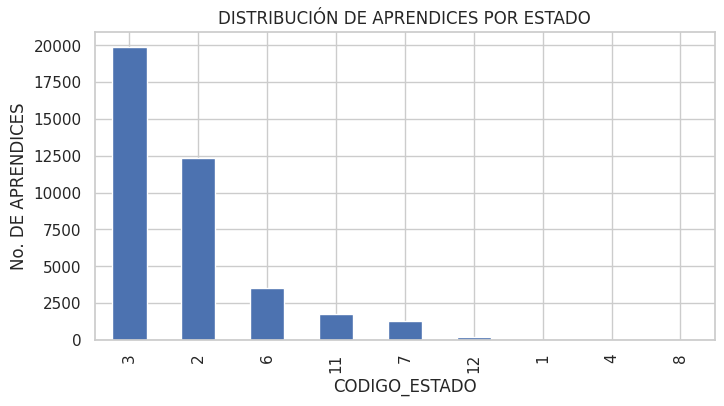

In [1013]:
plt.xlabel("CÓDIGO ESTADOS")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTADO")
df["CODIGO_ESTADO"].value_counts().plot(kind='bar',  figsize=(8,4))

In [1014]:
df["ESTADO_APRENDIZ"].value_counts()

ESTADO_APRENDIZ
CERTIFICADO          19905
CANCELADO            12352
RETIRO VOLUNTARIO     3495
TRASLADO              1776
FORMACION             1320
POR CERTIFICAR         219
APLAZADO                15
CONDICIONADO            14
INDUCCION                6
Name: count, dtype: int64

In [1015]:
df["ESTADO_APRENDIZ"].isnull().sum()

0

In [1016]:
frecuencia = df["ESTADO_APRENDIZ"].value_counts()
total_valores = len(df["ESTADO_APRENDIZ"])
for ESTADO_APRENDIZ, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"ESTADO_APRENDIZ: {ESTADO_APRENDIZ}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

ESTADO_APRENDIZ: CERTIFICADO, Frecuencia: 19905, Porcentaje: 50.91%
ESTADO_APRENDIZ: CANCELADO, Frecuencia: 12352, Porcentaje: 31.59%
ESTADO_APRENDIZ: RETIRO VOLUNTARIO, Frecuencia: 3495, Porcentaje: 8.94%
ESTADO_APRENDIZ: TRASLADO, Frecuencia: 1776, Porcentaje: 4.54%
ESTADO_APRENDIZ: FORMACION, Frecuencia: 1320, Porcentaje: 3.38%
ESTADO_APRENDIZ: POR CERTIFICAR, Frecuencia: 219, Porcentaje: 0.56%
ESTADO_APRENDIZ: APLAZADO, Frecuencia: 15, Porcentaje: 0.04%
ESTADO_APRENDIZ: CONDICIONADO, Frecuencia: 14, Porcentaje: 0.04%
ESTADO_APRENDIZ: INDUCCION, Frecuencia: 6, Porcentaje: 0.02%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTADO DEL APRENDIZ'}, xlabel='ESTADO_APRENDIZ', ylabel='No. DE APRENDICES'>

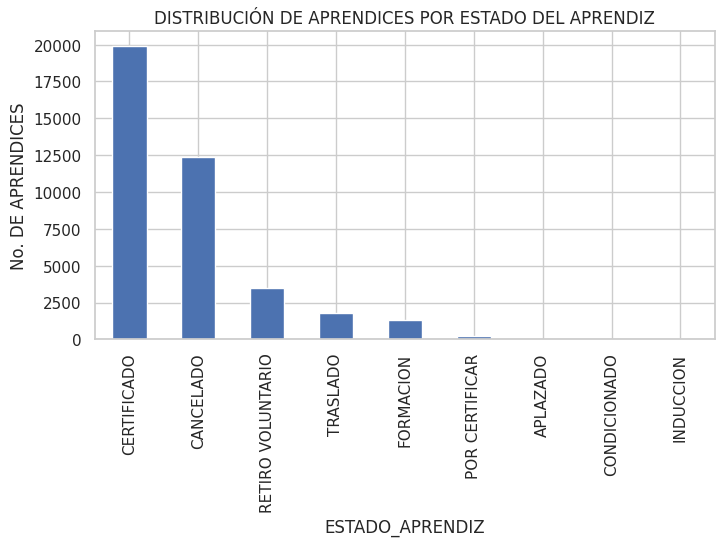

In [1017]:
plt.xlabel("ESTADO_APRENDIZ")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTADO DEL APRENDIZ")
df["ESTADO_APRENDIZ"].value_counts().plot(kind='bar',  figsize=(8,4))

In [1018]:
df["COD_NIVEL_FORMACION"].value_counts()

COD_NIVEL_FORMACION
2      26480
6      10162
7       1038
10       978
1        379
223       65
Name: count, dtype: int64

In [1019]:
nulos=df["COD_NIVEL_FORMACION"].isnull().sum()
unicos = len(df["COD_NIVEL_FORMACION"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  6


In [1020]:
frecuencia = df["COD_NIVEL_FORMACION"].value_counts()
total_valores = len(df["COD_NIVEL_FORMACION"])
for COD_NIVEL_FORMACION, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"COD_NIVEL_FORMACION: {COD_NIVEL_FORMACION}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_NIVEL_FORMACION: 2, Frecuencia: 26480, Porcentaje: 67.72%
COD_NIVEL_FORMACION: 6, Frecuencia: 10162, Porcentaje: 25.99%
COD_NIVEL_FORMACION: 7, Frecuencia: 1038, Porcentaje: 2.65%
COD_NIVEL_FORMACION: 10, Frecuencia: 978, Porcentaje: 2.50%
COD_NIVEL_FORMACION: 1, Frecuencia: 379, Porcentaje: 0.97%
COD_NIVEL_FORMACION: 223, Frecuencia: 65, Porcentaje: 0.17%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR COD_NIVEL_FORMACION'}, xlabel='COD_NIVEL_FORMACION', ylabel='No. DE APRENDICES'>

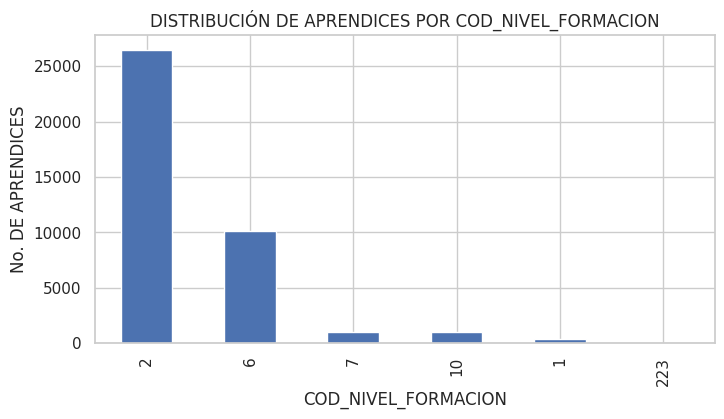

In [1021]:
plt.xlabel("COD_NIVEL_FORMACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR COD_NIVEL_FORMACION")
df["COD_NIVEL_FORMACION"].value_counts().plot(kind='bar', figsize=(8,4))

In [1022]:
df["NIVEL_FORMACION"].value_counts()

NIVEL_FORMACION
TÉCNICO                        26480
TECNÓLOGO                      10162
ESPECIALIZACIÓN TECNOLÓGICA     1038
OPERARIO                         978
AUXILIAR                         379
PROFUNDIZACIÓN TÉCNICA            65
Name: count, dtype: int64

In [1023]:
nulos=df["NIVEL_FORMACION"].isnull().sum()
unicos = len(df["NIVEL_FORMACION"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  6


In [1024]:
frecuencia = df["NIVEL_FORMACION"].value_counts()
total_valores = len(df["NIVEL_FORMACION"])
for NIVEL_FORMACION, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"NIVEL_FORMACION: {NIVEL_FORMACION}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NIVEL_FORMACION: TÉCNICO, Frecuencia: 26480, Porcentaje: 67.72%
NIVEL_FORMACION: TECNÓLOGO, Frecuencia: 10162, Porcentaje: 25.99%
NIVEL_FORMACION: ESPECIALIZACIÓN TECNOLÓGICA, Frecuencia: 1038, Porcentaje: 2.65%
NIVEL_FORMACION: OPERARIO, Frecuencia: 978, Porcentaje: 2.50%
NIVEL_FORMACION: AUXILIAR, Frecuencia: 379, Porcentaje: 0.97%
NIVEL_FORMACION: PROFUNDIZACIÓN TÉCNICA, Frecuencia: 65, Porcentaje: 0.17%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACION'}, xlabel='NIVEL_FORMACION', ylabel='No. DE APRENDICES'>

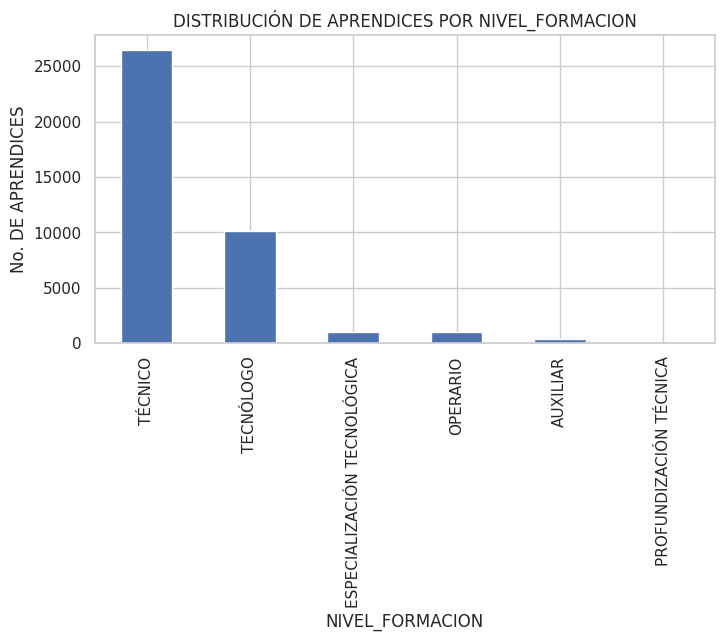

In [1025]:
plt.xlabel("NIVEL_FORMACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACION")
df["NIVEL_FORMACION"].value_counts().plot(kind='bar', figsize=(8,4))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACION'}, ylabel='NIVEL_FORMACION'>

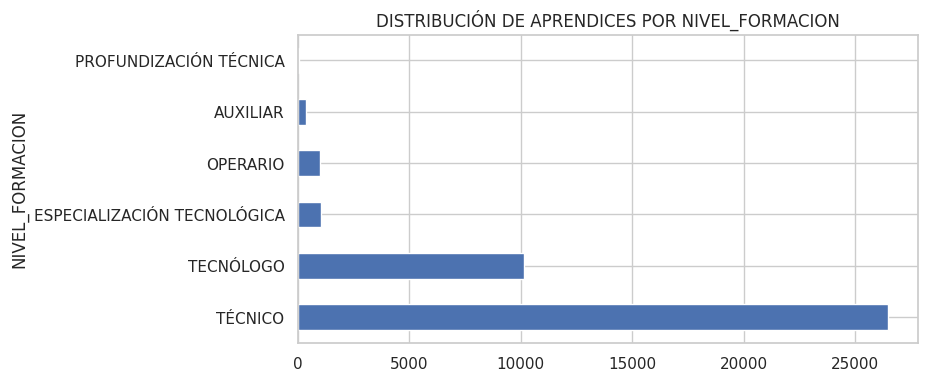

In [1026]:
plt.xlabel("NIVEL_FORMACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACION")
df["NIVEL_FORMACION"].value_counts().plot(kind='barh', figsize=(8,4))

In [1027]:
df["MODALIDAD"].value_counts()

MODALIDAD
PRESENCIAL    39102
Name: count, dtype: int64

In [1028]:
df["MODALIDAD"].isnull().sum()

0

In [1029]:
df["COD_PROGRAMA"].value_counts()

COD_PROGRAMA
122121    2361
228185    2341
112005    1478
133146    1367
134401    1231
          ... 
722303      15
836221      15
135304      15
931501      15
733302       7
Name: count, Length: 215, dtype: int64

In [1030]:
nulos=df["COD_PROGRAMA"].isnull().sum()
unicos = len(df["COD_PROGRAMA"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  215


In [1031]:
df["COD_PROGRAMA"].isnull().sum()

0

In [1032]:
frecuencia = df["COD_PROGRAMA"].value_counts()
total_valores = len(df["COD_PROGRAMA"])
for COD_PROGRAMA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1200:
      print(f"COD_PROGRAMA: {COD_PROGRAMA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_PROGRAMA: 122121, Frecuencia: 2361, Porcentaje: 6.04%
COD_PROGRAMA: 228185, Frecuencia: 2341, Porcentaje: 5.99%
COD_PROGRAMA: 112005, Frecuencia: 1478, Porcentaje: 3.78%
COD_PROGRAMA: 133146, Frecuencia: 1367, Porcentaje: 3.50%
COD_PROGRAMA: 134401, Frecuencia: 1231, Porcentaje: 3.15%


In [1033]:
df["NOMBRE_PROGRAMA"].value_counts()

NOMBRE_PROGRAMA
ASISTENCIA ADMINISTRATIVA                                   2361
SISTEMAS                                                    2341
GESTIÓN DEL TALENTO HUMANO                                  1478
CONTABILIZACIÓN DE OPERACIONES COMERCIALES Y FINANCIERAS    1367
ASISTENCIA EN ORGANIZACIÓN DE ARCHIVOS                      1231
                                                            ... 
GESTIÓN SOSTENIBLE DE LA BIODIVERSIDAD VEGETAL                15
CONSTRUCCIÓN DE ESTRUCTURAS EN CONCRETO                       15
INFORMACIÓN TURÍSTICA                                         15
INSPECCION Y ENSAYOS CON PROCESOS NO DESTRUCTIVOS             15
MANEJO DE VIVEROS                                              7
Name: count, Length: 215, dtype: int64

In [1034]:
nulos=df["NOMBRE_PROGRAMA"].isnull().sum()
unicos = len(df["NOMBRE_PROGRAMA"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  215


In [1035]:
frecuencia = df["NOMBRE_PROGRAMA"].value_counts()
total_valores = len(df["NOMBRE_PROGRAMA"])
for NOMBRE_PROGRAMA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1200:
      print(f"NOMBRE_PROGRAMA: {NOMBRE_PROGRAMA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOMBRE_PROGRAMA: ASISTENCIA ADMINISTRATIVA, Frecuencia: 2361, Porcentaje: 6.04%
NOMBRE_PROGRAMA: SISTEMAS, Frecuencia: 2341, Porcentaje: 5.99%
NOMBRE_PROGRAMA: GESTIÓN DEL TALENTO HUMANO, Frecuencia: 1478, Porcentaje: 3.78%
NOMBRE_PROGRAMA: CONTABILIZACIÓN DE OPERACIONES COMERCIALES Y FINANCIERAS, Frecuencia: 1367, Porcentaje: 3.50%
NOMBRE_PROGRAMA: ASISTENCIA EN ORGANIZACIÓN DE ARCHIVOS, Frecuencia: 1231, Porcentaje: 3.15%


In [1036]:
df["CODIGO_RED_CONOCIMIENTO"].value_counts()

CODIGO_RED_CONOCIMIENTO
26.0    1438
9.0     1308
10.0     886
8.0      854
23.0     677
16.0     611
30.0     606
14.0     536
4.0      454
13.0     337
5.0      320
22.0     258
29.0     254
28.0     247
19.0     210
1.0      139
27.0     126
6.0      112
24.0     110
2.0      106
21.0      86
11.0      84
25.0      80
3.0       69
18.0      37
17.0      19
Name: count, dtype: int64

In [1037]:
print("Número de valores únicos: ",len(df["CODIGO_RED_CONOCIMIENTO"].unique()))

Número de valores únicos:  27


In [1038]:
df["CODIGO_RED_CONOCIMIENTO"].isnull().sum()

29138

In [1039]:
frecuencia = df["CODIGO_RED_CONOCIMIENTO"].value_counts()
total_valores = len(df["CODIGO_RED_CONOCIMIENTO"])
for CODIGO_RED_CONOCIMIENTO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1200:
      print(f"CODIGO_RED_CONOCIMIENTO: {CODIGO_RED_CONOCIMIENTO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CODIGO_RED_CONOCIMIENTO: 26.0, Frecuencia: 1438, Porcentaje: 3.68%
CODIGO_RED_CONOCIMIENTO: 9.0, Frecuencia: 1308, Porcentaje: 3.35%


In [1040]:
df["NOM_RED_CONOCIMIENTO"].value_counts()

NOM_RED_CONOCIMIENTO
RED DE CONOCIMIENTO EN SALUD                                           1438
RED DE CONOCIMIENTO EN ENERGÍA ELÉCTRICA                               1308
RED DE CONOCIMIENTO EN ELECTRÓNICA Y AUTOMATIZACIÓN                     886
RED DE CONOCIMIENTO EN MECÁNICA INDUSTRIAL                              854
RED DE CONOCIMIENTO AGRÍCOLA                                            677
RED DE CONOCIMIENTO TEXTIL, CONFECCIÓN, DISEÑO Y MODA                   611
RED DE CONOCIMIENTO EN SERVICIOS PERSONALES                             606
RED DE CONOCIMIENTO AUTOMOTOR                                           536
RED DE CONOCIMIENTO EN GESTIÓN ADMINISTRATIVA, Y FINANCIERA             454
RED DE CONOCIMIENTO EN INFORMÁTICA, DISEÑO Y DESARROLLO DE SOFTWARE     337
RED DE CONOCIMIENTO EN COMERCIO Y VENTAS                                320
RED DE CONOCIMIENTO EN CONSTRUCCIÓN E INFRAESTRUCTURA                   258
RED DE CONOCIMIENTO EN TRANSPORTE                                  

In [1041]:
print("Número de valores únicos: ",len(df["NOM_RED_CONOCIMIENTO"].unique()))

Número de valores únicos:  27


In [1042]:
df["NOM_RED_CONOCIMIENTO"].isnull().sum()

29138

In [1043]:
frecuencia = df["NOM_RED_CONOCIMIENTO"].value_counts()
total_valores = len(df["NOM_RED_CONOCIMIENTO"])
for NOM_RED_CONOCIMIENTO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 600:
      print(f"NOM_RED_CONOCIMIENTO: {NOM_RED_CONOCIMIENTO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO EN SALUD, Frecuencia: 1438, Porcentaje: 3.68%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO EN ENERGÍA ELÉCTRICA, Frecuencia: 1308, Porcentaje: 3.35%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO EN ELECTRÓNICA Y AUTOMATIZACIÓN, Frecuencia: 886, Porcentaje: 2.27%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO EN MECÁNICA INDUSTRIAL, Frecuencia: 854, Porcentaje: 2.18%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO AGRÍCOLA, Frecuencia: 677, Porcentaje: 1.73%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO TEXTIL, CONFECCIÓN, DISEÑO Y MODA, Frecuencia: 611, Porcentaje: 1.56%
NOM_RED_CONOCIMIENTO: RED DE CONOCIMIENTO EN SERVICIOS PERSONALES, Frecuencia: 606, Porcentaje: 1.55%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR RED DE CONOCIMIENTO'}, ylabel='NOM_RED_CONOCIMIENTO'>

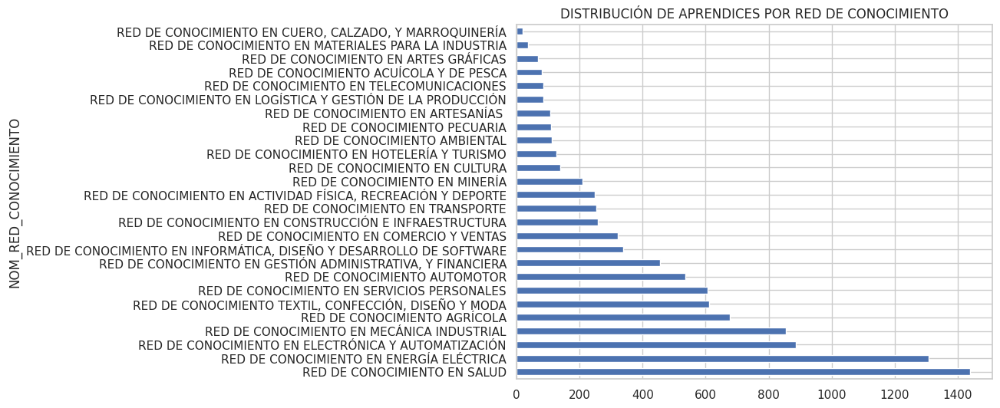

In [1044]:
plt.xlabel("NOM_RED_CONOCIMIENTO")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR RED DE CONOCIMIENTO")
df["NOM_RED_CONOCIMIENTO"].value_counts().plot(kind='barh', figsize=(8,6))

In [1045]:
df["COD_LINEA_TECNOLÓGICA"].value_counts()

COD_LINEA_TECNOLÓGICA
5    20643
3     9012
1     5568
4     2105
2     1774
Name: count, dtype: int64

In [1046]:
df["COD_LINEA_TECNOLÓGICA"].isnull().sum()

0

In [1047]:
print("Número de valores únicos: ",len(df["COD_LINEA_TECNOLÓGICA"].unique()))

Número de valores únicos:  5


In [1048]:
frecuencia = df["COD_LINEA_TECNOLÓGICA"].value_counts()
total_valores = len(df["COD_LINEA_TECNOLÓGICA"])
for COD_LINEA_TECNOLÓGICA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"COD_LINEA_TECNOLÓGICA: {COD_LINEA_TECNOLÓGICA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

COD_LINEA_TECNOLÓGICA: 5, Frecuencia: 20643, Porcentaje: 52.79%
COD_LINEA_TECNOLÓGICA: 3, Frecuencia: 9012, Porcentaje: 23.05%
COD_LINEA_TECNOLÓGICA: 1, Frecuencia: 5568, Porcentaje: 14.24%
COD_LINEA_TECNOLÓGICA: 4, Frecuencia: 2105, Porcentaje: 5.38%
COD_LINEA_TECNOLÓGICA: 2, Frecuencia: 1774, Porcentaje: 4.54%


In [1049]:
df["NOM_LINEA_TECNOLÓGICA"].value_counts()

NOM_LINEA_TECNOLÓGICA
CLIENTE                                                                          20643
PRODUCCIÓN Y TRANSFORMACIÓN                                                       9012
TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACIONES  GESTIÓN DE LA INFORMACIÓN     5568
MATERIALES HERRAMIENTAS                                                           2105
DISEÑO                                                                            1774
Name: count, dtype: int64

In [1050]:
df["NOM_LINEA_TECNOLÓGICA"].isnull().sum()

0

In [1051]:
print("Número de valores únicos: ",len(df["NOM_LINEA_TECNOLÓGICA"].unique()))

Número de valores únicos:  5


In [1052]:
frecuencia = df["NOM_LINEA_TECNOLÓGICA"].value_counts()
total_valores = len(df["NOM_LINEA_TECNOLÓGICA"])
for NOM_LINEA_TECNOLÓGICA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"NOM_LINEA_TECNOLÓGICA: {NOM_LINEA_TECNOLÓGICA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOM_LINEA_TECNOLÓGICA: CLIENTE, Frecuencia: 20643, Porcentaje: 52.79%
NOM_LINEA_TECNOLÓGICA: PRODUCCIÓN Y TRANSFORMACIÓN, Frecuencia: 9012, Porcentaje: 23.05%
NOM_LINEA_TECNOLÓGICA: TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACIONES  GESTIÓN DE LA INFORMACIÓN, Frecuencia: 5568, Porcentaje: 14.24%
NOM_LINEA_TECNOLÓGICA: MATERIALES HERRAMIENTAS, Frecuencia: 2105, Porcentaje: 5.38%
NOM_LINEA_TECNOLÓGICA: DISEÑO, Frecuencia: 1774, Porcentaje: 4.54%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR LINEA TECNOLÓGICA'}, ylabel='NOM_LINEA_TECNOLÓGICA'>

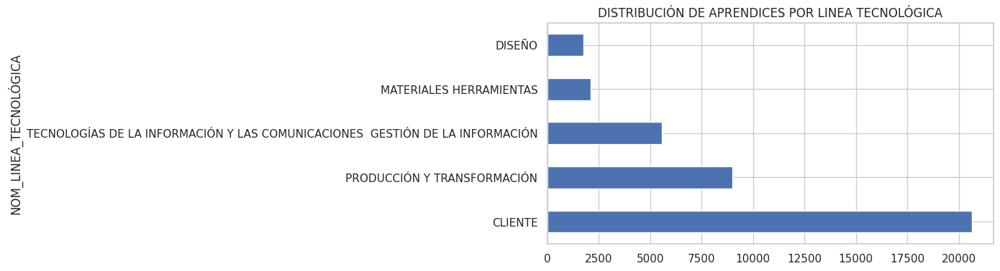

In [1053]:
plt.xlabel("NOM_LINEA_TECNOLÓGICA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR LINEA TECNOLÓGICA")
df["NOM_LINEA_TECNOLÓGICA"].value_counts().plot(kind='barh', figsize=(8,4))

In [1054]:
df["CÓDIGO_TECNOLOGÍA_DE_RED"].value_counts()

CÓDIGO_TECNOLOGÍA_DE_RED
25    12248
1      4992
24     3467
9      2740
23     2452
10     2234
18     1974
22     1489
8      1453
11     1311
21      970
4       946
12      589
2       576
6       488
13      372
5       234
7       210
3       106
14      103
16       86
17       23
19       22
20       17
Name: count, dtype: int64

In [1055]:
df["CÓDIGO_TECNOLOGÍA_DE_RED"].isnull().sum()

0

In [1056]:
print("Número de valores únicos: ",len(df["CÓDIGO_TECNOLOGÍA_DE_RED"].unique()))

Número de valores únicos:  24


In [1057]:
frecuencia = df["CÓDIGO_TECNOLOGÍA_DE_RED"].value_counts()
total_valores = len(df["CÓDIGO_TECNOLOGÍA_DE_RED"])
for CÓDIGO_TECNOLOGÍA_DE_RED, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 2400:
      print(f"CÓDIGO_TECNOLOGÍA_DE_RED: {CÓDIGO_TECNOLOGÍA_DE_RED}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CÓDIGO_TECNOLOGÍA_DE_RED: 25, Frecuencia: 12248, Porcentaje: 31.32%
CÓDIGO_TECNOLOGÍA_DE_RED: 1, Frecuencia: 4992, Porcentaje: 12.77%
CÓDIGO_TECNOLOGÍA_DE_RED: 24, Frecuencia: 3467, Porcentaje: 8.87%
CÓDIGO_TECNOLOGÍA_DE_RED: 9, Frecuencia: 2740, Porcentaje: 7.01%
CÓDIGO_TECNOLOGÍA_DE_RED: 23, Frecuencia: 2452, Porcentaje: 6.27%


In [1058]:
C_col = []
N_col = []
for col in df.columns:
    if df[col].dtype == 'object':
        C_col.append(col)
    else:
        N_col.append(col)

# Imprimir las listas actualizadas
print(f"# Columnas Numéricas = {len(N_col)}", N_col)
print(f"# Columnas Categóricas = {len(C_col)}", C_col)

# Columnas Numéricas = 32 ['NIS', 'ESTRATO', 'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA', 'COD_DPTO_RESIDENCIA', 'COD_MUNICIPIO_RESIDENCIA', 'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO', 'COD_NIVEL_FORMACION', 'COD_PROGRAMA', 'CODIGO_RED_CONOCIMIENTO', 'COD_LINEA_TECNOLÓGICA', 'CÓDIGO_TECNOLOGÍA_DE_RED', 'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL', 'CÓDIGO_CENTRO', 'EDAD', 'CÓDIGO_TIPO_POBLACIÓN', 'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019', 'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021', 'APOYO_SOSTNMTO_2022', 'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018', 'APOYO_FIC_2019', 'APOYO_FIC_2020', 'APOYO_FIC_2021', 'FTE_ACC_PREFERENTE', 'DURACIÓN_PROGRAMA']
# Columnas Categóricas = 20 ['GENERO', 'FECHA_NACIMIENTO', 'ESTADO_CIVIL', 'PUNTAJE_ICFES', 'PAIS_RESIDENCIA', 'DPTO_RESIDENCIA', 'MUNICIPIO_RESIDENCIA', 'ESTADO_APRENDIZ', 'NIVEL_FORMACION', 'MODALIDAD', 'NOMBRE_PROGRAMA', 'NOM_RED_CONOCIMIENTO', 'NOM_LINEA_TECNOLÓGICA', 'NOMBRE_TECNOLOGÍA_DE_RED', 'NOMBRE_REGIONAL', 'SEDE',

In [1059]:
print("Análisis de Columnas Categóricas")
result_dfs = []
for col in C_col:
    col_counts = df[col].value_counts()
    total_rows = len(df)
    col_percentages = (col_counts / total_rows) * 100

    result_df = pd.DataFrame({
        "Valores Únicos": col_counts.index,
        "Recuento": col_counts.values,
        "Porcentaje por Categoría": col_percentages.values
    })
    result_dfs.append(result_df)
for col, result_df in zip(C_col, result_dfs):
    print(f"\nAnálisis para la columna '{col}':")
    display(result_df)
    print("-" * 50)

Análisis de Columnas Categóricas

Análisis para la columna 'GENERO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,F,20044,51.260805
1,M,19058,48.739195


--------------------------------------------------

Análisis para la columna 'FECHA_NACIMIENTO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,1/01/2000,35,0.089509
1,21/12/2000,32,0.081837
2,4/12/2000,28,0.071608
3,26/05/2000,27,0.069050
4,18/02/2000,25,0.063935
...,...,...,...
10108,28/11/1979,1,0.002557
10109,1/07/2003,1,0.002557
10110,5/06/1968,1,0.002557
10111,15/07/1974,1,0.002557


--------------------------------------------------

Análisis para la columna 'ESTADO_CIVIL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,S,20622,52.738990
1,N,8977,22.957905
2,U,4330,11.073602
3,I,2557,6.539307
4,C,2242,5.733722
5,E,317,0.810700
6,V,57,0.145773


--------------------------------------------------

Análisis para la columna 'PUNTAJE_ICFES':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,"45,00",33,0.084395
1,"250,00",27,0.069050
2,"298,00",25,0.063935
3,"300,00",23,0.058821
4,"48,00",21,0.053706
...,...,...,...
393,"652,00",1,0.002557
394,"422,00",1,0.002557
395,"134,00",1,0.002557
396,"424,00",1,0.002557


--------------------------------------------------

Análisis para la columna 'PAIS_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,COLOMBIA,39077,99.936065
1,VENEZUELA,6,0.015344
2,ESPAÑA,5,0.012787
3,CHILE,3,0.007672
4,ESTADOS UNIDOS,1,0.002557
5,PORTUGAL,1,0.002557
6,ITALIA,1,0.002557
7,BÉLGICA,1,0.002557
8,PERÚ,1,0.002557
9,AUSTRALIA,1,0.002557


--------------------------------------------------

Análisis para la columna 'DPTO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,BOGOTÁ D.C.,9208,23.548668
1,ANTIOQUIA,3950,10.101785
2,CUNDINAMARCA,3791,9.695156
3,SANTANDER,1980,5.063680
4,ATLÁNTICO,1805,4.616132
5,CÓRDOBA,1553,3.971664
6,NORTE DE SANTANDER,1443,3.690348
7,VALLE DEL CAUCA,1412,3.611068
8,BOLÍVAR,1402,3.585494
9,BOYACÁ,1275,3.260703


--------------------------------------------------

Análisis para la columna 'MUNICIPIO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,BOGOTÁ,9208,23.548668
1,MEDELLÍN,1698,4.342489
2,CARTAGENA,1066,2.726203
3,SOACHA,948,2.424428
4,BARRANQUILLA,914,2.337476
...,...,...,...
848,MIAMI,1,0.002557
849,GUAYABAL DE SIQUIMA,1,0.002557
850,SAN BENITO ABAD,1,0.002557
851,GUATAPÉ,1,0.002557


--------------------------------------------------

Análisis para la columna 'ESTADO_APRENDIZ':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CERTIFICADO,19905,50.905325
1,CANCELADO,12352,31.589177
2,RETIRO VOLUNTARIO,3495,8.938162
3,TRASLADO,1776,4.541967
4,FORMACION,1320,3.375786
5,POR CERTIFICAR,219,0.560074
6,APLAZADO,15,0.038361
7,CONDICIONADO,14,0.035804
8,INDUCCION,6,0.015344


--------------------------------------------------

Análisis para la columna 'NIVEL_FORMACION':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,TÉCNICO,26480,67.720321
1,TECNÓLOGO,10162,25.988440
2,ESPECIALIZACIÓN TECNOLÓGICA,1038,2.654596
3,OPERARIO,978,2.501151
4,AUXILIAR,379,0.969260
5,PROFUNDIZACIÓN TÉCNICA,65,0.166232


--------------------------------------------------

Análisis para la columna 'MODALIDAD':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,PRESENCIAL,39102,100.0


--------------------------------------------------

Análisis para la columna 'NOMBRE_PROGRAMA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,ASISTENCIA ADMINISTRATIVA,2361,6.038054
1,SISTEMAS,2341,5.986906
2,GESTIÓN DEL TALENTO HUMANO,1478,3.779858
3,CONTABILIZACIÓN DE OPERACIONES COMERCIALES Y F...,1367,3.495985
4,ASISTENCIA EN ORGANIZACIÓN DE ARCHIVOS,1231,3.148177
...,...,...,...
210,GESTIÓN SOSTENIBLE DE LA BIODIVERSIDAD VEGETAL,15,0.038361
211,CONSTRUCCIÓN DE ESTRUCTURAS EN CONCRETO,15,0.038361
212,INFORMACIÓN TURÍSTICA,15,0.038361
213,INSPECCION Y ENSAYOS CON PROCESOS NO DESTRUCTIVOS,15,0.038361


--------------------------------------------------

Análisis para la columna 'NOM_RED_CONOCIMIENTO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,RED DE CONOCIMIENTO EN SALUD,1438,3.677561
1,RED DE CONOCIMIENTO EN ENERGÍA ELÉCTRICA,1308,3.345097
2,RED DE CONOCIMIENTO EN ELECTRÓNICA Y AUTOMATIZ...,886,2.265869
3,RED DE CONOCIMIENTO EN MECÁNICA INDUSTRIAL,854,2.184032
4,RED DE CONOCIMIENTO AGRÍCOLA,677,1.731369
5,"RED DE CONOCIMIENTO TEXTIL, CONFECCIÓN, DISEÑO...",611,1.562580
6,RED DE CONOCIMIENTO EN SERVICIOS PERSONALES,606,1.549793
7,RED DE CONOCIMIENTO AUTOMOTOR,536,1.370774
8,"RED DE CONOCIMIENTO EN GESTIÓN ADMINISTRATIVA,...",454,1.161066
9,"RED DE CONOCIMIENTO EN INFORMÁTICA, DISEÑO Y D...",337,0.861848


--------------------------------------------------

Análisis para la columna 'NOM_LINEA_TECNOLÓGICA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CLIENTE,20643,52.792696
1,PRODUCCIÓN Y TRANSFORMACIÓN,9012,23.047414
2,TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACI...,5568,14.239681
3,MATERIALES HERRAMIENTAS,2105,5.383356
4,DISEÑO,1774,4.536852


--------------------------------------------------

Análisis para la columna 'NOMBRE_TECNOLOGÍA_DE_RED':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,TECNOLOGÍAS DE GESTIÓN ADMINISTRATIVA Y SERVIC...,12248,31.323206
1,"TECNOLOGÍAS DE LA INFORMACIÓN, DISEÑO Y DESARR...",4992,12.766610
2,TECNOLOGÍAS DE SERVICIOS DE SALUD,3467,8.866554
3,"TECNOLOGÍAS DE MANTENIMIENTO PREDICTIVO, PREVE...",2740,7.007314
4,TECNOLOGÍAS DE SERVICIOS TURÍSTICOS,2452,6.270779
5,TECNOLOGÍAS DE PRODUCCIÓN INDUSTRIAL,2234,5.713263
6,MATERIALES PARA LA CONSTRUCCIÓN,1974,5.048335
7,LOGÍSTICA Y TRANSPORTE,1489,3.807989
8,TECNOLOGÍAS AGRÍCOLAS,1453,3.715922
9,TECNOLOGÍAS DE PRODUCCIÓN LIMPIA,1311,3.352770


--------------------------------------------------

Análisis para la columna 'NOMBRE_REGIONAL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,REGIONAL DISTRITO CAPITAL,9699,24.804358
1,REGIONAL ANTIOQUIA,4024,10.291034
2,REGIONAL CUNDINAMARCA,3557,9.096721
3,REGIONAL SANTANDER,2088,5.339880
4,REGIONAL ATLÁNTICO,1841,4.708199
5,REGIONAL CÓRDOBA,1509,3.859138
6,REGIONAL NORTE DE SANTANDER,1454,3.718480
7,REGIONAL BOLÍVAR,1335,3.414148
8,REGIONAL VALLE,1334,3.411590
9,REGIONAL BOYACÁ,1263,3.230014


--------------------------------------------------

Análisis para la columna 'SEDE':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CENTRO DE GESTION ADMINISTRATIVA,2235,5.715820
1,CENTRO DE COMERCIO Y SERVICIOS,2211,5.654442
2,CENTRO DE SERVICIOS FINANCIEROS,2006,5.130172
3,"CENTRO DE ELECTRICIDAD, ELECTRÓNICA Y TELECOMU...",1442,3.687791
4,"CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVI...",1127,2.882206
...,...,...,...
98,CENTRO DE INDUSTRIA Y CONSTRUCCION,33,0.084395
99,CENTRO AGROINDUSTRIAL Y PESQUERO DE LA COSTA P...,31,0.079280
100,CENTRO DE LOS RECURSOS NATURALES RENOVABLES - ...,29,0.074165
101,"COMPLEJO TECNOLOGICO, TURISTICO Y AGROINDUSTRI...",28,0.071608


--------------------------------------------------

Análisis para la columna 'NOMBRE_TIPO_POBLACIÓN':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,NINGUNA,23906,61.137538
1,DESPLAZADOS POR LA VIOLENCIA,4511,11.536494
2,JOVENES VULNERABLES,3892,9.953455
3,EMPRENDEDORES,1805,4.616132
4,MUJER CABEZA DE FAMILIA,1246,3.186538
5,ADOLESCENTE TRABAJADOR,807,2.063833
6,AFROCOLOMBIANOS DESPLAZADOS POR LA VIOLENCIA,502,1.283822
7,INDIGENA,407,1.040867
8,AFROCOLOMBIANO,395,1.010179
9,NEGRO,365,0.933456


--------------------------------------------------

Análisis para la columna 'PUNTAJE_TOTAL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,"0,00",1834,4.690297
1,"44,93",63,0.161117
2,"46,43",61,0.156002
3,"45,57",59,0.150887
4,"49,13",55,0.140658
...,...,...,...
6250,"16,46",1,0.002557
6251,"16,32",1,0.002557
6252,"15,30",1,0.002557
6253,"16,15",1,0.002557


--------------------------------------------------

Análisis para la columna 'FECHA_MATRICULA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,19/12/2017,3992,10.209196
1,21/12/2017,3457,8.840980
2,18/12/2017,3118,7.974017
3,20/12/2017,3083,7.884507
4,22/12/2017,2232,5.708148
...,...,...,...
266,18/07/2018,1,0.002557
267,13/07/2018,1,0.002557
268,2/10/2018,1,0.002557
269,16/03/2018,1,0.002557


--------------------------------------------------

Análisis para la columna 'FECHA_ULTIMO_ESTADO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,19/12/2017,346,0.884865
1,21/12/2017,343,0.877193
2,20/12/2017,236,0.603550
3,18/12/2017,208,0.531942
4,12/07/2022,179,0.457777
...,...,...,...
1546,26/03/2018,1,0.002557
1547,19/12/2020,1,0.002557
1548,14/03/2021,1,0.002557
1549,9/02/2022,1,0.002557


--------------------------------------------------


In [1060]:
df["NOMBRE_TECNOLOGÍA_DE_RED"].value_counts()

NOMBRE_TECNOLOGÍA_DE_RED
TECNOLOGÍAS DE GESTIÓN ADMINISTRATIVA Y SERVICIOS FINANCIEROS                               12248
TECNOLOGÍAS DE LA INFORMACIÓN, DISEÑO Y DESARROLLO DE SOFTWARE                               4992
TECNOLOGÍAS DE SERVICIOS DE SALUD                                                            3467
TECNOLOGÍAS DE MANTENIMIENTO PREDICTIVO, PREVENTIVO Y  CORRECTIVO                            2740
TECNOLOGÍAS DE SERVICIOS TURÍSTICOS                                                          2452
TECNOLOGÍAS  DE PRODUCCIÓN INDUSTRIAL                                                        2234
MATERIALES PARA LA CONSTRUCCIÓN                                                              1974
LOGÍSTICA Y TRANSPORTE                                                                       1489
TECNOLOGÍAS AGRÍCOLAS                                                                        1453
TECNOLOGÍAS  DE PRODUCCIÓN LIMPIA                                                            

In [1061]:
df["NOMBRE_TECNOLOGÍA_DE_RED"].isnull().sum()

0

In [1062]:
print("Número de valores únicos: ",len(df["NOMBRE_TECNOLOGÍA_DE_RED"].unique()))

Número de valores únicos:  24


In [1063]:
frecuencia = df["NOMBRE_TECNOLOGÍA_DE_RED"].value_counts()
total_valores = len(df["NOMBRE_TECNOLOGÍA_DE_RED"])
for NOMBRE_TECNOLOGÍA_DE_RED, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 2400:
      print(f"NOMBRE_TECNOLOGÍA_DE_RED: {NOMBRE_TECNOLOGÍA_DE_RED}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOMBRE_TECNOLOGÍA_DE_RED: TECNOLOGÍAS DE GESTIÓN ADMINISTRATIVA Y SERVICIOS FINANCIEROS, Frecuencia: 12248, Porcentaje: 31.32%
NOMBRE_TECNOLOGÍA_DE_RED: TECNOLOGÍAS DE LA INFORMACIÓN, DISEÑO Y DESARROLLO DE SOFTWARE, Frecuencia: 4992, Porcentaje: 12.77%
NOMBRE_TECNOLOGÍA_DE_RED: TECNOLOGÍAS DE SERVICIOS DE SALUD, Frecuencia: 3467, Porcentaje: 8.87%
NOMBRE_TECNOLOGÍA_DE_RED: TECNOLOGÍAS DE MANTENIMIENTO PREDICTIVO, PREVENTIVO Y  CORRECTIVO, Frecuencia: 2740, Porcentaje: 7.01%
NOMBRE_TECNOLOGÍA_DE_RED: TECNOLOGÍAS DE SERVICIOS TURÍSTICOS, Frecuencia: 2452, Porcentaje: 6.27%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR TECNOLOGÍA DE RED'}, ylabel='NOMBRE_TECNOLOGÍA_DE_RED'>

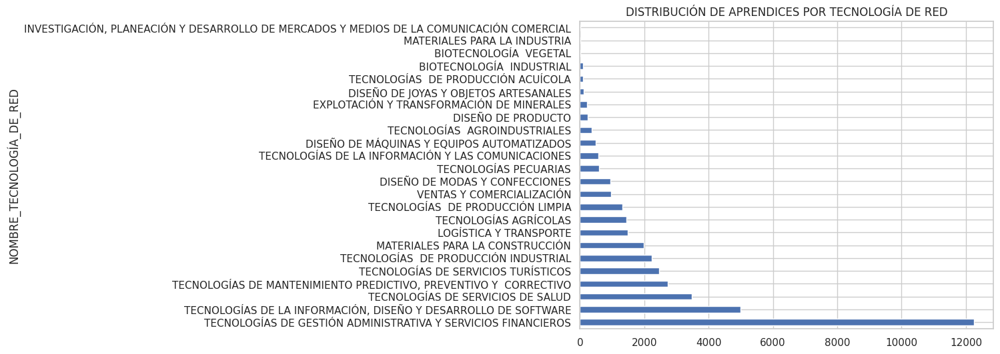

In [1064]:
plt.xlabel("NOMBRE_TECNOLOGÍA_DE_RED")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR TECNOLOGÍA DE RED")
df["NOMBRE_TECNOLOGÍA_DE_RED"].value_counts().plot(kind='barh', figsize=(8,6))

In [1065]:
df["FICHA_NUM_CURSO"].value_counts()

FICHA_NUM_CURSO
1581575    216
1581582    211
1581576    203
1576858    138
1578581    120
          ... 
1582100      4
1580799      3
1578867      3
1578856      3
1571975      3
Name: count, Length: 1381, dtype: int64

In [1066]:
df["FICHA_NUM_CURSO"].isnull().sum()

0

In [1067]:
print("Número de valores únicos: ",len(df["FICHA_NUM_CURSO"].unique()))

Número de valores únicos:  1381


In [1068]:
frecuencia = df["FICHA_NUM_CURSO"].value_counts()
total_valores = len(df["FICHA_NUM_CURSO"])
for FICHA_NUM_CURSO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 130:
      print(f"FICHA_NUM_CURSO: {FICHA_NUM_CURSO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

FICHA_NUM_CURSO: 1581575, Frecuencia: 216, Porcentaje: 0.55%
FICHA_NUM_CURSO: 1581582, Frecuencia: 211, Porcentaje: 0.54%
FICHA_NUM_CURSO: 1581576, Frecuencia: 203, Porcentaje: 0.52%
FICHA_NUM_CURSO: 1576858, Frecuencia: 138, Porcentaje: 0.35%


In [1069]:
df["CÓDIGO_REGIONAL"].value_counts()

CÓDIGO_REGIONAL
11    9699
5     4024
25    3557
68    2088
8     1841
23    1509
54    1454
13    1335
76    1334
15    1263
86    1103
63     883
66     876
41     871
47     853
85     773
50     692
27     616
52     589
73     564
70     564
19     448
81     434
18     381
17     376
95     217
44     179
94     177
99     108
20      92
88      91
97      75
91      36
Name: count, dtype: int64

In [1070]:
df["CÓDIGO_REGIONAL"].isnull().sum()

0

In [1071]:
print("Número de valores únicos: ",len(df["CÓDIGO_REGIONAL"].unique()))

Número de valores únicos:  33


In [1072]:
frecuencia = df["CÓDIGO_REGIONAL"].value_counts()
total_valores = len(df["CÓDIGO_REGIONAL"])
for CÓDIGO_REGIONAL, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1500:
      print(f"CÓDIGO_REGIONAL: {CÓDIGO_REGIONAL}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CÓDIGO_REGIONAL: 11, Frecuencia: 9699, Porcentaje: 24.80%
CÓDIGO_REGIONAL: 5, Frecuencia: 4024, Porcentaje: 10.29%
CÓDIGO_REGIONAL: 25, Frecuencia: 3557, Porcentaje: 9.10%
CÓDIGO_REGIONAL: 68, Frecuencia: 2088, Porcentaje: 5.34%
CÓDIGO_REGIONAL: 8, Frecuencia: 1841, Porcentaje: 4.71%
CÓDIGO_REGIONAL: 23, Frecuencia: 1509, Porcentaje: 3.86%


In [1073]:
df["NOMBRE_REGIONAL"].value_counts()

NOMBRE_REGIONAL
REGIONAL DISTRITO CAPITAL      9699
REGIONAL ANTIOQUIA             4024
REGIONAL CUNDINAMARCA          3557
REGIONAL SANTANDER             2088
REGIONAL ATLÁNTICO             1841
REGIONAL CÓRDOBA               1509
REGIONAL NORTE DE SANTANDER    1454
REGIONAL BOLÍVAR               1335
REGIONAL VALLE                 1334
REGIONAL BOYACÁ                1263
REGIONAL PUTUMAYO              1103
REGIONAL QUINDÍO                883
REGIONAL RISARALDA              876
REGIONAL HUILA                  871
REGIONAL MAGDALENA              853
REGIONAL CASANARE               773
REGIONAL META                   692
REGIONAL CHOCÓ                  616
REGIONAL NARIÑO                 589
REGIONAL TOLIMA                 564
REGIONAL SUCRE                  564
REGIONAL CAUCA                  448
REGIONAL ARAUCA                 434
REGIONAL CAQUETÁ                381
REGIONAL CALDAS                 376
REGIONAL GUAVIARE               217
REGIONAL GUAJIRA                179
REGIONAL GUA

In [1074]:
df["NOMBRE_REGIONAL"].isnull().sum()

0

In [1075]:
print("Número de valores únicos: ",len(df["NOMBRE_REGIONAL"].unique()))

Número de valores únicos:  33


In [1076]:
frecuencia = df["NOMBRE_REGIONAL"].value_counts()
total_valores = len(df["NOMBRE_REGIONAL"])
for NOMBRE_REGIONAL, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1500:
      print(f"NOMBRE_REGIONAL: {NOMBRE_REGIONAL}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOMBRE_REGIONAL: REGIONAL DISTRITO CAPITAL, Frecuencia: 9699, Porcentaje: 24.80%
NOMBRE_REGIONAL: REGIONAL ANTIOQUIA, Frecuencia: 4024, Porcentaje: 10.29%
NOMBRE_REGIONAL: REGIONAL CUNDINAMARCA, Frecuencia: 3557, Porcentaje: 9.10%
NOMBRE_REGIONAL: REGIONAL SANTANDER, Frecuencia: 2088, Porcentaje: 5.34%
NOMBRE_REGIONAL: REGIONAL ATLÁNTICO, Frecuencia: 1841, Porcentaje: 4.71%
NOMBRE_REGIONAL: REGIONAL CÓRDOBA, Frecuencia: 1509, Porcentaje: 3.86%


In [1077]:
frecuencia = df["NOMBRE_REGIONAL"].value_counts()
total_valores = len(df["NOMBRE_REGIONAL"])
for NOMBRE_REGIONAL, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo < 100:
      print(f"NOMBRE_REGIONAL: {NOMBRE_REGIONAL}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOMBRE_REGIONAL: REGIONAL CESAR, Frecuencia: 92, Porcentaje: 0.24%
NOMBRE_REGIONAL: REGIONAL SAN ANDRÉS, Frecuencia: 91, Porcentaje: 0.23%
NOMBRE_REGIONAL: REGIONAL VAUPÉS, Frecuencia: 75, Porcentaje: 0.19%
NOMBRE_REGIONAL: REGIONAL AMAZONAS, Frecuencia: 36, Porcentaje: 0.09%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR REGIONAL'}, ylabel='NOMBRE_REGIONAL'>

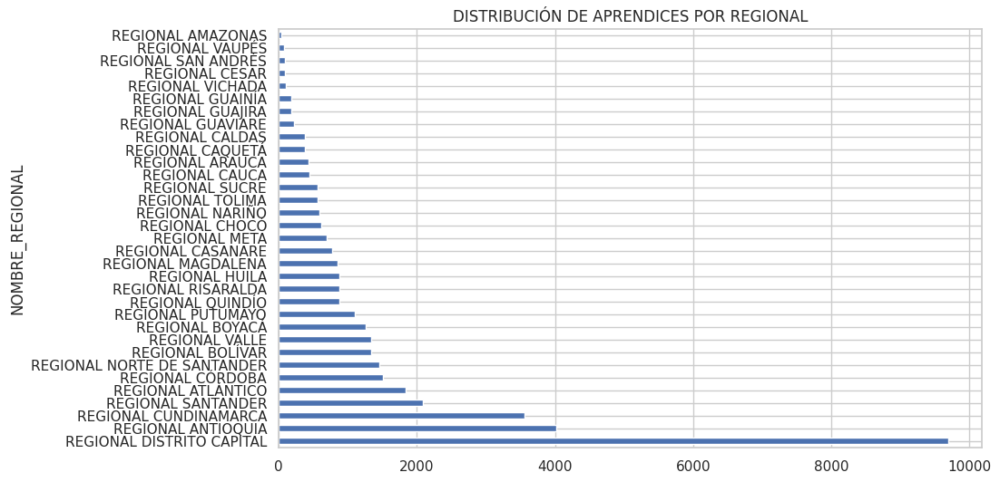

In [1078]:
plt.xlabel("NOMBRE_REGIONAL")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR REGIONAL")
df["NOMBRE_REGIONAL"].value_counts().plot(kind='barh', figsize=(10,6))

In [1079]:
df["CÓDIGO_CENTRO"].value_counts()

CÓDIGO_CENTRO
9404    2235
9405    2006
9210    1442
9518    1103
9512     984
        ... 
9226      33
9535      31
9101      29
9549      28
9202      25
Name: count, Length: 110, dtype: int64

In [1080]:
df["CÓDIGO_CENTRO"].isnull().sum()

0

In [1081]:
print("Número de valores únicos: ",len(df["CÓDIGO_CENTRO"].unique()))

Número de valores únicos:  110


In [1082]:
frecuencia = df["CÓDIGO_CENTRO"].value_counts()
total_valores = len(df["CÓDIGO_CENTRO"])
for CÓDIGO_CENTRO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 900:
      print(f"CÓDIGO_CENTRO: {CÓDIGO_CENTRO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CÓDIGO_CENTRO: 9404, Frecuencia: 2235, Porcentaje: 5.72%
CÓDIGO_CENTRO: 9405, Frecuencia: 2006, Porcentaje: 5.13%
CÓDIGO_CENTRO: 9210, Frecuencia: 1442, Porcentaje: 3.69%
CÓDIGO_CENTRO: 9518, Frecuencia: 1103, Porcentaje: 2.82%
CÓDIGO_CENTRO: 9512, Frecuencia: 984, Porcentaje: 2.52%
CÓDIGO_CENTRO: 9115, Frecuencia: 915, Porcentaje: 2.34%


In [1083]:
df["SEDE"].value_counts()

SEDE
CENTRO DE GESTION ADMINISTRATIVA                                             2235
CENTRO DE COMERCIO Y SERVICIOS                                               2211
CENTRO DE SERVICIOS FINANCIEROS                                              2006
CENTRO DE ELECTRICIDAD, ELECTRÓNICA Y TELECOMUNICACIONES                     1442
CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVICIOS                           1127
                                                                             ... 
CENTRO DE INDUSTRIA Y CONSTRUCCION                                             33
CENTRO AGROINDUSTRIAL Y PESQUERO DE LA COSTA PACIFICA                          31
CENTRO DE LOS RECURSOS NATURALES RENOVABLES - LA SALADA                        29
COMPLEJO TECNOLOGICO, TURISTICO Y AGROINDUSTRIAL DEL OCCIDENTE ANTIOQUEÑO      28
CENTRO DE FORMACIÓN EN DISEÑO, CONFECCIÓN Y MODA.                              25
Name: count, Length: 103, dtype: int64

In [1084]:
print("Número de valores únicos: ",len(df["SEDE"].unique()))

Número de valores únicos:  103


In [1085]:
frecuencia = df["SEDE"].value_counts()
total_valores = len(df["SEDE"])
for SEDE, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 900:
      print(f"SEDE: {SEDE}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

SEDE: CENTRO DE GESTION ADMINISTRATIVA, Frecuencia: 2235, Porcentaje: 5.72%
SEDE: CENTRO DE COMERCIO Y SERVICIOS, Frecuencia: 2211, Porcentaje: 5.65%
SEDE: CENTRO DE SERVICIOS FINANCIEROS, Frecuencia: 2006, Porcentaje: 5.13%
SEDE: CENTRO DE ELECTRICIDAD, ELECTRÓNICA Y TELECOMUNICACIONES, Frecuencia: 1442, Porcentaje: 3.69%
SEDE: CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVICIOS, Frecuencia: 1127, Porcentaje: 2.88%
SEDE: CENTRO AGROFORESTAL Y ACUICOLA ARAPAIMA, Frecuencia: 1103, Porcentaje: 2.82%
SEDE: CENTRO DE BIOTECNOLOGIA AGROPECUARIA, Frecuencia: 984, Porcentaje: 2.52%
SEDE: CENTRO AGROPECUARIO Y DE BIOTECNOLOGIA EL PORVENIR, Frecuencia: 915, Porcentaje: 2.34%


In [1086]:
df["EDAD"].value_counts()

EDAD
17    4694
18    4502
19    3511
20    2881
21    2311
      ... 
77       1
92       1
9        1
75       1
73       1
Name: count, Length: 74, dtype: int64

In [1087]:
df["EDAD"].isnull().sum()

0

In [1088]:
print("Número de valores únicos: ",len(df["EDAD"].unique()))

Número de valores únicos:  74


In [1089]:
frecuencia = df["EDAD"].value_counts()
total_valores = len(df["EDAD"])
for EDAD, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 900:
      print(f"EDAD: {EDAD}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

EDAD: 17, Frecuencia: 4694, Porcentaje: 12.00%
EDAD: 18, Frecuencia: 4502, Porcentaje: 11.51%
EDAD: 19, Frecuencia: 3511, Porcentaje: 8.98%
EDAD: 20, Frecuencia: 2881, Porcentaje: 7.37%
EDAD: 21, Frecuencia: 2311, Porcentaje: 5.91%
EDAD: 22, Frecuencia: 2064, Porcentaje: 5.28%
EDAD: 23, Frecuencia: 1849, Porcentaje: 4.73%
EDAD: 24, Frecuencia: 1573, Porcentaje: 4.02%
EDAD: 25, Frecuencia: 1449, Porcentaje: 3.71%
EDAD: 26, Frecuencia: 1292, Porcentaje: 3.30%
EDAD: 27, Frecuencia: 1145, Porcentaje: 2.93%
EDAD: 28, Frecuencia: 1080, Porcentaje: 2.76%
EDAD: 16, Frecuencia: 1009, Porcentaje: 2.58%
EDAD: 29, Frecuencia: 926, Porcentaje: 2.37%


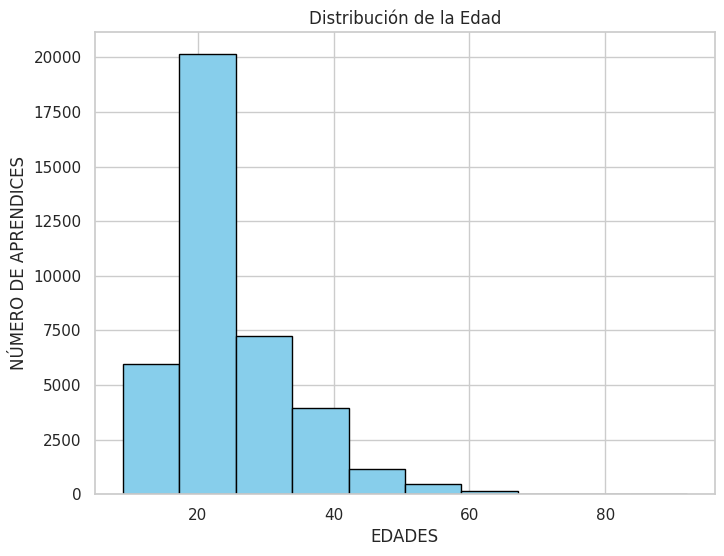

In [1090]:
# Graficar la distribución utilizando Matplotlib
plt.figure(figsize=(8, 6))  # Tamaño de la figura
plt.hist(df['EDAD'], bins=10, color='skyblue', edgecolor='black')  # Histograma
plt.xlabel('EDADES')  # Etiqueta del eje x
plt.ylabel('NÚMERO DE APRENDICES')  # Etiqueta del eje y
plt.title('Distribución de la Edad')  # Título del gráfico
plt.grid(True)  # Mostrar cuadrícula
plt.show()  # Mostrar la gráfica

In [1091]:
df["CÓDIGO_TIPO_POBLACIÓN"].value_counts()

CÓDIGO_TIPO_POBLACIÓN
34     23906
3       4511
8       3892
64      1805
10      1246
14       807
127      502
6        407
130      395
11       365
138      176
4        148
101      140
124      102
129       88
19        75
13        74
123       58
20        45
132       40
26        38
121       37
137       28
122       28
12        26
24        22
25        21
104       20
135       20
9         17
134       15
143       11
105        8
126        6
102        6
131        5
139        4
136        2
140        2
125        2
33         1
141        1
Name: count, dtype: int64

In [1092]:
nulos=df["CÓDIGO_TIPO_POBLACIÓN"].isnull().sum()
unicos = len(df["CÓDIGO_TIPO_POBLACIÓN"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  42


In [1093]:
frecuencia = df["CÓDIGO_TIPO_POBLACIÓN"].value_counts()
total_valores = len(df["CÓDIGO_TIPO_POBLACIÓN"])
for CÓDIGO_TIPO_POBLACIÓN, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1000:
      print(f"CÓDIGO_TIPO_POBLACIÓN: {CÓDIGO_TIPO_POBLACIÓN}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

CÓDIGO_TIPO_POBLACIÓN: 34, Frecuencia: 23906, Porcentaje: 61.14%
CÓDIGO_TIPO_POBLACIÓN: 3, Frecuencia: 4511, Porcentaje: 11.54%
CÓDIGO_TIPO_POBLACIÓN: 8, Frecuencia: 3892, Porcentaje: 9.95%
CÓDIGO_TIPO_POBLACIÓN: 64, Frecuencia: 1805, Porcentaje: 4.62%
CÓDIGO_TIPO_POBLACIÓN: 10, Frecuencia: 1246, Porcentaje: 3.19%


In [1094]:
df["NOMBRE_TIPO_POBLACIÓN"].value_counts()

NOMBRE_TIPO_POBLACIÓN
NINGUNA                                                                                     23906
DESPLAZADOS POR LA VIOLENCIA                                                                 4511
JOVENES VULNERABLES                                                                          3892
EMPRENDEDORES                                                                                1805
MUJER CABEZA DE FAMILIA                                                                      1246
ADOLESCENTE TRABAJADOR                                                                        807
AFROCOLOMBIANOS DESPLAZADOS POR LA VIOLENCIA                                                  502
INDIGENA                                                                                      407
AFROCOLOMBIANO                                                                                395
NEGRO                                                                                         36

In [1095]:
nulos=df["NOMBRE_TIPO_POBLACIÓN"].isnull().sum()
unicos = len(df["NOMBRE_TIPO_POBLACIÓN"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  47


In [1096]:
frecuencia = df["NOMBRE_TIPO_POBLACIÓN"].value_counts()
total_valores = len(df["NOMBRE_TIPO_POBLACIÓN"])
for NOMBRE_TIPO_POBLACIÓN, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 1000:
      print(f"NOMBRE_TIPO_POBLACIÓN: {NOMBRE_TIPO_POBLACIÓN}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

NOMBRE_TIPO_POBLACIÓN: NINGUNA, Frecuencia: 23906, Porcentaje: 61.14%
NOMBRE_TIPO_POBLACIÓN: DESPLAZADOS POR LA VIOLENCIA, Frecuencia: 4511, Porcentaje: 11.54%
NOMBRE_TIPO_POBLACIÓN: JOVENES VULNERABLES, Frecuencia: 3892, Porcentaje: 9.95%
NOMBRE_TIPO_POBLACIÓN: EMPRENDEDORES, Frecuencia: 1805, Porcentaje: 4.62%
NOMBRE_TIPO_POBLACIÓN: MUJER CABEZA DE FAMILIA, Frecuencia: 1246, Porcentaje: 3.19%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR TIPO DE POBLACIÓN'}, ylabel='NOMBRE_TIPO_POBLACIÓN'>

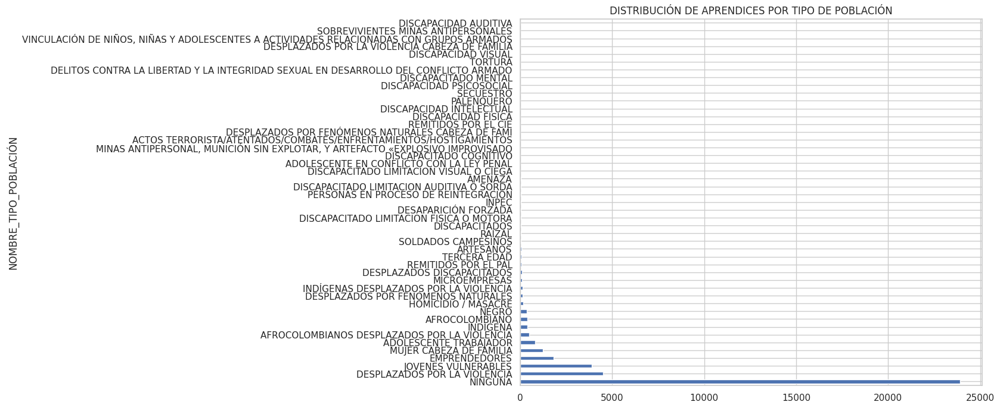

In [1097]:
plt.xlabel("NOMBRE_TIPO_POBLACIÓN")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR TIPO DE POBLACIÓN")
df["NOMBRE_TIPO_POBLACIÓN"].value_counts().plot(kind='barh', figsize=(10,8))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR TIPO DE POBLACIÓN'}, xlabel='NOMBRE_TIPO_POBLACIÓN', ylabel='No. DE APRENDICES'>

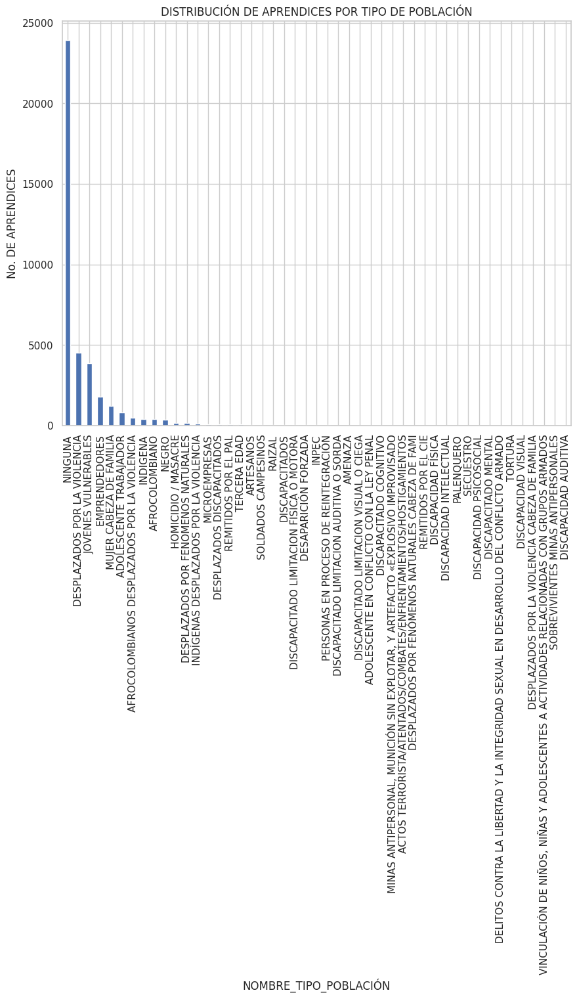

In [1098]:
plt.xlabel("NOMBRE_TIPO_POBLACIÓN")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR TIPO DE POBLACIÓN")
df["NOMBRE_TIPO_POBLACIÓN"].value_counts().plot(kind='bar', figsize=(10,8))

In [1099]:
df["APOYO_SOSTNMTO_2018"].value_counts()

APOYO_SOSTNMTO_2018
0    37502
1     1600
Name: count, dtype: int64

In [1100]:
frecuencia = df["APOYO_SOSTNMTO_2018"].value_counts()
total_valores = len(df["APOYO_SOSTNMTO_2018"])
for APOYO_SOSTNMTO_2018, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO_SOSTNMTO_2018: {APOYO_SOSTNMTO_2018}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_SOSTNMTO_2018: 0, Frecuencia: 37502, Porcentaje: 95.91%
APOYO_SOSTNMTO_2018: 1, Frecuencia: 1600, Porcentaje: 4.09%


In [1101]:
df["APOYO_SOSTNMTO_2019"].value_counts()

APOYO_SOSTNMTO_2019
0    37878
1     1224
Name: count, dtype: int64

In [1102]:
frecuencia = df["APOYO_SOSTNMTO_2019"].value_counts()
total_valores = len(df["APOYO_SOSTNMTO_2019"])
for APOYO_SOSTNMTO_2019, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO_SOSTNMTO_2019: {APOYO_SOSTNMTO_2019}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_SOSTNMTO_2019: 0, Frecuencia: 37878, Porcentaje: 96.87%
APOYO_SOSTNMTO_2019: 1, Frecuencia: 1224, Porcentaje: 3.13%


In [1103]:
df["APOYO_SOSTNMTO_2020"].value_counts()

APOYO_SOSTNMTO_2020
0    38993
1      109
Name: count, dtype: int64

In [1104]:
frecuencia = df["APOYO_SOSTNMTO_2020"].value_counts()
total_valores = len(df["APOYO_SOSTNMTO_2020"])
for APOYO_SOSTNMTO_2020, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    if conteo > 100:
      print(f"APOYO_SOSTNMTO_2020: {APOYO_SOSTNMTO_2020}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_SOSTNMTO_2020: 0, Frecuencia: 38993, Porcentaje: 99.72%
APOYO_SOSTNMTO_2020: 1, Frecuencia: 109, Porcentaje: 0.28%


In [1105]:
df["APOYO_SOSTNMTO_2021"].value_counts()

APOYO_SOSTNMTO_2021
0    39102
Name: count, dtype: int64

In [1106]:
df["APOYO_SOSTNMTO_2022"].value_counts()

APOYO_SOSTNMTO_2022
0    39102
Name: count, dtype: int64

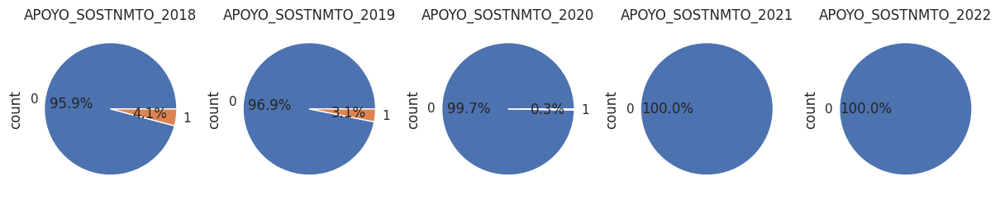

In [1107]:
# INTENTO PARA GENERAR GRAFICA CON PORCENTAJES PARA APOYO_SOSTNMTO

plt.figure(figsize=(15,38))
plt.subplot(1,5,1)
df["APOYO_SOSTNMTO_2018"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_SOSTNMTO_2018")

plt.subplot(1,5,2)
df["APOYO_SOSTNMTO_2019"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_SOSTNMTO_2019")

plt.subplot(1,5,3)
df["APOYO_SOSTNMTO_2020"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_SOSTNMTO_2020")

plt.subplot(1,5,4)
df["APOYO_SOSTNMTO_2021"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_SOSTNMTO_2021")

plt.subplot(1,5,5)
df["APOYO_SOSTNMTO_2022"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_SOSTNMTO_2022")

plt.show()

In [1108]:
df["APOYO_FIC_2018"].value_counts()

APOYO_FIC_2018
0    37659
1     1443
Name: count, dtype: int64

In [1109]:
frecuencia = df["APOYO_FIC_2018"].value_counts()
total_valores = len(df["APOYO_FIC_2018"])
for APOYO_FIC_2018, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO_FIC_2018: {APOYO_FIC_2018}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_FIC_2018: 0, Frecuencia: 37659, Porcentaje: 96.31%
APOYO_FIC_2018: 1, Frecuencia: 1443, Porcentaje: 3.69%


In [1110]:
df["APOYO_FIC_2019"].value_counts()

APOYO_FIC_2019
0    38146
1      956
Name: count, dtype: int64

In [1111]:
frecuencia = df["APOYO_FIC_2019"].value_counts()
total_valores = len(df["APOYO_FIC_2019"])
for APOYO_FIC_2019, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO_FIC_2019: {APOYO_FIC_2019}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_FIC_2019: 0, Frecuencia: 38146, Porcentaje: 97.56%
APOYO_FIC_2019: 1, Frecuencia: 956, Porcentaje: 2.44%


In [1112]:
df["APOYO_FIC_2020"].value_counts()

APOYO_FIC_2020
0    39043
1       59
Name: count, dtype: int64

In [1113]:
frecuencia = df["APOYO_FIC_2020"].value_counts()
total_valores = len(df["APOYO_FIC_2020"])
for APOYO_FIC_2020, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO_FIC_2020: {APOYO_FIC_2020}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO_FIC_2020: 0, Frecuencia: 39043, Porcentaje: 99.85%
APOYO_FIC_2020: 1, Frecuencia: 59, Porcentaje: 0.15%


In [1114]:
df["APOYO_FIC_2021"].value_counts()

APOYO_FIC_2021
0    39102
Name: count, dtype: int64

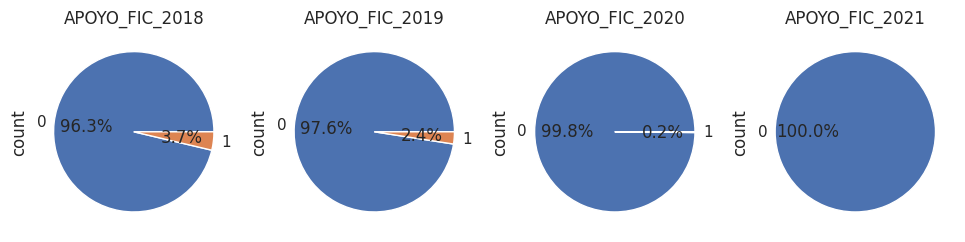

In [1115]:
# INTENTO PARA GENERAR GRAFICA CON PORCENTAJES PARA APOYO_FIC

plt.figure(figsize=(15,38))
plt.subplot(1,5,1)
df["APOYO_FIC_2018"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_FIC_2018")

plt.subplot(1,5,2)
df["APOYO_FIC_2019"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_FIC_2019")

plt.subplot(1,5,3)
df["APOYO_FIC_2020"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_FIC_2020")

plt.subplot(1,5,4)
df["APOYO_FIC_2021"].value_counts().plot(kind="pie", autopct='%1.01f%%')
plt.title("APOYO_FIC_2021")

plt.show()

In [1116]:
df["PUNTAJE_TOTAL"].value_counts()

PUNTAJE_TOTAL
0,00     1834
44,93      63
46,43      61
45,57      59
49,13      55
         ... 
16,46       1
16,32       1
15,30       1
16,15       1
81,70       1
Name: count, Length: 6255, dtype: int64

In [1117]:
PUNTAJE_TOTAL = df["PUNTAJE_TOTAL"].str.replace(',', '.')

In [1118]:
PUNTAJE_TOTAL = PUNTAJE_TOTAL.astype(float)

In [1119]:
print(df["PUNTAJE_TOTAL"].describe())

count     39102
unique     6255
top        0,00
freq       1834
Name: PUNTAJE_TOTAL, dtype: object


In [1120]:
print(PUNTAJE_TOTAL.describe())

count    39102.000000
mean        54.687795
std         22.819638
min          0.000000
25%         42.070000
50%         50.830000
75%         73.230000
max        108.470000
Name: PUNTAJE_TOTAL, dtype: float64


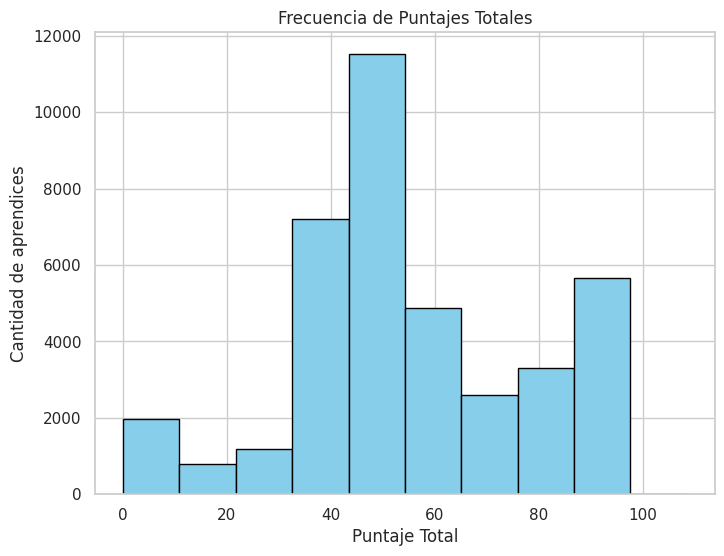

In [1121]:
# Graficar la distribución utilizando Matplotlib
plt.figure(figsize=(8, 6))  # Tamaño de la figura
plt.hist(PUNTAJE_TOTAL, bins=10, color='skyblue', edgecolor='black')  # Histograma
plt.xlabel('Puntaje Total')  # Etiqueta del eje x
plt.ylabel('Cantidad de aprendices')  # Etiqueta del eje y
plt.title('Frecuencia de Puntajes Totales')  # Título del gráfico
plt.grid(True)  # Mostrar cuadrícula
plt.show()  # Mostrar la gráfica

In [1122]:
df["FTE_ACC_PREFERENTE"].value_counts()

FTE_ACC_PREFERENTE
1.0     4969
9.0      133
11.0      30
12.0      28
13.0       7
Name: count, dtype: int64

In [1123]:
nulos=df["FTE_ACC_PREFERENTE"].isnull().sum()
unicos = len(df["FTE_ACC_PREFERENTE"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  33935 
Valores Únicos:  6


In [1124]:
frecuencia = df["FTE_ACC_PREFERENTE"].value_counts()
total_valores = len(df["FTE_ACC_PREFERENTE"])
for FTE_ACC_PREFERENTE, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"FTE_ACC_PREFERENTE: {FTE_ACC_PREFERENTE}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

FTE_ACC_PREFERENTE: 1.0, Frecuencia: 4969, Porcentaje: 12.71%
FTE_ACC_PREFERENTE: 9.0, Frecuencia: 133, Porcentaje: 0.34%
FTE_ACC_PREFERENTE: 11.0, Frecuencia: 30, Porcentaje: 0.08%
FTE_ACC_PREFERENTE: 12.0, Frecuencia: 28, Porcentaje: 0.07%
FTE_ACC_PREFERENTE: 13.0, Frecuencia: 7, Porcentaje: 0.02%


In [1125]:
df["FECHA_MATRICULA"].value_counts()

FECHA_MATRICULA
19/12/2017    3992
21/12/2017    3457
18/12/2017    3118
20/12/2017    3083
22/12/2017    2232
              ... 
18/07/2018       1
13/07/2018       1
2/10/2018        1
16/03/2018       1
12/05/2020       1
Name: count, Length: 271, dtype: int64

In [1126]:
nulos=df["FECHA_MATRICULA"].isnull().sum()
unicos = len(df["FECHA_MATRICULA"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  271


In [1127]:
dates = pd.to_datetime(df['FECHA_MATRICULA'], format='%d/%m/%Y')

In [1128]:
ANIO= dates.dt.year

In [1129]:
print("Año máximo de FECHA_MATRICULA:", ANIO.max())
print("Año mínimo de FECHA_MATRICULA:", ANIO.min())

Año máximo de FECHA_MATRICULA: 2020
Año mínimo de FECHA_MATRICULA: 2017


In [1130]:
frecuencia = ANIO.value_counts()
total_valores = len(ANIO)
for c, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"ANIO: {c}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

ANIO: 2017, Frecuencia: 25125, Porcentaje: 64.26%
ANIO: 2018, Frecuencia: 13892, Porcentaje: 35.53%
ANIO: 2019, Frecuencia: 75, Porcentaje: 0.19%
ANIO: 2020, Frecuencia: 10, Porcentaje: 0.03%


In [1131]:
df["FECHA_ULTIMO_ESTADO"].value_counts()

FECHA_ULTIMO_ESTADO
19/12/2017    346
21/12/2017    343
20/12/2017    236
18/12/2017    208
12/07/2022    179
             ... 
26/03/2018      1
19/12/2020      1
14/03/2021      1
9/02/2022       1
6/10/2019       1
Name: count, Length: 1551, dtype: int64

In [1132]:
nulos=df["FECHA_ULTIMO_ESTADO"].isnull().sum()
unicos = len(df["FECHA_ULTIMO_ESTADO"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  1551


In [1133]:
dates = pd.to_datetime(df['FECHA_ULTIMO_ESTADO'], format='%d/%m/%Y')
ANIO= dates.dt.year

In [1134]:
print("Año máximo de FECHA_MATRICULA:", ANIO.max())
print("Año mínimo de FECHA_MATRICULA:", ANIO.min())

Año máximo de FECHA_MATRICULA: 2023
Año mínimo de FECHA_MATRICULA: 2017


In [1135]:
frecuencia = ANIO.value_counts()
total_valores = len(ANIO)
for c, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"ANIO: {c}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

ANIO: 2019, Frecuencia: 12531, Porcentaje: 32.05%
ANIO: 2018, Frecuencia: 9760, Porcentaje: 24.96%
ANIO: 2020, Frecuencia: 6015, Porcentaje: 15.38%
ANIO: 2021, Frecuencia: 4638, Porcentaje: 11.86%
ANIO: 2022, Frecuencia: 3306, Porcentaje: 8.45%
ANIO: 2017, Frecuencia: 1836, Porcentaje: 4.70%
ANIO: 2023, Frecuencia: 1016, Porcentaje: 2.60%


In [1136]:
df["DURACIÓN_PROGRAMA"].value_counts()

DURACIÓN_PROGRAMA
12      18821
24       9822
2200     4210
2208     1847
2640     1212
864       888
6         502
1296      494
1760      360
880       340
3940      245
1026      171
3960       68
432        65
18         30
30         27
Name: count, dtype: int64

In [1137]:
nulos=df["DURACIÓN_PROGRAMA"].isnull().sum()
unicos = len(df["DURACIÓN_PROGRAMA"].unique())
print("Valores Nulos: ", nulos, "\nValores Únicos: ",unicos)

Valores Nulos:  0 
Valores Únicos:  16


In [1138]:
frecuencia = df["DURACIÓN_PROGRAMA"].value_counts()
total_valores = len(df["DURACIÓN_PROGRAMA"])
for DURACIÓN_PROGRAMA, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"DURACIÓN_PROGRAMA: {DURACIÓN_PROGRAMA}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

DURACIÓN_PROGRAMA: 12, Frecuencia: 18821, Porcentaje: 48.13%
DURACIÓN_PROGRAMA: 24, Frecuencia: 9822, Porcentaje: 25.12%
DURACIÓN_PROGRAMA: 2200, Frecuencia: 4210, Porcentaje: 10.77%
DURACIÓN_PROGRAMA: 2208, Frecuencia: 1847, Porcentaje: 4.72%
DURACIÓN_PROGRAMA: 2640, Frecuencia: 1212, Porcentaje: 3.10%
DURACIÓN_PROGRAMA: 864, Frecuencia: 888, Porcentaje: 2.27%
DURACIÓN_PROGRAMA: 6, Frecuencia: 502, Porcentaje: 1.28%
DURACIÓN_PROGRAMA: 1296, Frecuencia: 494, Porcentaje: 1.26%
DURACIÓN_PROGRAMA: 1760, Frecuencia: 360, Porcentaje: 0.92%
DURACIÓN_PROGRAMA: 880, Frecuencia: 340, Porcentaje: 0.87%
DURACIÓN_PROGRAMA: 3940, Frecuencia: 245, Porcentaje: 0.63%
DURACIÓN_PROGRAMA: 1026, Frecuencia: 171, Porcentaje: 0.44%
DURACIÓN_PROGRAMA: 3960, Frecuencia: 68, Porcentaje: 0.17%
DURACIÓN_PROGRAMA: 432, Frecuencia: 65, Porcentaje: 0.17%
DURACIÓN_PROGRAMA: 18, Frecuencia: 30, Porcentaje: 0.08%
DURACIÓN_PROGRAMA: 30, Frecuencia: 27, Porcentaje: 0.07%


LIMPIEZA DE DATOS

In [1139]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   NIS                       39102 non-null  int64  
 1   GENERO                    39102 non-null  object 
 2   FECHA_NACIMIENTO          39102 non-null  object 
 3   ESTADO_CIVIL              39102 non-null  object 
 4   ESTRATO                   39102 non-null  int64  
 5   PUNTAJE_ICFES             1910 non-null   object 
 6   NIVEL_SISBEN              6995 non-null   float64
 7   DBU_HIJOS                 115 non-null    float64
 8   COD_PAIS_RESIDENCIA       39102 non-null  int64  
 9   PAIS_RESIDENCIA           39102 non-null  object 
 10  COD_DPTO_RESIDENCIA       39102 non-null  int64  
 11  DPTO_RESIDENCIA           39102 non-null  object 
 12  COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64  
 13  MUNICIPIO_RESIDENCIA      39102 non-null  object 
 14  COD_ZO

In [1140]:
df.describe()

,NIS,ESTRATO,NIVEL_SISBEN,DBU_HIJOS,COD_PAIS_RESIDENCIA,COD_DPTO_RESIDENCIA,COD_MUNICIPIO_RESIDENCIA,COD_ZONA_RESIDENCIA,COD_BARRIO_RESIDENCIA,CODIGO_ESTADO,...,APOYO_SOSTNMTO_2020,APOYO_SOSTNMTO_2021,APOYO_SOSTNMTO_2022,APOYO_SOSTNMTO_2023,APOYO_FIC_2018,APOYO_FIC_2019,APOYO_FIC_2020,APOYO_FIC_2021,FTE_ACC_PREFERENTE,DURACIÓN_PROGRAMA
count,3.910200e+04,39102.000000,6995.000000,115.000000,39102.000000,39102.000000,3.910200e+04,2791.000000,2427.000000,39102.000000,...,39102.000000,39102.0,39102.0,39102.0,39102.000000,39102.000000,39102.000000,39102.0,5167.000000,39102.000000
mean,2.033146e+07,1.623549,2.262616,0.243478,57.018669,57051.360084,5.717202e+07,134.008599,2404.684384,3.501407,...,0.002788,0.0,0.0,0.0,0.036903,0.024449,0.001509,0.0,1.339849,531.537006
std,5.916753e+06,0.717842,1.744741,0.555535,3.141385,3141.384418,1.111544e+07,154.681330,2641.934913,2.185272,...,0.052725,0.0,0.0,0.0,0.188527,0.154440,0.038815,0.0,1.721582,942.339814
min,7.195145e+06,1.000000,1.000000,0.000000,32.000000,32001.000000,3.200100e+07,1.000000,2.000000,1.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.000000,6.000000
25%,1.597555e+07,1.000000,1.000000,0.000000,57.000000,57011.000000,5.701100e+07,10.000000,485.000000,2.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.000000,12.000000
50%,2.203987e+07,1.000000,2.000000,0.000000,57.000000,57023.000000,5.702318e+07,83.000000,1174.000000,3.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.000000,24.000000
75%,2.579352e+07,2.000000,2.000000,0.000000,57.000000,57054.000000,5.705450e+07,206.000000,3073.500000,3.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,1.000000,864.000000
max,3.368474e+07,6.000000,6.000000,2.000000,593.000000,593020.000000,1.000000e+09,466.000000,9310.000000,12.000000,...,1.000000,0.0,0.0,0.0,1.000000,1.000000,1.000000,0.0,13.000000,3960.000000


In [1141]:
df.isna().sum()

NIS                             0
GENERO                          0
FECHA_NACIMIENTO                0
ESTADO_CIVIL                    0
ESTRATO                         0
PUNTAJE_ICFES               37192
NIVEL_SISBEN                32107
DBU_HIJOS                   38987
COD_PAIS_RESIDENCIA             0
PAIS_RESIDENCIA                 0
COD_DPTO_RESIDENCIA             0
DPTO_RESIDENCIA                 0
COD_MUNICIPIO_RESIDENCIA        0
MUNICIPIO_RESIDENCIA            0
COD_ZONA_RESIDENCIA         36311
COD_BARRIO_RESIDENCIA       36675
CODIGO_ESTADO                   0
ESTADO_APRENDIZ                 0
COD_NIVEL_FORMACION             0
NIVEL_FORMACION                 0
MODALIDAD                       0
COD_PROGRAMA                    0
NOMBRE_PROGRAMA                 0
CODIGO_RED_CONOCIMIENTO     29138
NOM_RED_CONOCIMIENTO        29138
COD_LINEA_TECNOLÓGICA           0
NOM_LINEA_TECNOLÓGICA           0
CÓDIGO_TECNOLOGÍA_DE_RED        0
NOMBRE_TECNOLOGÍA_DE_RED        0
FICHA_NUM_CURS

In [1142]:
df.columns

Index(['NIS', 'GENERO', 'FECHA_NACIMIENTO', 'ESTADO_CIVIL', 'ESTRATO',
       'PUNTAJE_ICFES', 'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA',
       'PAIS_RESIDENCIA', 'COD_DPTO_RESIDENCIA', 'DPTO_RESIDENCIA',
       'COD_MUNICIPIO_RESIDENCIA', 'MUNICIPIO_RESIDENCIA',
       'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO',
       'ESTADO_APRENDIZ', 'COD_NIVEL_FORMACION', 'NIVEL_FORMACION',
       'MODALIDAD', 'COD_PROGRAMA', 'NOMBRE_PROGRAMA',
       'CODIGO_RED_CONOCIMIENTO', 'NOM_RED_CONOCIMIENTO',
       'COD_LINEA_TECNOLÓGICA', 'NOM_LINEA_TECNOLÓGICA',
       'CÓDIGO_TECNOLOGÍA_DE_RED', 'NOMBRE_TECNOLOGÍA_DE_RED',
       'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL', 'NOMBRE_REGIONAL',
       'CÓDIGO_CENTRO', 'SEDE', 'EDAD', 'CÓDIGO_TIPO_POBLACIÓN',
       'NOMBRE_TIPO_POBLACIÓN', 'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019',
       'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021', 'APOYO_SOSTNMTO_2022',
       'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018', 'APOYO_FIC_2019',
    

In [1143]:
# Características Categóricas:
categoricos_col =[]
for t in columns:
  if df[t].dtype == 'object':
    categoricos_col.append(t)
categoricos_col

['GENERO',
 'FECHA_NACIMIENTO',
 'ESTADO_CIVIL',
 'PUNTAJE_ICFES',
 'PAIS_RESIDENCIA',
 'DPTO_RESIDENCIA',
 'MUNICIPIO_RESIDENCIA',
 'ESTADO_APRENDIZ',
 'NIVEL_FORMACION',
 'MODALIDAD',
 'NOMBRE_PROGRAMA',
 'NOM_RED_CONOCIMIENTO',
 'NOM_LINEA_TECNOLÓGICA',
 'NOMBRE_TECNOLOGÍA_DE_RED',
 'NOMBRE_REGIONAL',
 'SEDE',
 'NOMBRE_TIPO_POBLACIÓN',
 'PUNTAJE_TOTAL',
 'FECHA_MATRICULA',
 'FECHA_ULTIMO_ESTADO']

In [1144]:
print("Cantidad de características categóricas: ", len(categoricos_col))

Cantidad de características categóricas:  20


In [1145]:
# Características Numéricas:
numericas_col=[]
for t1 in columns:
  if (df[t1].dtype == 'int64' or df[t1].dtype == 'float64') :
    numericas_col.append(t1)
numericas_col

['NIS',
 'ESTRATO',
 'NIVEL_SISBEN',
 'DBU_HIJOS',
 'COD_PAIS_RESIDENCIA',
 'COD_DPTO_RESIDENCIA',
 'COD_MUNICIPIO_RESIDENCIA',
 'COD_ZONA_RESIDENCIA',
 'COD_BARRIO_RESIDENCIA',
 'CODIGO_ESTADO',
 'COD_NIVEL_FORMACION',
 'COD_PROGRAMA',
 'CODIGO_RED_CONOCIMIENTO',
 'COD_LINEA_TECNOLÓGICA',
 'CÓDIGO_TECNOLOGÍA_DE_RED',
 'FICHA_NUM_CURSO',
 'CÓDIGO_REGIONAL',
 'CÓDIGO_CENTRO',
 'EDAD',
 'CÓDIGO_TIPO_POBLACIÓN',
 'APOYO_SOSTNMTO_2018',
 'APOYO_SOSTNMTO_2019',
 'APOYO_SOSTNMTO_2020',
 'APOYO_SOSTNMTO_2021',
 'APOYO_SOSTNMTO_2022',
 'APOYO_SOSTNMTO_2023',
 'APOYO_FIC_2018',
 'APOYO_FIC_2019',
 'APOYO_FIC_2020',
 'APOYO_FIC_2021',
 'FTE_ACC_PREFERENTE',
 'DURACIÓN_PROGRAMA']

In [1146]:
print("Cantidad de características numéricas: ", len(numericas_col))

Cantidad de características numéricas:  32


In [1147]:
# conversión de campos fecha
df['FECHA_NACIMIENTO'] = pd.to_datetime(df['FECHA_NACIMIENTO'], format='%d/%m/%Y')
df['FECHA_MATRICULA'] = pd.to_datetime(df['FECHA_MATRICULA'], format='%d/%m/%Y')
df['FECHA_ULTIMO_ESTADO'] = pd.to_datetime(df['FECHA_ULTIMO_ESTADO'], format='%d/%m/%Y')

In [1148]:
# conversión a numéricas
df['PUNTAJE_ICFES'] = df['PUNTAJE_ICFES'].str.replace(',', '.')
df['PUNTAJE_ICFES'] = df['PUNTAJE_ICFES'].astype(float)

df['PUNTAJE_TOTAL'] = df['PUNTAJE_TOTAL'].str.replace(',', '.')
df['PUNTAJE_TOTAL'] = df['PUNTAJE_TOTAL'].astype(float)

In [1149]:
# Características Numéricas:
numericas_col=[]
for t1 in columns:
  if (df[t1].dtype == 'int64' or df[t1].dtype == 'float64') :
    numericas_col.append(t1)
numericas_col

['NIS',
 'ESTRATO',
 'PUNTAJE_ICFES',
 'NIVEL_SISBEN',
 'DBU_HIJOS',
 'COD_PAIS_RESIDENCIA',
 'COD_DPTO_RESIDENCIA',
 'COD_MUNICIPIO_RESIDENCIA',
 'COD_ZONA_RESIDENCIA',
 'COD_BARRIO_RESIDENCIA',
 'CODIGO_ESTADO',
 'COD_NIVEL_FORMACION',
 'COD_PROGRAMA',
 'CODIGO_RED_CONOCIMIENTO',
 'COD_LINEA_TECNOLÓGICA',
 'CÓDIGO_TECNOLOGÍA_DE_RED',
 'FICHA_NUM_CURSO',
 'CÓDIGO_REGIONAL',
 'CÓDIGO_CENTRO',
 'EDAD',
 'CÓDIGO_TIPO_POBLACIÓN',
 'APOYO_SOSTNMTO_2018',
 'APOYO_SOSTNMTO_2019',
 'APOYO_SOSTNMTO_2020',
 'APOYO_SOSTNMTO_2021',
 'APOYO_SOSTNMTO_2022',
 'APOYO_SOSTNMTO_2023',
 'APOYO_FIC_2018',
 'APOYO_FIC_2019',
 'APOYO_FIC_2020',
 'APOYO_FIC_2021',
 'PUNTAJE_TOTAL',
 'FTE_ACC_PREFERENTE',
 'DURACIÓN_PROGRAMA']

In [1150]:
print("Cantidad de características numéricas: ", len(numericas_col))

Cantidad de características numéricas:  34


In [1151]:
# Características Categóricas:
categoricos_col =[]
for t in columns:
  if df[t].dtype == 'object':
    categoricos_col.append(t)
categoricos_col

['GENERO',
 'ESTADO_CIVIL',
 'PAIS_RESIDENCIA',
 'DPTO_RESIDENCIA',
 'MUNICIPIO_RESIDENCIA',
 'ESTADO_APRENDIZ',
 'NIVEL_FORMACION',
 'MODALIDAD',
 'NOMBRE_PROGRAMA',
 'NOM_RED_CONOCIMIENTO',
 'NOM_LINEA_TECNOLÓGICA',
 'NOMBRE_TECNOLOGÍA_DE_RED',
 'NOMBRE_REGIONAL',
 'SEDE',
 'NOMBRE_TIPO_POBLACIÓN']

In [1152]:
print("Cantidad de características categóricas: ", len(categoricos_col))

Cantidad de características categóricas:  15


In [1153]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   NIS                       39102 non-null  int64         
 1   GENERO                    39102 non-null  object        
 2   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 3   ESTADO_CIVIL              39102 non-null  object        
 4   ESTRATO                   39102 non-null  int64         
 5   PUNTAJE_ICFES             1910 non-null   float64       
 6   NIVEL_SISBEN              6995 non-null   float64       
 7   DBU_HIJOS                 115 non-null    float64       
 8   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 9   PAIS_RESIDENCIA           39102 non-null  object        
 10  COD_DPTO_RESIDENCIA       39102 non-null  int64         
 11  DPTO_RESIDENCIA           39102 non-null  object        
 12  COD_MUNICIPIO_RESI

__Creción de diccionarios para relacionar variables categóricas y numéricas__

In [1154]:
#Anexo 1. Diccionarios
#Para la relación COD_PAIS_RESIDENCIA - PAIS_RESIDENCIA
D_PAIS = {1:'CANADÁ', 6:'ANGUILLA', 7:'KAZAJSTÁN', 8:'ANTIGUA Y BARBUDA', 11:'TAIWÁN', 17:'AZERBAIYÁN', 18:'BAHAMAS', 20:'EGIPTO', 21:'BARBADOS', 25:'BERMUDAS', 27:'BIELORRUSIA (BELARUS)', 30:'GRECIA', 31:'HOLANDA', 32:'BÉLGICA', 33:'FRANCIA', 34:'ESPAÑA', 36:'HUNGRÍA', 39:'ITALIA', 40:'RUMANIA', 41:'SUIZA', 43:'AUSTRIA', 44:'CIUDAD ESTADO DEL VATICANO (SANTA SEDE)',
45:'DINAMARCA', 46:'SUECIA', 47:'NORUEGA', 48:'POLONIA', 49:'ALEMANIA', 51:'PERÚ', 52:'MÉXICO', 53:'CUBA', 54:'ARGENTINA', 55:'BRASIL', 56:'CHILE', 57:'COLOMBIA', 58:'VENEZUELA', 60:'MALASIA', 61:'AUSTRALIA', 62:'INDONESIA', 63:'FILIPINAS', 64:'NUEVA ZELANDA', 65:'SINGAPUR', 66:'TAILANDIA', 69:'EXREPÚBLICA YUGOSLAVA DE MACEDONIA', 76:'GEORGIA DEL SUR Y LAS ISLAS SANDWICH DEL SUR',
79:'GRANADA', 81:'JAPÓN', 82:'COREA DEL SUR', 83:'GUAM', 84:'VIETNAM', 85:'GUAYANA', 86:'CHINA', 90:'TURQUÍA', 91:'INDIA', 92:'PAKISTÁN (PAQUISTÁN)', 94:'SRI LANKA', 95:'BIRMANIA (MYANMAR)', 96:'ERITREA', 98:'IRÁN', 100:'ISLA DE BOUVET', 101:'ISLA DE CHRISTMAS', 102:'ISLA HEARD E ISLAS MCDONALD', 103:'ISLA NORFOLK', 104:'ISLA PITCAIRN', 106:'ISLAS CAIMÁN', 107:'ISLAS COOK', 108:'ISLAS DE COCOS O DE KEELING', 109:'ISLAS DE FAROE', 110:'ISLAS FIYI (FIJI)', 111:'ISLAS MALVINAS (ISLAS FALKLAND)', 112:'ISLAS MARIANAS DEL NORTE', 113:'ISLAS MARSHALL', 114:'ISLAS MENORES DE ESTADOS UNIDOS', 115:'ISLAS PALAU', 116:'ISLAS SALOMÓN', 117:'ISLAS TOKELAU', 118:'ISLAS TURKS Y CAICOS', 119:'ISLAS VÍRGENES (ESTADOS UNIDOS)', 120:'ISLAS VÍRGENES (REINO UNIDO)', 123:'JAMAICA', 127:'ANTÁRTIDA', 136:'TIMOR ORIENTAL',137:'LIECHTENSTEIN', 145:'TURKMENISTÁN', 147:'ESTADOS UNIDOS', 150:'TERRITORIOS BRITÁNICOS DEL OCÉANO INDICO', 157:'MONTSERRAT', 165:'NIUE', 166:'COMORES (COMORO)', 174:'TUVALÚ', 178:'PUERTO RICO', 180:'REINO UNIDO', 183:'REPÚBLICA DE SUDÁFRICA', 184:'REPÚBLICA DEMOCRÁTICA DEL CONGO (ZAIRE)', 185:'REPÚBLICA DOMINICANA', 188:'AFGANISTÁN', 189:'RUSIA', 192:'SAINT KITTS (SAN CRISTÓBAL) Y NEVIS', 194:'SAN PIERRE Y MIQUELON', 195:'SAN VICENTE E ISLAS GRANADINAS', 197:'SANTA LUCÍA', 199:'TRINIDAD Y TOBAGO', 208:'DOMINICA', 211:'SVALBARD E ISLAS JAN MAYEN', 212:'MARRUECOS', 213:'ARGELIA', 216:'TÚNEZ', 217:'TERRITORIOS FRANCESES DEL SUR', 218:'LIBIA', 220:'GAMBIA', 221:'SENEGAL', 222:'MAURITANIA', 223:'MALÍ', 224:'GUINEA', 225:'COSTA DEL MARFIL', 226:'BURKINA FASO', 227:'NÍGER', 228:'TOGO', 229:'BENÍN', 230:'MAURICIO', 231:'LIBERIA', 232:'SIERRA LEONA', 233:'GHANA', 234:'NIGERIA', 235:'CHAD', 236:'REPÚBLICA CENTROAFRICANA', 237:'CAMERÚN', 238:'CABO VERDE', 239:'SANTO TOMÉ Y PRÍNCIPE', 240:'GUINEA ECUATORIAL', 241:'GABÓN', 242:'CONGO', 244:'ANGOLA', 245:'GUINEA BISSAU', 248:'SEYCHELLES', 249:'SUDÁN', 250:'RUANDA', 251:'ETIOPÍA', 252:'SOMALIA', 253:'DJIBOURI', 254:'KENIA', 255:'TANZANIA', 256:'UGANDA', 257:'BURUNDI', 258:'MOZAMBIQUE', 260:'ZAMBIA', 261:'MADAGASCAR', 262:'REUNIÓN', 263:'ZIMBABWE', 264:'NAMIBIA', 265:'MALAWI', 266:'LESOTHO', 267:'BOTSWANA', 268:'SWAZILANDIA', 269:'MAYOTTE', 290:'SANTA HELENA', 297:'ARUBA', 299:'GROENLANDIA', 350:'GIBRALTAR', 351:'PORTUGAL', 352:'LUXEMBURGO', 353:'IRLANDA', 354:'ISLANDIA', 355:'ALBANIA', 356:'MALTA', 357:'CHIPRE', 358:'FINLANDIA', 359:'BULGARIA', 370:'LITUANIA', 371:'LETONIA', 372:'ESTONIA', 373:'MOLDAVIA', 374:'ARMENIA', 376:'ANDORRA', 377:'MÓNACO', 378:'SAN MARINO', 380:'UCRANIA', 381:'YUGOSLAVIA (FEDERACIÓN YUGOSLAVA)', 385:'CROACIA (HRVATSKA)', 386:'ESLOVENIA', 387:'BOSNIA Y HERZEGOVINA', 420:'REPÚBLICA CHECA', 421:'ESLOVAQUIA', 501:'BELICE', 502:'GUATEMALA', 503:'EL SALVADOR', 504:'HONDURAS', 505:'NICARAGUA', 506:'COSTA RICA', 507:'PANAMÁ', 509:'HAITÍ', 590:'GUADALUPE', 591:'BOLIVIA', 593:'ECUADOR', 594:'GUAYANA FRANCESA', 595:'PARAGUAY', 596:'MARTINICA', 597:'SURINAM', 598:'URUGUAY', 599:'ANTILLAS HOLANDESAS', 673:'BRUNEI', 674:'NAURÚ', 675:'PAPUA NUEVA GUINEA', 676:'TONGA', 678:'VANUATU', 681:'WALLIS E ISLAS FUTUNA', 684:'SAMOA', 685:'SAMOA OCCIDENTAL', 686:'KIRIBATI', 687:'NUEVA CALEDONIA', 689:'POLINESIA FRANCESA', 691:'MICRONESIA', 850:'COREA DEL NORTE', 852:'HONG KONG R.A.E.', 853:'MACAO R.A.E.', 855:'CAMBOYA', 856:'LAOS', 880:'BANGLADESH', 960:'MALDIVAS', 961:'LÍBANO', 962:'JORDANIA', 963:'SIRIA', 964:'IRAK', 965:'KUWAIT', 966:'ARABIA SAUDITA', 967:'YEMÉN (REPÚBLICA DEL YEMÉN)', 968:'OMÁN', 971:'UNIÓN DE EMIRATOS ÁRABES (EMIRATOS ÁRABES)', 972:'ISRAEL', 973:'BAHREIN', 974:'QATAR', 975:'BHUTÁN', 976:'MONGOLIA', 977:'NEPAL', 992:'TAYIKISTÁN', 995:'GEORGIA', 996:'KIRGUIZISTÁN', 998:'UZBEKISTÁN', 999:'INVALIDO'}

#Para la relación CODIGO_ESTADO - ESTADO_APRENDIZ
D_ESTADO = {1:'APLAZADO', 2:'CANCELADO', 3:'CERTIFICADO', 4:'CONDICIONADO', 5:'REPROBADO', 6:'RETIRO VOLUNTARIO', 7:'FORMACIÓN', 8:'INDUCCIÓN', 9:'NO APTO', 10:'REINGRESADO', 11:'TRASLADO', 12:'POR CERTIFICAR', 13:'EN TRANSITO', 14:'CANCELAMIENTO VIRTUAL COMPLEMENTARIA', 15:'DESERCIÓN VIRTUAL COMPLEMENTARIA'}

#Para la relación COD_NIVEL_FORMACION - NIVEL_FORMACION
D_NIVEL = {1:'AUXILIAR', 2:'TÉCNICO', 3:'INGENIERO TÉCNICO', 4:'TÉCNICO PROFESIONAL', 5:'ESPECIALIZACIÓN TÉCNICA', 6:'TECNÓLOGO', 7:'ESPECIALIZACIÓN TECNOLÓGICA', 8:'CURSO ESPECIAL',
9:'EVENTO DE DIVULGACIÓN TECNOLÓGICA', 10:'OPERARIO', 11:'COMPLEMENTARIA VIRTUAL', 12:'OCUPACION', 13:'TÉCNICO LABORAL', 100:'C.A.P. TRAB. CALIFICADO', 101:'DIPLOMA TECNICO',102:'CERT.FORM.ESP.OFICIO', 103:'CERT.ESPECIALIZACION', 104:'DIPLOMA TECNICO PROFESIONAL', 105:'DIPLOMA TECNOLOGO', 107:'C.A.P. TECNICO', 108:'TRABAJADOR CALIFICADO', 109:'AYUDANTE',200:'TECNÓLOGO INTERINSTITUCIONAL', 201:'TÉCNICO PROFESIONAL INTERINSTITUCIONAL', 202:'FORMACIÓN INTERINSTITUCIONAL', 223:'PROFUNDIZACIÓN TÉCNICA'}

#Para la relación CODIGO_RED_CONOCIMIENTO - NOM_RED_CONOCIMIENTO
D_RED_CONOCIMIENTO = {1:'RED DE CONOCIMIENTO EN CULTURA', 2:'RED DE CONOCIMIENTO EN ARTESANÍAS', 3:'RED DE CONOCIMIENTO EN ARTES GRÁFICAS', 4:'RED DE CONOCIMIENTO EN GESTIÓN ADMINISTRATIVA, Y FINANCIERA', 5:'RED DE CONOCIMIENTO EN COMERCIO Y VENTAS', 6:'RED DE CONOCIMIENTO AMBIENTAL', 7:'RED DE CONOCIMIENTO EN BIOTECNOLOGÍA', 8:'RED DE CONOCIMIENTO EN MECÁNICA INDUSTRIAL', 9:'RED DE CONOCIMIENTO EN ENERGÍA ELÉCTRICA',10:'RED DE CONOCIMIENTO EN ELECTRÓNICA Y AUTOMATIZACIÓN', 11:'RED DE CONOCIMIENTO EN TELECOMUNICACIONES', 12:'RED DE CONOCIMIENTO EN QUÍMICA APLICADA ', 13:'RED DE CONOCIMIENTO EN INFORMÁTICA, DISEÑO Y DESARROLLO DE SOFTWARE',14:'RED DE CONOCIMIENTO AUTOMOTOR', 15:'RED DE CONOCIMIENTO AEROESPACIAL', 16:'RED DE CONOCIMIENTO TEXTIL, CONFECCIÓN, DISEÑO Y MODA', 17:'RED DE CONOCIMIENTO EN CUERO, CALZADO, Y MARROQUINERÍA',18:'RED DE CONOCIMIENTO EN MATERIALES PARA LA INDUSTRIA', 19:'RED DE CONOCIMIENTO EN MINERÍA', 20:'RED DE CONOCIMIENTO EN HIDROCARBUROS', 21:'RED DE CONOCIMIENTO EN LOGÍSTICA Y GESTIÓN DE LA PRODUCCIÓN',22:'RED DE CONOCIMIENTO EN CONSTRUCCIÓN E INFRAESTRUCTURA', 23:'RED DE CONOCIMIENTO AGRÍCOLA', 24:'RED DE CONOCIMIENTO PECUARIA', 25:'RED DE CONOCIMIENTO ACUÍCOLA Y DE PESCA',26:'RED DE CONOCIMIENTO EN SALUD', 27:'RED DE CONOCIMIENTO EN HOTELERÍA Y TURISMO', 28:'RED DE CONOCIMIENTO EN ACTIVIDAD FÍSICA, RECREACIÓN Y DEPORTE', 29:'RED DE CONOCIMIENTO EN TRANSPORTE',30:'RED DE CONOCIMIENTO EN SERVICIOS PERSONALES'}

#Para la relación COD_LINEA_TECNOLÓGICA - NOM_LINEA_TECNOLÓGICA
D_LINEA_TECNOLOGICA = {1:'TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACIONES GESTIÓN DE LA INFORMACIÓN', 2:'DISEÑO', 3:'PRODUCCIÓN Y TRANSFORMACIÓN', 4:'MATERIALES HERRAMIENTAS', 5:'CLIENTE'}

#Para la relación CÓDIGO_TECNOLOGÍA_DE_RED - NOMBRE_TECNOLOGÍA_DE_RED
D_TECNOLOGIA_RED = {1:'TECNOLOGÍAS DE LA INFORMACIÓN, DISEÑO Y DESARROLLO DE SOFTWARE', 2:'TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACIONES', 3:'DISEÑO DE JOYAS Y OBJETOS ARTESANALES', 4:'DISEÑO DE MODAS Y CONFECCIONES',5:'DISEÑO DE PRODUCTO', 6:'DISEÑO DE MÁQUINAS Y EQUIPOS AUTOMATIZADOS', 7:'EXPLOTACIÓN Y TRANSFORMACIÓN DE MINERALES', 8:'TECNOLOGÍAS AGRÍCOLAS', 9:'TECNOLOGÍAS DE MANTENIMIENTO PREDICTIVO, PREVENTIVO Y  CORRECTIVO',10:'TECNOLOGÍAS  DE PRODUCCIÓN INDUSTRIAL', 11:'TECNOLOGÍAS  DE PRODUCCIÓN LIMPIA', 12:'TECNOLOGÍAS PECUARIAS', 13:'TECNOLOGÍAS  AGROINDUSTRIALES', 14:'TECNOLOGÍAS  DE PRODUCCIÓN ACUÍCOLA',15:'BIOTECNOLOGÍA  ANIMAL', 16:'BIOTECNOLOGÍA  INDUSTRIAL', 17:'BIOTECNOLOGÍA  VEGETAL', 18:'MATERIALES PARA LA CONSTRUCCIÓN', 19:'MATERIALES PARA LA INDUSTRIA', 20:'INVESTIGACIÓN, PLANEACIÓN Y DESARROLLO DE MERCADOS Y MEDIOS DE LA COMUNICACIÓN COMERCIAL',21:'VENTAS Y COMERCIALIZACIÓN', 22:'LOGÍSTICA Y TRANSPORTE', 23:'TECNOLOGÍAS DE SERVICIOS TURÍSTICOS', 24:'TECNOLOGÍAS DE SERVICIOS DE SALUD', 25:'TECNOLOGÍAS DE GESTIÓN ADMINISTRATIVA Y SERVICIOS FINANCIEROS',147:'RED INSTITUCIONAL DE ENSEÑANZA DE IDIOMAS', 167:'PEDAGOGIA', 187:'RED INSTITUCIONAL DE INTEGRALIDAD DE LA FORMACIÓN'}

#Para la relación CÓDIGO_REGIONAL - NOMBRE_REGIONAL
D_REGIONAL = {-2:'REGIONAL COMODIN SENA', -1:'REGIONAL VALENCIA', 1:'DIRECCIÓN GENERAL', 5:'REGIONAL ANTIOQUIA', 8:'REGIONAL ATLÁNTICO', 11:'REGIONAL DISTRITO CAPITAL', 13:'REGIONAL BOLÍVAR', 15:'REGIONAL BOYACÁ',17:'REGIONAL CALDAS', 18:'REGIONAL CAQUETÁ', 19:'REGIONAL CAUCA', 20:'REGIONAL CESAR', 23:'REGIONAL CÓRDOBA', 25:'REGIONAL CUNDINAMARCA', 27:'REGIONAL CHOCÓ', 41:'REGIONAL HUILA', 44:'REGIONAL GUAJIRA', 47:'REGIONAL MAGDALENA', 50:'REGIONAL META', 52:'REGIONAL NARIÑO', 54:'REGIONAL NORTE DE SANTANDER', 63:'REGIONAL QUINDÍO', 66:'REGIONAL RISARALDA', 68:'REGIONAL SANTANDER', 70:'REGIONAL SUCRE', 73:'REGIONAL TOLIMA', 76:'REGIONAL VALLE', 81:'REGIONAL ARAUCA', 85:'REGIONAL CASANARE', 86:'REGIONAL PUTUMAYO', 88:'REGIONAL SAN ANDRÉS', 91:'REGIONAL AMAZONAS', 94:'REGIONAL GUAINÍA', 95:'REGIONAL GUAVIARE', 97:'REGIONAL VAUPÉS', 99:'REGIONAL VICHADA'}

#Para la relación CÓDIGO_CENTRO - SEDE
D_SEDE = {-1:'SEDE-VALENCIA-REGIONAL VALENCIA', 1:'DIRECCION GENERAL-DIRECCIÓN GENERAL', 501:'TECNOPARQUE COLOMBIA NODO MEDELLÍN SEDE ORIENTAL-REGIONAL ANTIOQUIA', 502:'TECNOPARQUE COLOMBIA NODO RIONEGRO-REGIONAL ANTIOQUIA',1101:'TECNOPARQUE I-REGIONAL DISTRITO CAPITAL', 4101:'TECNOPARQUE7 AGROECOLÓGICO YAMBORO-REGIONAL HUILA', 6601:'TECNOPARQUE EDIFICIO RENTAS-REGIONAL RISARALDA', 9101:'CENTRO DE LOS RECURSOS NATURALES RENOVABLES - LA SALADA-REGIONAL ANTIOQUIA', 9103:'CENTRO PARA EL DESARROLLO AGROECOLÓGICO Y AGROINDUSTRIAL-REGIONAL ATLÁNTICO', 9104:'CENTRO AGROEMPRESARIAL Y MINERO-REGIONAL BOLÍVAR', 9105:'CENTRO INTERNACIONAL NÁUTICO, FLUVIAL Y PORTUARIO-REGIONAL BOLÍVAR', 9110:'CENTRO DE DESARROLLO AGROPECUARIO Y AGROINDUSTRIAL-REGIONAL BOYACÁ', 9111:'CENTRO MINERO-REGIONAL BOYACÁ', 9112:'CENTRO PARA LA FORMACION CAFETERA-REGIONAL CALDAS', 9113:'CENTRO AGROPECUARIO-REGIONAL CAUCA',
9114:'CENTRO BIOTECNOLOGICO DEL CARIBE-REGIONAL CESAR', 9115:'CENTRO AGROPECUARIO Y DE BIOTECNOLOGIA EL PORVENIR-REGIONAL CÓRDOBA', 9116:'CENTRO DE FORMACION AGROINDUSTRIAL-REGIONAL HUILA',9117:'CENTRO AGROINDUSTRIAL DEL META-REGIONAL META', 9118:'CENTRO ACUICOLA Y AGROINDUSTRIAL DE GAIRA-REGIONAL MAGDALENA', 9119:'CENTRO DE FORMACIÓN PARA EL DESARROLLO RURAL Y MINERO-REGIONAL NORTE DE SANTANDER',9120:'CENTRO AGROINDUSTRIAL-REGIONAL QUINDÍO', 9121:'CENTRO ATENCION SECTOR AGROPECUARIO-REGIONAL RISARALDA', 9122:'CENTRO ATENCION SECTOR AGROPECUARIO-REGIONAL SANTANDER', 9123:'CENTRO AGROPECUARIO LA GRANJA-REGIONAL TOLIMA',9124:'CENTRO AGROPECUARIO DE BUGA-REGIONAL VALLE', 9125:'CENTRO LATINOAMERICANO DE ESPECIES MENORES-REGIONAL VALLE', 9126:'CENTRO NAUTICO PESQUERO DE BUENAVENTURA-REGIONAL VALLE', 9127:'CENTRO DE FORMACIÓN MINERO AMBIENTAL-REGIONAL ANTIOQUIA', 9201:'CENTRO DEL DISEÑO Y MANUFACTURA DEL CUERO-REGIONAL ANTIOQUIA', 9202:'CENTRO DE FORMACIÓN EN DISEÑO, CONFECCIÓN Y MODA.-REGIONAL ANTIOQUIA', 9203:'CENTRO PARA EL DESARROLLO DEL HABITAT Y LA CONSTRUCCIÓN-REGIONAL ANTIOQUIA',9204:'CENTRO DE TECNOLOGÍA DE LA MANUFACTURA AVANZADA.-REGIONAL ANTIOQUIA', 9205:'CENTRO TECNOLÓGICO DEL MOBILIARIO-REGIONAL ANTIOQUIA', 9206:'CENTRO TEXTIL Y DE GESTIÓN INDUSTRIAL-REGIONAL ANTIOQUIA',9207:'CENTRO NACIONAL COLOMBO ALEMAN-REGIONAL ATLÁNTICO', 9208:'CENTRO INDUSTRIAL Y DE AVIACION-REGIONAL ATLÁNTICO', 9209:'CENTRO DE TECNOLOGIAS PARA LA CONSTRUCCION Y LA MADERA-REGIONAL DISTRITO CAPITAL',9210:'CENTRO DE ELECTRICIDAD, ELECTRÓNICA Y TELECOMUNICACIONES-REGIONAL DISTRITO CAPITAL', 9211:'CENTRO DE GESTION INDUSTRIAL-REGIONAL DISTRITO CAPITAL', 9212:'CENTRO DE MANUFACTURA EN TEXTILES Y CUERO-REGIONAL DISTRITO CAPITAL', 9213:'CENTRO DE TECNOLOGÍAS DEL TRANSPORTE-REGIONAL DISTRITO CAPITAL', 9214:'CENTRO METALMECANICO-REGIONAL DISTRITO CAPITAL', 9215:'CENTRO DE MATERIALES Y ENSAYOS-REGIONAL DISTRITO CAPITAL',9216:'CENTRO DE DISEÑO Y METROLOGIA-REGIONAL DISTRITO CAPITAL', 9217:'CENTRO PARA LA INDUSTRIA DE LA COMUNICACIÓN GRAFICA-REGIONAL DISTRITO CAPITAL', 9218:'CENTRO PARA LA INDUSTRIA PETROQUIMICA-REGIONAL BOLÍVAR',9219:'CENTRO DE AUTOMATIZACION INDUSTRIAL-REGIONAL CALDAS', 9220:'CENTRO DE PROCESOS INDUSTRIALES Y CONSTRUCCIÓN-REGIONAL CALDAS', 9221:'CENTRO DE TELEINFORMÁTICA Y PRODUCCIÓN INDUSTRIAL-REGIONAL CAUCA',9222:'CENTRO INDUSTRIAL Y DE ENERGIAS ALTERNATIVAS-REGIONAL GUAJIRA', 9223:'CENTRO DE DISEÑO E INNOVACIÓN TECNOLÓGICA INDUSTRIAL-REGIONAL RISARALDA', 9224:'CENTRO INDUSTRIAL DE MANTENIMIENTO INTEGRAL-REGIONAL SANTANDER', 9225:'CENTRO INDUSTRIAL DEL DISEÑO Y LA MANUFACTURA-REGIONAL SANTANDER', 9226:'CENTRO DE INDUSTRIA Y CONSTRUCCION-REGIONAL TOLIMA', 9227:'CENTRO DE ELECTRICIDAD Y AUTOMATIZACION INDUSTRIAL - CEAI-REGIONAL VALLE',
9228:'CENTRO DE LA CONSTRUCCION-REGIONAL VALLE', 9229:'CENTRO DE DISEÑO TECNOLOGICO INDUSTRIAL-REGIONAL VALLE', 9230:'CENTRO NACIONAL DE ASISTENCIA TECNICA A LA INDUSTRIA - ASTIN-REGIONAL VALLE', 9231:'CENTRO PARA EL DESARROLLO TECNOLÓGICO DE LA CONSTRUCCIÓN Y LA INDUSTRIA-REGIONAL QUINDÍO', 9232:'CENTRO INDUSTRIAL Y DE DESARROLLO EMPRESARIAL DE SOACHA-REGIONAL CUNDINAMARCA', 9301:'CENTRO DE COMERCIO-REGIONAL ANTIOQUIA',9302:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL ATLÁNTICO', 9303:'CENTRO DE GESTION DE MERCADOS, LOGISTICA Y TECNOLOGIAS DE LA INFORMACION-REGIONAL DISTRITO CAPITAL', 9304:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL BOLÍVAR',9305:'CENTRO DE GESTION ADMINISTRATIVA Y FORTALECIMIENTO EMPRESARIAL-REGIONAL BOYACÁ', 9306:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL CALDAS', 9307:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL CAUCA', 9308:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL RISARALDA', 9309:'CENTRO DE SERVICIOS EMPRESARIALES Y TURÍSTICOS-REGIONAL SANTANDER', 9310:'CENTRO DE COMERCIO Y SERVICIOS-REGIONAL TOLIMA', 9311:'CENTRO DE GESTION TECNOLÓGICA DE SERVICIOS-REGIONAL VALLE', 9401:'CENTRO DE SERVICIOS DE SALUD-REGIONAL ANTIOQUIA', 9402:'CENTRO DE SERVICIOS Y GESTION EMPRESARIAL-REGIONAL ANTIOQUIA', 9403:'CENTRO DE FORMACION DE TALENTO HUMANO EN SALUD-REGIONAL DISTRITO CAPITAL', 9404:'CENTRO DE GESTION ADMINISTRATIVA-REGIONAL DISTRITO CAPITAL', 9405:'CENTRO DE SERVICIOS FINANCIEROS-REGIONAL DISTRITO CAPITAL', 9406:'CENTRO NACIONAL DE HOTELERIA, TURISMO Y ALIMENTOS-REGIONAL DISTRITO CAPITAL',9501:'COMPLEJO TECNOLOGICO PARA LA GESTION AGROEMPRESARIAL-REGIONAL ANTIOQUIA', 9502:'COMPLEJO TECNOLÓGICO MINERO AGROEMPRESARIAL-REGIONAL ANTIOQUIA', 9503:'CENTRO DE LA INNOVACIÓN, LA AGROINDUSTRIA Y LA AVIACIÓN-REGIONAL ANTIOQUIA',9504:'COMPLEJO TECNOLOGICO AGROINDUSTRIAL, PECUARIO Y TURISTICO-REGIONAL ANTIOQUIA', 9508:'CENTRO DE FORMACIÓN EN ACTIVIDAD FÍSICA Y CULTURA-REGIONAL DISTRITO CAPITAL', 9509:'CENTRO DE DESARROLLO AGROINDUSTRIAL Y EMPRESARIAL-REGIONAL CUNDINAMARCA',9510:'CENTRO AGROECOLOGICO Y EMPRESARIAL-REGIONAL CUNDINAMARCA', 9511:'CENTRO DE LA TECNOLOGIA DEL DISEÑO Y LA PRODUCTIVIDAD EMPRESARIAL-REGIONAL CUNDINAMARCA', 9512:'CENTRO DE BIOTECNOLOGIA AGROPECUARIA-REGIONAL CUNDINAMARCA',9513:'CENTRO DE DESARROLLO AGROEMPRESARIAL-REGIONAL CUNDINAMARCA', 9514:'CENTRO INDUSTRIAL DE MANTENIMIENTO Y MANUFACTURA-REGIONAL BOYACÁ', 9515:'CENTRO PECUARIO Y AGROEMPRESARIAL-REGIONAL CALDAS',9516:'CENTRO TECNOLOGICO DE LA AMAZONIA-REGIONAL CAQUETÁ', 9517:'CENTRO PARA LA BIODIVERSIDAD Y EL TURISMO DEL AMAZONAS-REGIONAL AMAZONAS', 9518:'CENTRO AGROFORESTAL Y ACUICOLA ARAPAIMA-REGIONAL PUTUMAYO',9519:'CENTRO AGROINDUSTRIAL Y FORTALECIMIENTO EMPRESARIAL DE CASANARE-REGIONAL CASANARE', 9520:'CENTRO AGROEMPRESARIAL-REGIONAL CESAR', 9521:'CENTRO DE OPERACIÓN Y MANTENIMIENTO MINERO-REGIONAL CESAR',9522:'CENTRO DE RECURSOS NATURALES, INDUSTRIA Y BIODIVERSIDAD-REGIONAL CHOCÓ', 9523:'CENTRO DE COMERCIO, INDUSTRIA Y TURISMO DE CORDOBA-REGIONAL CÓRDOBA', 9524:'CENTRO AGROEMPRESARIAL Y ACUICOLA-REGIONAL GUAJIRA',9525:'CENTRO AGROEMPRESARIAL Y DESARROLLO PECUARIO DEL HUILA-REGIONAL HUILA', 9526:'CENTRO DE DESARROLLO AGROEMPRESARIAL Y TURISTICO DEL HUILA-REGIONAL HUILA', 9527:'CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVICIOS-REGIONAL HUILA',9528:'CENTRO DE GESTION Y DESARROLLO SOSTENIBLE SURCOLOMBIANO-REGIONAL HUILA', 9529:'CENTRO DE LOGISTICA Y PROMOCION ECOTURISTICA DEL MAGDALENA-REGIONAL MAGDALENA', 9530:'CENTRO DE GESTION Y DESARROLLO AGROINDUSTRIAL DE ARAUCA-REGIONAL ARAUCA',9531:'CENTRO DE PRODUCCIÓN Y TRANSFORMACION AGROINDUSTRIAL DE LA ORINOQUIA-REGIONAL VICHADA', 9532:'CENTRO DE INDUSTRIA Y SERVICIOS DEL META-REGIONAL META', 9533:'CENTRO DE DESARROLLO AGROINDUSTRIAL, TURISTICO Y TECNOLOGICO DEL GUAVIARE-REGIONAL GUAVIARE', 9534:'CENTRO SUR COLOMBIANO DE LOGÍSTICA INTERNACIONAL-REGIONAL NARIÑO', 9535:'CENTRO AGROINDUSTRIAL Y PESQUERO DE LA COSTA PACIFICA-REGIONAL NARIÑO', 9536:'CENTRO INTERNACIONAL DE PRODUCCIÓN LIMPIA - LOPE-REGIONAL NARIÑO',9537:'CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVICIOS-REGIONAL NORTE DE SANTANDER', 9538:'CENTRO DE COMERCIO Y TURISMO-REGIONAL QUINDÍO', 9539:'CENTRO DE FORMACIÓN TURÍSTICA GENTE DE MAR Y DE SERVICIOS-REGIONAL SAN ANDRÉS',9540:'CENTRO INDUSTRIAL Y DEL DESARROLLO TECNOLOGICO-REGIONAL SANTANDER', 9541:'CENTRO AGROTURÍSTICO-REGIONAL SANTANDER', 9542:'CENTRO DE LA INNOVACION, LA TECNOLOGIA Y LOS SERVICIOS-REGIONAL SUCRE', 9543:'CENTRO DE TECNOLOGIAS AGROINDUSTRIALES-REGIONAL VALLE', 9544:'CENTRO DE BIOTECNOLOGIA INDUSTRIAL-REGIONAL VALLE', 9545:'CENTRO AGROEMPRESARIAL Y TURISTICO DE LOS ANDES-REGIONAL SANTANDER',9546:'CENTRO DE GESTION AGROEMPRESARIAL DEL ORIENTE-REGIONAL SANTANDER', 9547:'CENTRO AMBIENTAL Y ECOTURISTICO DEL NORORIENTE AMAZONICO-REGIONAL GUAINÍA', 9548:'CENTRO AGROPECUARIO Y DE SERVICIOS AMBIENTALES JIRI - JIRIMO-REGIONAL VAUPÉS', 9549:'COMPLEJO TECNOLOGICO, TURISTICO Y AGROINDUSTRIAL DEL OCCIDENTE ANTIOQUEÑO-REGIONAL ANTIOQUIA',9550:'PROGRAMA SENA-VALENCIA - ESPAÑA-DIRECCIÓN GENERAL', 9650:'CENTRO DE PRUEBAS SOFIA PLUS-REGIONAL DISTRITO CAPITAL'}

#Para la relación CÓDIGO_TIPO_POBLACIÓN - NOMBRE_TIPO_POBLACIÓN
D_TIPO_POBLACION = {3:'DESPLAZADOS POR LA VIOLENCIA', 4:'DESPLAZADOS POR FENOMENOS NATURALES', 6:'INDIGENA', 8:'JOVENES VULNERABLES', 9:'ADOLESCENTE EN CONFLICTO CON LA LEY PENAL', 10:'MUJER CABEZA DE FAMILIA', 11:'NEGRO', 12:'PERSONAS EN PROCESO DE REINTEGRACIÓN', 13:'TERCERA EDAD', 14:'ADOLESCENTE TRABAJADOR', 19:'REMITIDOS POR EL PAL', 20:'SOLDADOS CAMPESINOS', 24:'DISCAPACIDAD AUDITIVA', 25:'DISCAPACIDAD VISUAL', 26:'DISCAPACIDAD FÍSICA', 27:'DISCAPACITADO COGNITIVO O MENTAL', 33:'SOBREVIVIENTES MINAS ANTIPERSONALES', 34:'NINGUNA', 64:'EMPRENDEDORES', 81:'LIDERES DEL DESARROLLO', 101:'INDÍGENAS DESPLAZADOS POR LA VIOLENCIA', 102:'REMITIDOS POR EL CIE', 103:'INDÍGENAS DESPLAZADOS POR LA VIOLENCIA CABEZA DE F', 104:'DISCAPACIDAD INTELECTUAL', 105:'DISCAPACIDAD PSICOSOCIAL', 106:'AFROCOLOMBIANOS DESPLAZADOS POR LA VIOLENCIA CABEZ', 121:'DISCAPACITADOS', 122:'INPEC', 123:'ARTESANOS', 124:'MICROEMPRESAS', 125:'DESPLAZADOS POR LA VIOLENCIA CABEZA DE FAMILIA', 126:'DESPLAZADOS POR FENÓMENOS NATURALES CABEZA DE FAMI', 127:'AFROCOLOMBIANOS DESPLAZADOS POR LA VIOLENCIA', 128:'ADOLESCENTE DESVINCULADO DE GRUPOS ARMADOS ORGANIZ', 129:'DESPLAZADOS DISCAPACITADOS', 130:'AFROCOLOMBIANO', 131:'PALENQUERO', 132:'RAIZAL', 133:'GITANOS (ROM)', 134:'MINAS ANTIPERSONAL, MUNICIÓN SIN EXPLOTAR, Y ARTEFACTO «EXPLOSIVO IMPROVISADO', 135:'AMENAZA', 136:'DELITOS CONTRA LA LIBERTAD Y LA INTEGRIDAD SEXUAL EN DESARROLLO DEL CONFLICTO ARMADO', 137:'DESAPARICIÓN FORZADA', 138:'HOMICIDIO / MASACRE', 139:'SECUESTRO', 140:'TORTURA', 141:'VINCULACIÓN DE NIÑOS, NIÑAS Y ADOLESCENTES A ACTIVIDADES RELACIONADAS CON GRUPOS ARMADOS', 142:'ABANDONO O DESPOJO FORZADO DE TIERRAS', 143:'ACTOS TERRORISTA/ATENTADOS/COMBATES/ENFRENTAMIENTOS/HOSTIGAMIENTOS', 144:'HERIDO', 145:'RECLUTAMIENTO FORZADO', 161:'DISCAPACIDAD MÚLTIPLE', 162:'SORDOCEGUERA', 181:'CAMPESINO', 200:'COMUNIDADES NEGRAS, AFROCOLOMBIANAS PALENQUERAS Y RAIZALES'}


Reunión 11 de agosto 2023 con Soraida Lucero Aponte, se revisan los resultados y las características que tienen un porcentaje alto de valores faltantes.
Se decide eliminar las cacarterísticas que tengan un porcentaje de valores faltantes superior al 70%

In [1155]:
# se copia el dataframe y se hacen las eliminaciones sobre copia_df
copia_df=df.copy()

In [1156]:
print("Características a eliminar por tener más del 70% de valores faltantes:\n")
for e in copia_df:
  if copia_df[e].isna().sum()/ 39102 * 100 > 70:
    print("valores nulos en ", e,": ", copia_df[e].isna().sum(), " que corresponde a: ", copia_df[e].isna().sum()/ 39102 * 100, " %")

Características a eliminar por tener más del 70% de valores faltantes:

valores nulos en  PUNTAJE_ICFES :  37192  que corresponde a:  95.11533936883025  %
valores nulos en  NIVEL_SISBEN :  32107  que corresponde a:  82.11088946856938  %
valores nulos en  DBU_HIJOS :  38987  que corresponde a:  99.7058973965526  %
valores nulos en  COD_ZONA_RESIDENCIA :  36311  que corresponde a:  92.86225768502891  %
valores nulos en  COD_BARRIO_RESIDENCIA :  36675  que corresponde a:  93.79315636028848  %
valores nulos en  CODIGO_RED_CONOCIMIENTO :  29138  que corresponde a:  74.51792747174058  %
valores nulos en  NOM_RED_CONOCIMIENTO :  29138  que corresponde a:  74.51792747174058  %
valores nulos en  FTE_ACC_PREFERENTE :  33935  que corresponde a:  86.78584215641145  %


In [1157]:
caracteristicas_a_eliminar=[]
for e in copia_df:
  if copia_df[e].isna().sum()/ 39102 * 100 > 70:
    caracteristicas_a_eliminar.append(e)
caracteristicas_a_eliminar

['PUNTAJE_ICFES',
 'NIVEL_SISBEN',
 'DBU_HIJOS',
 'COD_ZONA_RESIDENCIA',
 'COD_BARRIO_RESIDENCIA',
 'CODIGO_RED_CONOCIMIENTO',
 'NOM_RED_CONOCIMIENTO',
 'FTE_ACC_PREFERENTE']

In [1158]:
copia_df = copia_df.drop(columns=caracteristicas_a_eliminar)
copia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   NIS                       39102 non-null  int64         
 1   GENERO                    39102 non-null  object        
 2   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 3   ESTADO_CIVIL              39102 non-null  object        
 4   ESTRATO                   39102 non-null  int64         
 5   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 6   PAIS_RESIDENCIA           39102 non-null  object        
 7   COD_DPTO_RESIDENCIA       39102 non-null  int64         
 8   DPTO_RESIDENCIA           39102 non-null  object        
 9   COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64         
 10  MUNICIPIO_RESIDENCIA      39102 non-null  object        
 11  CODIGO_ESTADO             39102 non-null  int64         
 12  ESTADO_APRENDIZ   

In [1159]:
# se eliminan las características categóricas asociadas a los diccionarios creados
otro_eliminar = [
 'PAIS_RESIDENCIA',
 'ESTADO_APRENDIZ',
 'NIVEL_FORMACION',
 'DPTO_RESIDENCIA',
 'MUNICIPIO_RESIDENCIA',
 'NOM_LINEA_TECNOLÓGICA',
 'NOMBRE_TECNOLOGÍA_DE_RED',
 'NOMBRE_REGIONAL',
 'SEDE',
 'NOMBRE_TIPO_POBLACIÓN',
 'MODALIDAD',
 'NOMBRE_PROGRAMA']

In [1160]:
copia_df = copia_df.drop(columns=otro_eliminar)
copia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   NIS                       39102 non-null  int64         
 1   GENERO                    39102 non-null  object        
 2   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 3   ESTADO_CIVIL              39102 non-null  object        
 4   ESTRATO                   39102 non-null  int64         
 5   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 6   COD_DPTO_RESIDENCIA       39102 non-null  int64         
 7   COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64         
 8   CODIGO_ESTADO             39102 non-null  int64         
 9   COD_NIVEL_FORMACION       39102 non-null  int64         
 10  COD_PROGRAMA              39102 non-null  int64         
 11  COD_LINEA_TECNOLÓGICA     39102 non-null  int64         
 12  CÓDIGO_TECNOLOGÍA_

In [1161]:
# Se elimina la característica NIS dado que es única para cada aprendiz.
copia_df = copia_df.drop(columns='NIS')
copia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   GENERO                    39102 non-null  object        
 1   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 2   ESTADO_CIVIL              39102 non-null  object        
 3   ESTRATO                   39102 non-null  int64         
 4   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 5   COD_DPTO_RESIDENCIA       39102 non-null  int64         
 6   COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64         
 7   CODIGO_ESTADO             39102 non-null  int64         
 8   COD_NIVEL_FORMACION       39102 non-null  int64         
 9   COD_PROGRAMA              39102 non-null  int64         
 10  COD_LINEA_TECNOLÓGICA     39102 non-null  int64         
 11  CÓDIGO_TECNOLOGÍA_DE_RED  39102 non-null  int64         
 12  FICHA_NUM_CURSO   

Se convierte la característica GENERO en numérica así: M -> 1, F -> 0

Se convierte la característica ESTADO_CIVIL en numérica así: SOLTERO -> 1, UNION LIBRE -> 2, CASADO -> 3, VIUDO -> 4, SEPARADO -> 5, INDIFERENTE -> 6 y NO INGRESADO -> 7


In [1162]:
copia_df['GENERO'] = np.where((copia_df.GENERO == 'M'), 1, 0)
copia_df['GENERO'] = copia_df['GENERO'].astype(str).astype(int)

In [1163]:
copia_df['GENERO'].value_counts()

GENERO
0    20044
1    19058
Name: count, dtype: int64

In [1164]:
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'S'), 1,copia_df.ESTADO_CIVIL )
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'U'), 2,copia_df.ESTADO_CIVIL)
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'C'), 3, copia_df.ESTADO_CIVIL)
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'V'), 4, copia_df.ESTADO_CIVIL)
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'E'), 5, copia_df.ESTADO_CIVIL)
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'I'), 6, copia_df.ESTADO_CIVIL)
copia_df['ESTADO_CIVIL'] = np.where((copia_df.ESTADO_CIVIL == 'N'), 7, copia_df.ESTADO_CIVIL)

In [1165]:
df["ESTADO_CIVIL"].value_counts()

ESTADO_CIVIL
S    20622
N     8977
U     4330
I     2557
C     2242
E      317
V       57
Name: count, dtype: int64

In [1166]:
copia_df['ESTADO_CIVIL'] = copia_df['ESTADO_CIVIL'].astype(str).astype(int)

In [1167]:
copia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   GENERO                    39102 non-null  int64         
 1   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 2   ESTADO_CIVIL              39102 non-null  int64         
 3   ESTRATO                   39102 non-null  int64         
 4   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 5   COD_DPTO_RESIDENCIA       39102 non-null  int64         
 6   COD_MUNICIPIO_RESIDENCIA  39102 non-null  int64         
 7   CODIGO_ESTADO             39102 non-null  int64         
 8   COD_NIVEL_FORMACION       39102 non-null  int64         
 9   COD_PROGRAMA              39102 non-null  int64         
 10  COD_LINEA_TECNOLÓGICA     39102 non-null  int64         
 11  CÓDIGO_TECNOLOGÍA_DE_RED  39102 non-null  int64         
 12  FICHA_NUM_CURSO   

Agrupación de Departamentos por Regiones y Exterior

chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://minciencias.gov.co/sites/default/files/upload/convocatoria/anexo_8._distribucion_geografica_por_departamentos_y_regiones_del_sgr.pdf

-Región Caribe: Atlántico, Bolívar, Cesar, Córdoba, La Guajira,Magdalena, San Andrés y Providencia, Sucre.
-Región Eje Cafetero: Antioquia, Caldas, Quindío, Risaralda.
-Región Pacífica: Cauca, Valle del Cauca, Chocó y Nariño.
-Región Centro Sur Amazonía: Amazonas, Caquetá, Huila, Putumayo, Tolima.
-Región de los Llanos: Arauca,Casanare, Guainía, Guaviare, Meta, Vaupés y Vichada.
-Región Centro Oriente: Bogota DC, Boyacá, Cundinamarca, Norte de Santander, Santander.
-Región exterior: Fuera del territorio Colombiano

In [1168]:
Region_Caribe=[57008,57013,57020,57023,57044,57047,57088,57070]
Region_Eje_Cafetero=[57005,57017,57063,57066]
Region_Pacifica=[57019,57076,57027,57052]
Region_Centro_Sur_Amazonia=[57091,57018,57041,57086,57073]
Region_de_los_Llanos=[57081,57085,57094,57095,57050,57097,57099]
Region_Centro_Oriente=[57011,57015,57025,57054,57068]

In [1169]:
copia_df['REGION_RESIDENCIA']=''

In [1170]:
for e in range (0,len(copia_df['COD_DPTO_RESIDENCIA'])):
  #print(copia_df['COD_DPTO_RESIDENCIA'][e] )
  if copia_df['COD_DPTO_RESIDENCIA'][e] in Region_Caribe:
    copia_df['REGION_RESIDENCIA'][e] = 'CARIBE'
  elif copia_df['COD_DPTO_RESIDENCIA'][e] in Region_Eje_Cafetero:
    copia_df['REGION_RESIDENCIA'][e] = 'EJE_CAFETERO'
  elif copia_df['COD_DPTO_RESIDENCIA'][e] in Region_Pacifica:
      copia_df['REGION_RESIDENCIA'][e] = 'PACIFICA'
  elif copia_df['COD_DPTO_RESIDENCIA'][e] in Region_Centro_Sur_Amazonia:
          copia_df['REGION_RESIDENCIA'][e] = 'AMAZONIA'
  elif copia_df['COD_DPTO_RESIDENCIA'][e] in Region_de_los_Llanos:
            copia_df['REGION_RESIDENCIA'][e] = 'LLANOS'
  elif copia_df['COD_DPTO_RESIDENCIA'][e] in Region_Centro_Oriente:
              copia_df['REGION_RESIDENCIA'][e] = 'CENTRO_ORIENTE'
  else:
    copia_df['REGION_RESIDENCIA'][e] = 'EXTERIOR'

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1170-f858050510d4>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['REGION_RESIDENCIA'][e] = 'EJE_CAFETERO'
<ipython-input-1170-f858050510d4>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['REGION_RESIDENCIA'][e] = 'CENTRO_ORIENTE'
<ipython-input-1170-f858050510d4>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['REGION_RESIDENCI

In [1171]:
copia_df['REGION_RESIDENCIA'].value_counts()

REGION_RESIDENCIA
CENTRO_ORIENTE    17697
CARIBE             6659
EJE_CAFETERO       6053
PACIFICA           3089
AMAZONIA           3059
LLANOS             2520
EXTERIOR             25
Name: count, dtype: int64

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR REGION DE RESIDENCIA'}, xlabel='REGION_RESIDENCIA', ylabel='No. DE APRENDICES'>

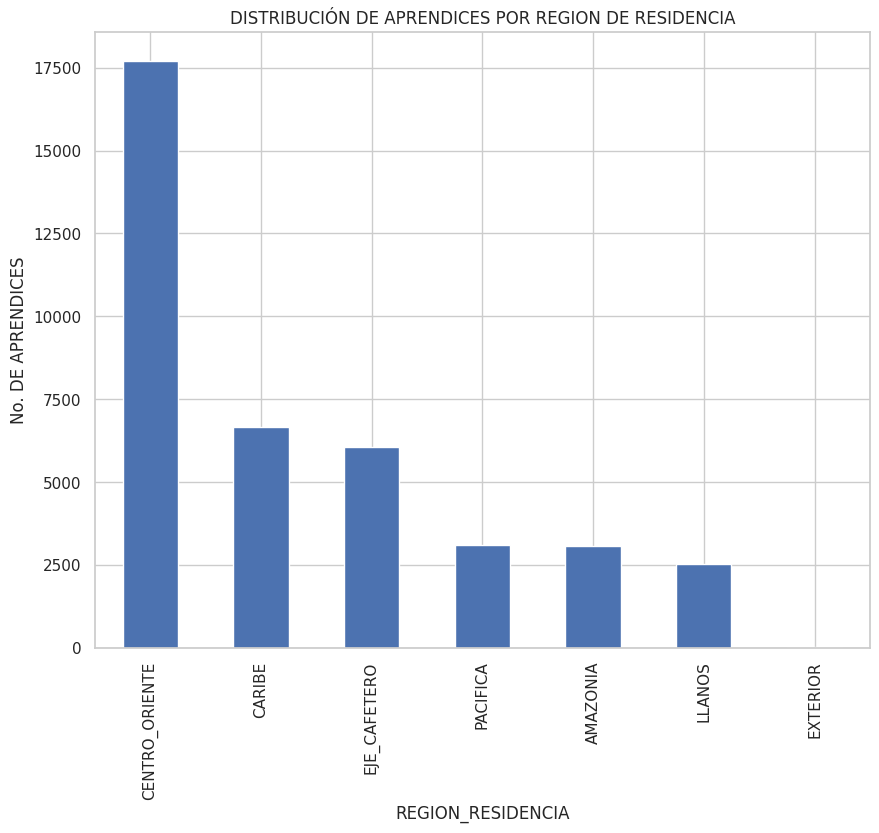

In [1172]:
plt.xlabel("REGIÓN DE RESIDENCIA")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR REGION DE RESIDENCIA")
copia_df["REGION_RESIDENCIA"].value_counts().plot(kind='bar',  figsize=(10,8))

Definición rango etareo: Soraida Lucero Aponte Botia
Niñez (de 0 a 11 años)
Adolescencia (de 12 a 18 años)
Juventud (de 19 a 30 años)
Adultez (de 31 a 60 años)
Vejez (de 60 años en adelante)

In [1173]:
copia_df['R_EDAD']=''

In [1174]:
for e in range (0,len(copia_df['EDAD'])):
  red=copia_df['EDAD'][e]
  if red >= 0 and red < 12:
    copia_df['R_EDAD'][e]= 'NIÑEZ'
  elif red >= 12 and red < 19:
    copia_df['R_EDAD'][e]= 'ADOLESCENCIA'
  elif red >= 19 and red < 31:
      copia_df['R_EDAD'][e]= 'JUVENTUD'
  elif red >= 31 and red < 60:
          copia_df['R_EDAD'][e]= 'ADULTEZ'
  else:
    copia_df['R_EDAD'][e]= 'VEJEZ'

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1174-02abb7e86cb7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'ADULTEZ'
<ipython-input-1174-02abb7e86cb7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'JUVENTUD'
<ipython-input-1174-02abb7e86cb7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'JUVENTUD'
<ipython-input-1174-02abb7e

In [1175]:
copia_df['R_EDAD'].value_counts()

R_EDAD
JUVENTUD        20835
ADOLESCENCIA    10451
ADULTEZ          7665
VEJEZ             150
NIÑEZ               1
Name: count, dtype: int64

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD'}, xlabel='R_EDAD', ylabel='No. DE APRENDICES'>

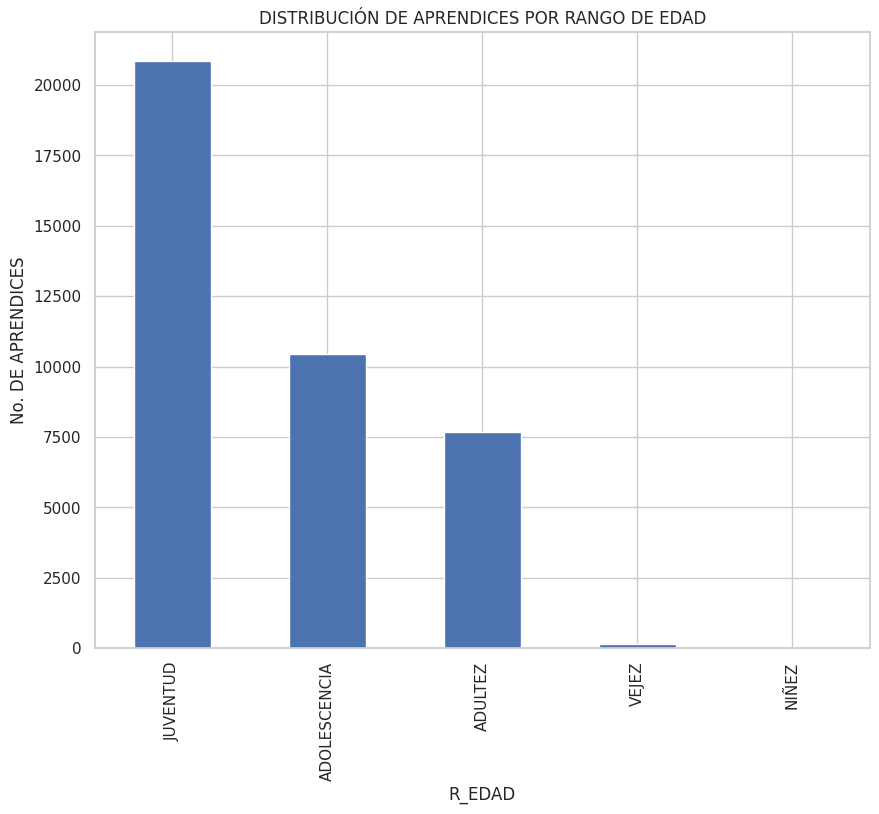

In [1176]:
plt.xlabel("RANGO EDAD")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD")
copia_df["R_EDAD"].value_counts().plot(kind='bar',  figsize=(10,8))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD'}, ylabel='R_EDAD'>

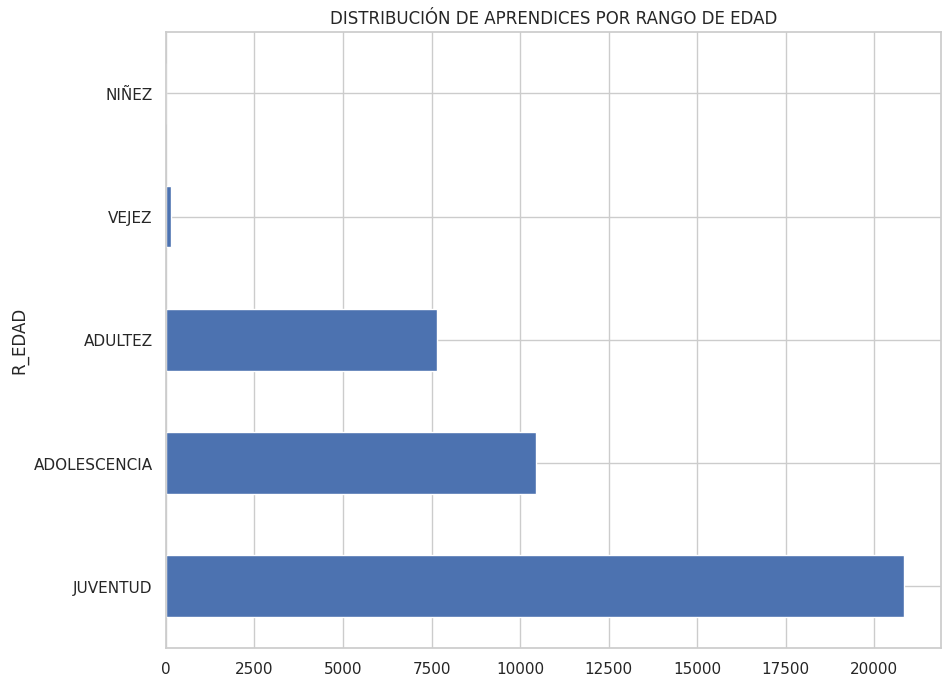

In [1177]:
plt.xlabel("RANGO EDAD")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD")
copia_df["R_EDAD"].value_counts().plot(kind='barh',  figsize=(10,8))

In [1178]:
frecuencia = copia_df["R_EDAD"].value_counts()
total_valores = len(copia_df["R_EDAD"])
for R_EDAD, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"R_EDAD: {R_EDAD}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

R_EDAD: JUVENTUD, Frecuencia: 20835, Porcentaje: 53.28%
R_EDAD: ADOLESCENCIA, Frecuencia: 10451, Porcentaje: 26.73%
R_EDAD: ADULTEZ, Frecuencia: 7665, Porcentaje: 19.60%
R_EDAD: VEJEZ, Frecuencia: 150, Porcentaje: 0.38%
R_EDAD: NIÑEZ, Frecuencia: 1, Porcentaje: 0.00%


Definición rango PUNTAJES:<br>
A (de 0 a 19)<br>
B (de 20 a 39)<br>
C (de 40 a 59)<br>
D (de 60 a 79)<br>
E (de 80 en adelante)

In [1179]:
copia_df['R_PUNTAJES']=''

In [1180]:
for e in range (0,len(copia_df['PUNTAJE_TOTAL'])):
  red=copia_df['PUNTAJE_TOTAL'][e]
  if red >= 0 and red < 20:
    copia_df['R_PUNTAJES'][e]= '0-19'
  elif red >= 20 and red < 40:
    copia_df['R_PUNTAJES'][e]= '20-39'
  elif red >= 40 and red < 60:
      copia_df['R_PUNTAJES'][e]= '40-59'
  elif red >= 60 and red < 80:
          copia_df['R_PUNTAJES'][e]= '60-79'
  else:
    copia_df['R_PUNTAJES'][e]= '80-100'

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1180-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1180-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1180-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1180-7c51

<Axes: >

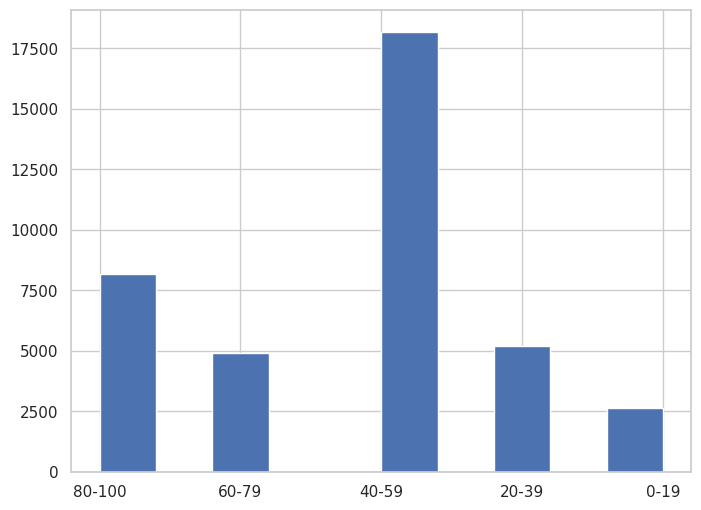

In [1181]:
plt.figure(figsize=(8, 6))
copia_df["R_PUNTAJES"].hist()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR RANGO DE PUNTAJES'}, xlabel='R_PUNTAJES', ylabel='No. DE APRENDICES'>

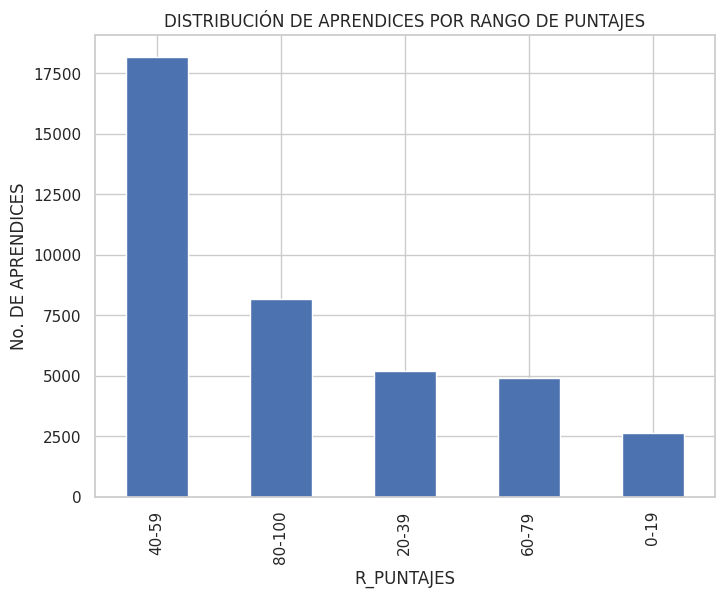

In [1182]:
plt.xlabel("R_PUNTAJES")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR RANGO DE PUNTAJES")
copia_df['R_PUNTAJES'].value_counts().plot(kind='bar', figsize=(8,6))

Se crea la característica APOYO para determinar si el aprendiz recibió algún tipo de apoyo, ya sea de sostenimiento o FIC, en cualquiera de los años que aparecen en el archivo; se coloca el valor 1 si recibió algún apoyo y el valor 0 si no recibió.

In [1183]:
copia_df['APOYO']=''

In [1184]:
for e in range (0,len(copia_df['APOYO_SOSTNMTO_2018'])):
  if copia_df['APOYO_SOSTNMTO_2018'][e] == 1 or copia_df['APOYO_SOSTNMTO_2019'][e] == 1 or copia_df['APOYO_SOSTNMTO_2020'][e] == 1 or copia_df['APOYO_SOSTNMTO_2021'][e] == 1 or copia_df['APOYO_SOSTNMTO_2022'][e] == 1 or copia_df['APOYO_SOSTNMTO_2023'][e] == 1 or copia_df['APOYO_FIC_2018'][e] == 1 or copia_df['APOYO_FIC_2019'][e] == 1 or copia_df['APOYO_FIC_2020'][e] == 1 or copia_df['APOYO_FIC_2021'][e] == 1:
    copia_df['APOYO'][e]= 1
  else:
    copia_df['APOYO'][e]= 0

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1184-8f3fc88ea161>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['APOYO'][e]= 0
<ipython-input-1184-8f3fc88ea161>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['APOYO'][e]= 0
<ipython-input-1184-8f3fc88ea161>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['APOYO'][e]= 0
<ipython-input-1184-8f3fc88ea161>:5: SettingWithCopyWarni

In [1185]:
frecuencia = copia_df["APOYO"].value_counts()
total_valores = len(copia_df["APOYO"])
for APOYO, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"APOYO: {APOYO}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

APOYO: 0, Frecuencia: 36021, Porcentaje: 92.12%
APOYO: 1, Frecuencia: 3081, Porcentaje: 7.88%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES QUE RECIBIERON APOYOS'}, ylabel='APOYO'>

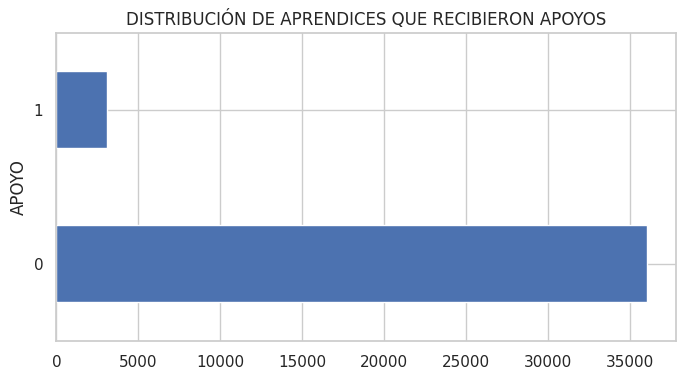

In [1186]:
plt.xlabel("APOYOS")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES QUE RECIBIERON APOYOS")
copia_df["APOYO"].value_counts().plot(kind='barh',  figsize=(8,4))

Concepto de Deserción
CODIGO_ESTADO: 1-Aplazado, 2-Cancelado, 6-Retiro Voluntario

In [1187]:
copia_df['DESERCION']=''
desercion =[1,2,6]

In [1188]:
for e in range (0,len(copia_df['CODIGO_ESTADO'])):
  est=copia_df['CODIGO_ESTADO'][e]
  if est in desercion:
    copia_df['DESERCION'][e]= 1
  else:
    copia_df['DESERCION'][e]= 0

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1188-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1188-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1188-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1188-124122adfdea>:6: SettingW

In [1189]:
print("NO DESERTÓ  {:.2f} %".format(copia_df.apply(lambda x: x['DESERCION'] == 0, axis=1).sum() / len(df) *100))
print("DESERTÓ  {:.2f} %".format(copia_df.apply(lambda x: x['DESERCION'] == 1, axis=1).sum() / len(df) *100))

NO DESERTÓ  59.43 %
DESERTÓ  40.57 %


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES FRENTE A LA DESERCIÓN'}, xlabel='DESERCION', ylabel='No. DE APRENDICES'>

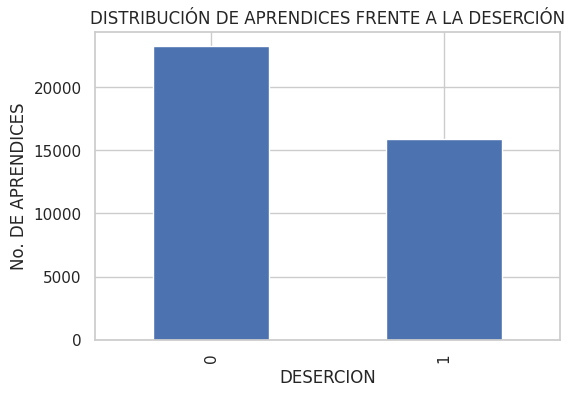

In [1190]:
plt.xlabel("DESERCIÓN (0-NO, 1-SI)")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES FRENTE A LA DESERCIÓN")
copia_df["DESERCION"].value_counts().plot(kind='bar',  figsize=(6,4))

In [1191]:
col = ['GENERO', 'ESTADO_CIVIL', 'ESTRATO',
        'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA',
       'COD_DPTO_RESIDENCIA', 'COD_MUNICIPIO_RESIDENCIA',
       'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO',
       'ESTADO_APRENDIZ', 'COD_NIVEL_FORMACION', 'NIVEL_FORMACION',
       'MODALIDAD']
for n in col:
  print(n,"\n",df[n].value_counts())
  #print(col, df[n])

GENERO 
 GENERO
F    20044
M    19058
Name: count, dtype: int64
ESTADO_CIVIL 
 ESTADO_CIVIL
S    20622
N     8977
U     4330
I     2557
C     2242
E      317
V       57
Name: count, dtype: int64
ESTRATO 
 ESTRATO
1    19781
2    14610
3     4423
4      238
5       38
6       12
Name: count, dtype: int64
NIVEL_SISBEN 
 NIVEL_SISBEN
1.0    3202
2.0    2139
6.0    1127
3.0     523
4.0       4
Name: count, dtype: int64
DBU_HIJOS 
 DBU_HIJOS
0.0    94
1.0    14
2.0     7
Name: count, dtype: int64
COD_PAIS_RESIDENCIA 
 COD_PAIS_RESIDENCIA
57     39077
58         6
34         5
56         3
147        1
351        1
39         1
32         1
51         1
61         1
49         1
593        1
54         1
40         1
52         1
Name: count, dtype: int64
COD_DPTO_RESIDENCIA 
 COD_DPTO_RESIDENCIA
57011     9208
57005     3950
57025     3791
57068     1980
57008     1805
57023     1553
57054     1443
57076     1412
57013     1402
57015     1275
57086     1038
57047      886
57041      867
570

Concepto de Deserción
CODIGO_ESTADO: 1-Aplazado, 2-Cancelado, 6-Retiro Voluntario

In [1192]:
copia_df=df.copy()
copia_df['DESERCION']=''
desercion =[1,2,6]

In [1193]:
for e in range (0,len(copia_df['CODIGO_ESTADO'])):
  est=copia_df['CODIGO_ESTADO'][e]
  if est in desercion:
    copia_df['DESERCION'][e]= 1
  else:
    copia_df['DESERCION'][e]= 0

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1193-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1193-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1193-124122adfdea>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['DESERCION'][e]= 0
<ipython-input-1193-124122adfdea>:6: SettingW

In [1194]:
copia_df['DESERCION'] .value_counts()

DESERCION
0    23240
1    15862
Name: count, dtype: int64

In [1195]:
print("NO DESERTÓ  {:.2f} %".format(copia_df.apply(lambda x: x['DESERCION'] == 0, axis=1).sum() / len(df) *100))
print("DESERTÓ  {:.2f} %".format(copia_df.apply(lambda x: x['DESERCION'] == 1, axis=1).sum() / len(df) *100))

NO DESERTÓ  59.43 %
DESERTÓ  40.57 %


In [1196]:
frecuencia = copia_df["DESERCION"].value_counts()
total_valores = len(copia_df["DESERCION"])
for DESERCION, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"DESERCION: {DESERCION}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

DESERCION: 0, Frecuencia: 23240, Porcentaje: 59.43%
DESERCION: 1, Frecuencia: 15862, Porcentaje: 40.57%


<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES FRENTE A LA DESERCIÓN'}, xlabel='DESERCION', ylabel='No. DE APRENDICES'>

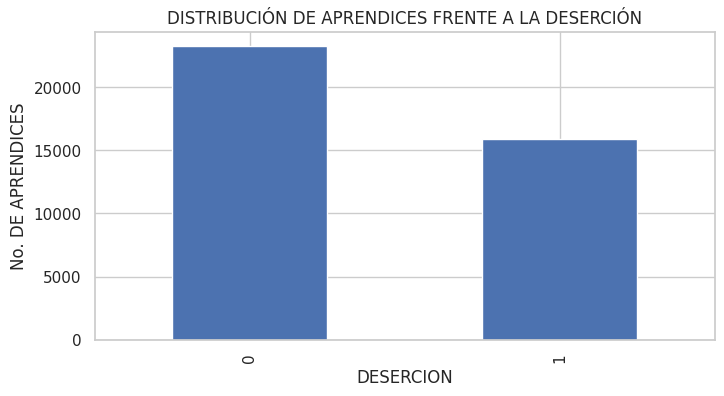

In [1197]:
plt.xlabel("DESERCIÓN (0-NO, 1-SI)")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES FRENTE A LA DESERCIÓN")
copia_df["DESERCION"].value_counts().plot(kind='bar',  figsize=(8,4))

Definición rango etareo: [17/3 2:35 p. m.] Soraida Lucero Aponte Botia
Niñez (de 0 a 11 años)
Adolescencia (de 12 a 18 años)
Juventud (de 19 a 30 años)
Adultez (de 31 a 60 años)
Vejez (de 60 años en adelante)

In [1198]:
copia_df['R_EDAD']=''

In [1199]:
for e in range (0,len(copia_df['EDAD'])):
  red=copia_df['EDAD'][e]
  if red >= 0 and red < 12:
    copia_df['R_EDAD'][e]= 'NIÑEZ'
  elif red >= 12 and red < 19:
    copia_df['R_EDAD'][e]= 'ADOLESCENCIA'
  elif red >= 19 and red < 31:
      copia_df['R_EDAD'][e]= 'JUVENTUD'
  elif red >= 31 and red < 60:
          copia_df['R_EDAD'][e]= 'ADULTEZ'
  else:
    copia_df['R_EDAD'][e]= 'VEJEZ'

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1199-02abb7e86cb7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'ADULTEZ'
<ipython-input-1199-02abb7e86cb7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'JUVENTUD'
<ipython-input-1199-02abb7e86cb7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_EDAD'][e]= 'JUVENTUD'
<ipython-input-1199-02abb7e

In [1200]:
copia_df['R_EDAD'].value_counts()

R_EDAD
JUVENTUD        20835
ADOLESCENCIA    10451
ADULTEZ          7665
VEJEZ             150
NIÑEZ               1
Name: count, dtype: int64

In [1201]:
frecuencia = copia_df['R_EDAD'].value_counts()
total_valores = len(copia_df['R_EDAD'])
for R_EDAD, conteo in frecuencia.items():
    porcentaje = (conteo / total_valores) * 100
    print(f"R_EDAD: {R_EDAD}, Frecuencia: {conteo}, Porcentaje: {porcentaje:.2f}%")

R_EDAD: JUVENTUD, Frecuencia: 20835, Porcentaje: 53.28%
R_EDAD: ADOLESCENCIA, Frecuencia: 10451, Porcentaje: 26.73%
R_EDAD: ADULTEZ, Frecuencia: 7665, Porcentaje: 19.60%
R_EDAD: VEJEZ, Frecuencia: 150, Porcentaje: 0.38%
R_EDAD: NIÑEZ, Frecuencia: 1, Porcentaje: 0.00%


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD')

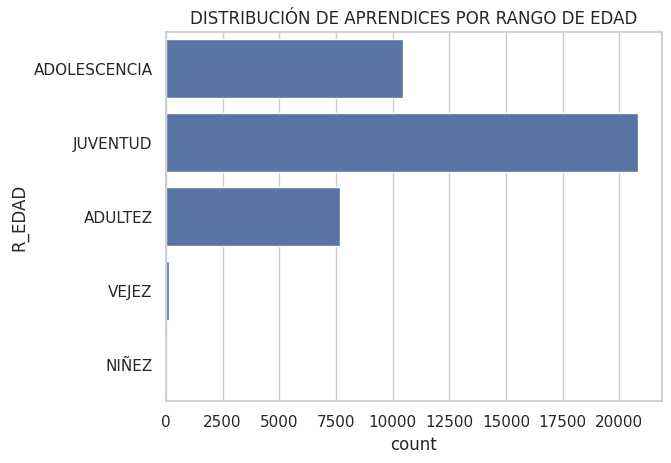

In [1202]:
figsize=(30,18)
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["R_EDAD"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD")

#Análisis exploratorio:

In [1203]:
df.head()

,NIS,GENERO,FECHA_NACIMIENTO,ESTADO_CIVIL,ESTRATO,PUNTAJE_ICFES,NIVEL_SISBEN,DBU_HIJOS,COD_PAIS_RESIDENCIA,PAIS_RESIDENCIA,...,APOYO_SOSTNMTO_2023,APOYO_FIC_2018,APOYO_FIC_2019,APOYO_FIC_2020,APOYO_FIC_2021,PUNTAJE_TOTAL,FTE_ACC_PREFERENTE,FECHA_MATRICULA,FECHA_ULTIMO_ESTADO,DURACIÓN_PROGRAMA
0,23375382,M,2001-04-21,S,2,NaN,NaN,NaN,57,COLOMBIA,...,0,0,0,0,0,89.13,1.0,2017-12-18,2019-02-19,12
1,26245987,M,2000-07-03,S,2,NaN,NaN,NaN,57,COLOMBIA,...,0,0,0,0,0,87.27,NaN,2017-12-18,2019-02-08,12
2,25349137,F,2000-06-03,S,2,NaN,NaN,NaN,57,COLOMBIA,...,0,0,0,0,0,88.06,NaN,2017-12-18,2019-02-08,12
3,22648118,F,2000-05-30,S,2,NaN,NaN,NaN,57,COLOMBIA,...,0,0,0,0,0,88.00,NaN,2017-12-18,2019-02-08,12
4,22354653,M,1995-03-26,N,2,NaN,NaN,NaN,57,COLOMBIA,...,0,0,0,0,0,87.85,NaN,2017-12-18,2019-02-11,12


In [1204]:
df.shape

(39102, 52)

In [1205]:
df.columns

Index(['NIS', 'GENERO', 'FECHA_NACIMIENTO', 'ESTADO_CIVIL', 'ESTRATO',
       'PUNTAJE_ICFES', 'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA',
       'PAIS_RESIDENCIA', 'COD_DPTO_RESIDENCIA', 'DPTO_RESIDENCIA',
       'COD_MUNICIPIO_RESIDENCIA', 'MUNICIPIO_RESIDENCIA',
       'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO',
       'ESTADO_APRENDIZ', 'COD_NIVEL_FORMACION', 'NIVEL_FORMACION',
       'MODALIDAD', 'COD_PROGRAMA', 'NOMBRE_PROGRAMA',
       'CODIGO_RED_CONOCIMIENTO', 'NOM_RED_CONOCIMIENTO',
       'COD_LINEA_TECNOLÓGICA', 'NOM_LINEA_TECNOLÓGICA',
       'CÓDIGO_TECNOLOGÍA_DE_RED', 'NOMBRE_TECNOLOGÍA_DE_RED',
       'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL', 'NOMBRE_REGIONAL',
       'CÓDIGO_CENTRO', 'SEDE', 'EDAD', 'CÓDIGO_TIPO_POBLACIÓN',
       'NOMBRE_TIPO_POBLACIÓN', 'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019',
       'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021', 'APOYO_SOSTNMTO_2022',
       'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018', 'APOYO_FIC_2019',
    

In [1206]:
df.describe()

,NIS,FECHA_NACIMIENTO,ESTRATO,PUNTAJE_ICFES,NIVEL_SISBEN,DBU_HIJOS,COD_PAIS_RESIDENCIA,COD_DPTO_RESIDENCIA,COD_MUNICIPIO_RESIDENCIA,COD_ZONA_RESIDENCIA,...,APOYO_SOSTNMTO_2023,APOYO_FIC_2018,APOYO_FIC_2019,APOYO_FIC_2020,APOYO_FIC_2021,PUNTAJE_TOTAL,FTE_ACC_PREFERENTE,FECHA_MATRICULA,FECHA_ULTIMO_ESTADO,DURACIÓN_PROGRAMA
count,3.910200e+04,39102,39102.000000,1910.000000,6995.000000,115.000000,39102.000000,39102.000000,3.910200e+04,2791.000000,...,39102.0,39102.000000,39102.000000,39102.000000,39102.0,39102.000000,5167.000000,39102,39102,39102.000000
mean,2.033146e+07,1993-03-26 17:13:45.840110336,1.623549,254.324921,2.262616,0.243478,57.018669,57051.360084,5.717202e+07,134.008599,...,0.0,0.036903,0.024449,0.001509,0.0,54.687795,1.339849,2018-01-06 15:38:11.913456896,2019-11-28 06:26:18.763234560,531.537006
min,7.195145e+06,1925-08-20 00:00:00,1.000000,1.000000,1.000000,0.000000,32.000000,32001.000000,3.200100e+07,1.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2017-12-13 00:00:00,2017-12-13 00:00:00,6.000000
25%,1.597555e+07,1989-08-17 00:00:00,1.000000,214.000000,1.000000,0.000000,57.000000,57011.000000,5.701100e+07,10.000000,...,0.0,0.000000,0.000000,0.000000,0.0,42.070000,1.000000,2017-12-19 00:00:00,2018-09-20 00:00:00,12.000000
50%,2.203987e+07,1996-03-10 00:00:00,1.000000,263.000000,2.000000,0.000000,57.000000,57023.000000,5.702318e+07,83.000000,...,0.0,0.000000,0.000000,0.000000,0.0,50.830000,1.000000,2017-12-26 00:00:00,2019-07-09 00:00:00,24.000000
75%,2.579352e+07,1999-07-14 00:00:00,2.000000,300.750000,2.000000,0.000000,57.000000,57054.000000,5.705450e+07,206.000000,...,0.0,0.000000,0.000000,0.000000,0.0,73.230000,1.000000,2018-01-22 00:00:00,2020-10-28 00:00:00,864.000000
max,3.368474e+07,2008-07-02 00:00:00,6.000000,999.000000,6.000000,2.000000,593.000000,593020.000000,1.000000e+09,466.000000,...,0.0,1.000000,1.000000,1.000000,0.0,108.470000,13.000000,2020-11-23 00:00:00,2023-05-12 00:00:00,3960.000000
std,5.916753e+06,NaN,0.717842,137.298622,1.744741,0.555535,3.141385,3141.384418,1.111544e+07,154.681330,...,0.0,0.188527,0.154440,0.038815,0.0,22.819638,1.721582,NaN,NaN,942.339814


In [1207]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39102 entries, 0 to 39101
Data columns (total 52 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   NIS                       39102 non-null  int64         
 1   GENERO                    39102 non-null  object        
 2   FECHA_NACIMIENTO          39102 non-null  datetime64[ns]
 3   ESTADO_CIVIL              39102 non-null  object        
 4   ESTRATO                   39102 non-null  int64         
 5   PUNTAJE_ICFES             1910 non-null   float64       
 6   NIVEL_SISBEN              6995 non-null   float64       
 7   DBU_HIJOS                 115 non-null    float64       
 8   COD_PAIS_RESIDENCIA       39102 non-null  int64         
 9   PAIS_RESIDENCIA           39102 non-null  object        
 10  COD_DPTO_RESIDENCIA       39102 non-null  int64         
 11  DPTO_RESIDENCIA           39102 non-null  object        
 12  COD_MUNICIPIO_RESI

In [1208]:
def check(data):
    l=[]
    columns=data.columns
    for col in columns:
        dtypes=data[col].dtypes
        nunique=data[col].nunique()
        sum_null=data[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    res=pd.DataFrame(l)
    res.columns=['column','dtypes','nunique','sum_null']
    return res
check(df)

,column,dtypes,nunique,sum_null
0,NIS,int64,38054,0
1,GENERO,object,2,0
2,FECHA_NACIMIENTO,datetime64[ns],10113,0
3,ESTADO_CIVIL,object,7,0
4,ESTRATO,int64,6,0
5,PUNTAJE_ICFES,float64,398,37192
6,NIVEL_SISBEN,float64,5,32107
7,DBU_HIJOS,float64,3,38987
8,COD_PAIS_RESIDENCIA,int64,15,0
9,PAIS_RESIDENCIA,object,15,0


In [1209]:
C_col = []
N_col = []
for col in df.columns:
    if df[col].dtype == 'object':
        C_col.append(col)
    else:
        N_col.append(col)

# Imprimir las listas actualizadas
print(f"# Columnas Numéricas = {len(N_col)}", N_col)
print(f"# Columnas Categóricas = {len(C_col)}", C_col)

# Columnas Numéricas = 37 ['NIS', 'FECHA_NACIMIENTO', 'ESTRATO', 'PUNTAJE_ICFES', 'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA', 'COD_DPTO_RESIDENCIA', 'COD_MUNICIPIO_RESIDENCIA', 'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA', 'CODIGO_ESTADO', 'COD_NIVEL_FORMACION', 'COD_PROGRAMA', 'CODIGO_RED_CONOCIMIENTO', 'COD_LINEA_TECNOLÓGICA', 'CÓDIGO_TECNOLOGÍA_DE_RED', 'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL', 'CÓDIGO_CENTRO', 'EDAD', 'CÓDIGO_TIPO_POBLACIÓN', 'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019', 'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021', 'APOYO_SOSTNMTO_2022', 'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018', 'APOYO_FIC_2019', 'APOYO_FIC_2020', 'APOYO_FIC_2021', 'PUNTAJE_TOTAL', 'FTE_ACC_PREFERENTE', 'FECHA_MATRICULA', 'FECHA_ULTIMO_ESTADO', 'DURACIÓN_PROGRAMA']
# Columnas Categóricas = 15 ['GENERO', 'ESTADO_CIVIL', 'PAIS_RESIDENCIA', 'DPTO_RESIDENCIA', 'MUNICIPIO_RESIDENCIA', 'ESTADO_APRENDIZ', 'NIVEL_FORMACION', 'MODALIDAD', 'NOMBRE_PROGRAMA', 'NOM_RED_CONOCIMIENTO', 'NOM_LINEA_TECNOLÓGI

In [1210]:
print("Análisis de Columnas Categóricas")
result_dfs = []
for col in C_col:
    col_counts = df[col].value_counts()
    total_rows = len(df)
    col_percentages = (col_counts / total_rows) * 100

    result_df = pd.DataFrame({
        "Valores Únicos": col_counts.index,
        "Recuento": col_counts.values,
        "Porcentaje por Categoría": col_percentages.values
    })
    result_dfs.append(result_df)
for col, result_df in zip(C_col, result_dfs):
    print(f"\nAnálisis para la columna '{col}':")
    display(result_df)
    print("-" * 50)

Análisis de Columnas Categóricas

Análisis para la columna 'GENERO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,F,20044,51.260805
1,M,19058,48.739195


--------------------------------------------------

Análisis para la columna 'ESTADO_CIVIL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,S,20622,52.738990
1,N,8977,22.957905
2,U,4330,11.073602
3,I,2557,6.539307
4,C,2242,5.733722
5,E,317,0.810700
6,V,57,0.145773


--------------------------------------------------

Análisis para la columna 'PAIS_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,COLOMBIA,39077,99.936065
1,VENEZUELA,6,0.015344
2,ESPAÑA,5,0.012787
3,CHILE,3,0.007672
4,ESTADOS UNIDOS,1,0.002557
5,PORTUGAL,1,0.002557
6,ITALIA,1,0.002557
7,BÉLGICA,1,0.002557
8,PERÚ,1,0.002557
9,AUSTRALIA,1,0.002557


--------------------------------------------------

Análisis para la columna 'DPTO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,BOGOTÁ D.C.,9208,23.548668
1,ANTIOQUIA,3950,10.101785
2,CUNDINAMARCA,3791,9.695156
3,SANTANDER,1980,5.063680
4,ATLÁNTICO,1805,4.616132
5,CÓRDOBA,1553,3.971664
6,NORTE DE SANTANDER,1443,3.690348
7,VALLE DEL CAUCA,1412,3.611068
8,BOLÍVAR,1402,3.585494
9,BOYACÁ,1275,3.260703


--------------------------------------------------

Análisis para la columna 'MUNICIPIO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,BOGOTÁ,9208,23.548668
1,MEDELLÍN,1698,4.342489
2,CARTAGENA,1066,2.726203
3,SOACHA,948,2.424428
4,BARRANQUILLA,914,2.337476
...,...,...,...
848,MIAMI,1,0.002557
849,GUAYABAL DE SIQUIMA,1,0.002557
850,SAN BENITO ABAD,1,0.002557
851,GUATAPÉ,1,0.002557


--------------------------------------------------

Análisis para la columna 'ESTADO_APRENDIZ':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CERTIFICADO,19905,50.905325
1,CANCELADO,12352,31.589177
2,RETIRO VOLUNTARIO,3495,8.938162
3,TRASLADO,1776,4.541967
4,FORMACION,1320,3.375786
5,POR CERTIFICAR,219,0.560074
6,APLAZADO,15,0.038361
7,CONDICIONADO,14,0.035804
8,INDUCCION,6,0.015344


--------------------------------------------------

Análisis para la columna 'NIVEL_FORMACION':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,TÉCNICO,26480,67.720321
1,TECNÓLOGO,10162,25.988440
2,ESPECIALIZACIÓN TECNOLÓGICA,1038,2.654596
3,OPERARIO,978,2.501151
4,AUXILIAR,379,0.969260
5,PROFUNDIZACIÓN TÉCNICA,65,0.166232


--------------------------------------------------

Análisis para la columna 'MODALIDAD':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,PRESENCIAL,39102,100.0


--------------------------------------------------

Análisis para la columna 'NOMBRE_PROGRAMA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,ASISTENCIA ADMINISTRATIVA,2361,6.038054
1,SISTEMAS,2341,5.986906
2,GESTIÓN DEL TALENTO HUMANO,1478,3.779858
3,CONTABILIZACIÓN DE OPERACIONES COMERCIALES Y F...,1367,3.495985
4,ASISTENCIA EN ORGANIZACIÓN DE ARCHIVOS,1231,3.148177
...,...,...,...
210,GESTIÓN SOSTENIBLE DE LA BIODIVERSIDAD VEGETAL,15,0.038361
211,CONSTRUCCIÓN DE ESTRUCTURAS EN CONCRETO,15,0.038361
212,INFORMACIÓN TURÍSTICA,15,0.038361
213,INSPECCION Y ENSAYOS CON PROCESOS NO DESTRUCTIVOS,15,0.038361


--------------------------------------------------

Análisis para la columna 'NOM_RED_CONOCIMIENTO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,RED DE CONOCIMIENTO EN SALUD,1438,3.677561
1,RED DE CONOCIMIENTO EN ENERGÍA ELÉCTRICA,1308,3.345097
2,RED DE CONOCIMIENTO EN ELECTRÓNICA Y AUTOMATIZ...,886,2.265869
3,RED DE CONOCIMIENTO EN MECÁNICA INDUSTRIAL,854,2.184032
4,RED DE CONOCIMIENTO AGRÍCOLA,677,1.731369
5,"RED DE CONOCIMIENTO TEXTIL, CONFECCIÓN, DISEÑO...",611,1.562580
6,RED DE CONOCIMIENTO EN SERVICIOS PERSONALES,606,1.549793
7,RED DE CONOCIMIENTO AUTOMOTOR,536,1.370774
8,"RED DE CONOCIMIENTO EN GESTIÓN ADMINISTRATIVA,...",454,1.161066
9,"RED DE CONOCIMIENTO EN INFORMÁTICA, DISEÑO Y D...",337,0.861848


--------------------------------------------------

Análisis para la columna 'NOM_LINEA_TECNOLÓGICA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CLIENTE,20643,52.792696
1,PRODUCCIÓN Y TRANSFORMACIÓN,9012,23.047414
2,TECNOLOGÍAS DE LA INFORMACIÓN Y LAS COMUNICACI...,5568,14.239681
3,MATERIALES HERRAMIENTAS,2105,5.383356
4,DISEÑO,1774,4.536852


--------------------------------------------------

Análisis para la columna 'NOMBRE_TECNOLOGÍA_DE_RED':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,TECNOLOGÍAS DE GESTIÓN ADMINISTRATIVA Y SERVIC...,12248,31.323206
1,"TECNOLOGÍAS DE LA INFORMACIÓN, DISEÑO Y DESARR...",4992,12.766610
2,TECNOLOGÍAS DE SERVICIOS DE SALUD,3467,8.866554
3,"TECNOLOGÍAS DE MANTENIMIENTO PREDICTIVO, PREVE...",2740,7.007314
4,TECNOLOGÍAS DE SERVICIOS TURÍSTICOS,2452,6.270779
5,TECNOLOGÍAS DE PRODUCCIÓN INDUSTRIAL,2234,5.713263
6,MATERIALES PARA LA CONSTRUCCIÓN,1974,5.048335
7,LOGÍSTICA Y TRANSPORTE,1489,3.807989
8,TECNOLOGÍAS AGRÍCOLAS,1453,3.715922
9,TECNOLOGÍAS DE PRODUCCIÓN LIMPIA,1311,3.352770


--------------------------------------------------

Análisis para la columna 'NOMBRE_REGIONAL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,REGIONAL DISTRITO CAPITAL,9699,24.804358
1,REGIONAL ANTIOQUIA,4024,10.291034
2,REGIONAL CUNDINAMARCA,3557,9.096721
3,REGIONAL SANTANDER,2088,5.339880
4,REGIONAL ATLÁNTICO,1841,4.708199
5,REGIONAL CÓRDOBA,1509,3.859138
6,REGIONAL NORTE DE SANTANDER,1454,3.718480
7,REGIONAL BOLÍVAR,1335,3.414148
8,REGIONAL VALLE,1334,3.411590
9,REGIONAL BOYACÁ,1263,3.230014


--------------------------------------------------

Análisis para la columna 'SEDE':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,CENTRO DE GESTION ADMINISTRATIVA,2235,5.715820
1,CENTRO DE COMERCIO Y SERVICIOS,2211,5.654442
2,CENTRO DE SERVICIOS FINANCIEROS,2006,5.130172
3,"CENTRO DE ELECTRICIDAD, ELECTRÓNICA Y TELECOMU...",1442,3.687791
4,"CENTRO DE LA INDUSTRIA, LA EMPRESA Y LOS SERVI...",1127,2.882206
...,...,...,...
98,CENTRO DE INDUSTRIA Y CONSTRUCCION,33,0.084395
99,CENTRO AGROINDUSTRIAL Y PESQUERO DE LA COSTA P...,31,0.079280
100,CENTRO DE LOS RECURSOS NATURALES RENOVABLES - ...,29,0.074165
101,"COMPLEJO TECNOLOGICO, TURISTICO Y AGROINDUSTRI...",28,0.071608


--------------------------------------------------

Análisis para la columna 'NOMBRE_TIPO_POBLACIÓN':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,NINGUNA,23906,61.137538
1,DESPLAZADOS POR LA VIOLENCIA,4511,11.536494
2,JOVENES VULNERABLES,3892,9.953455
3,EMPRENDEDORES,1805,4.616132
4,MUJER CABEZA DE FAMILIA,1246,3.186538
5,ADOLESCENTE TRABAJADOR,807,2.063833
6,AFROCOLOMBIANOS DESPLAZADOS POR LA VIOLENCIA,502,1.283822
7,INDIGENA,407,1.040867
8,AFROCOLOMBIANO,395,1.010179
9,NEGRO,365,0.933456


--------------------------------------------------


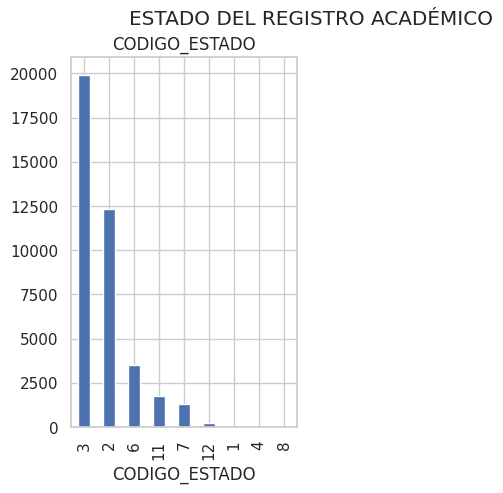

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTADO'}, xlabel='CODIGO_ESTADO', ylabel='CÓDIGO DE ESTADOS'>

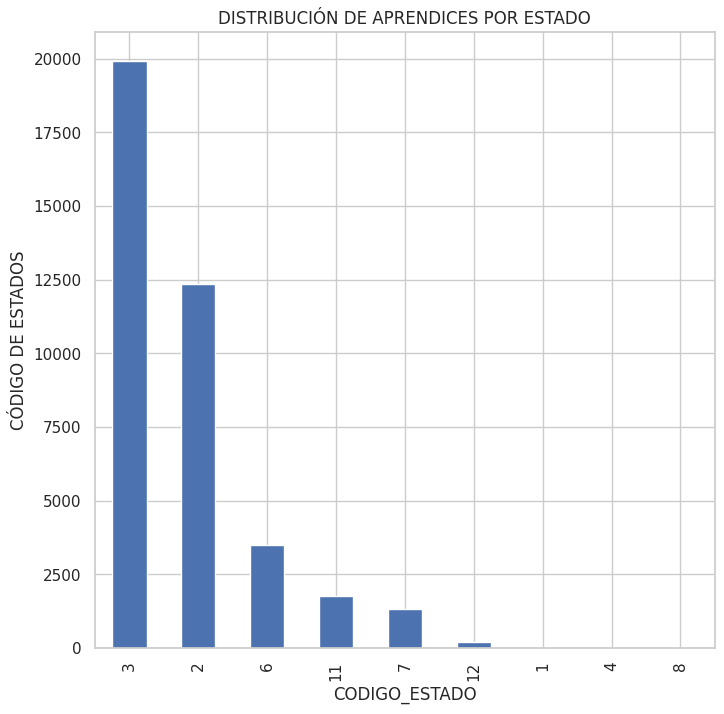

In [1211]:
# INTENTO PARA GENERAR GRAFICA CON PORCENTAJES PARA GENERO
CODIGO_ESTADO = df["CODIGO_ESTADO"].value_counts()
plt.subplot(1,2,1)
plt.title("CODIGO_ESTADO")
CODIGO_ESTADO.plot(kind="bar")
plt.suptitle("ESTADO DEL REGISTRO ACADÉMICO")
plt.show()

plt.xlabel("CANTIDAD DE APRENDICES")
plt.ylabel("CÓDIGO DE ESTADOS")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTADO")
df["CODIGO_ESTADO"].value_counts().plot(kind='bar', figsize=(8,8))

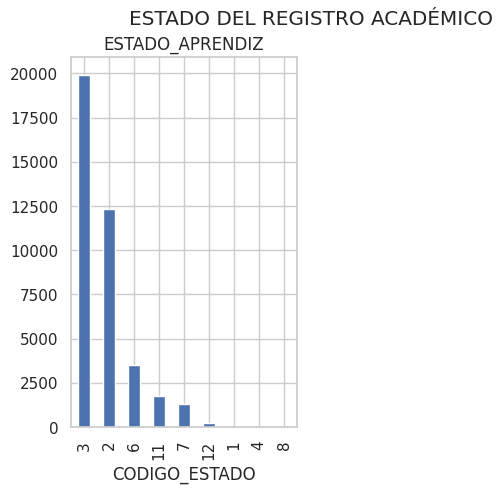

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR ESTADO'}, xlabel='ESTADO_APRENDIZ', ylabel='CANTIDAD DE APRENDICES'>

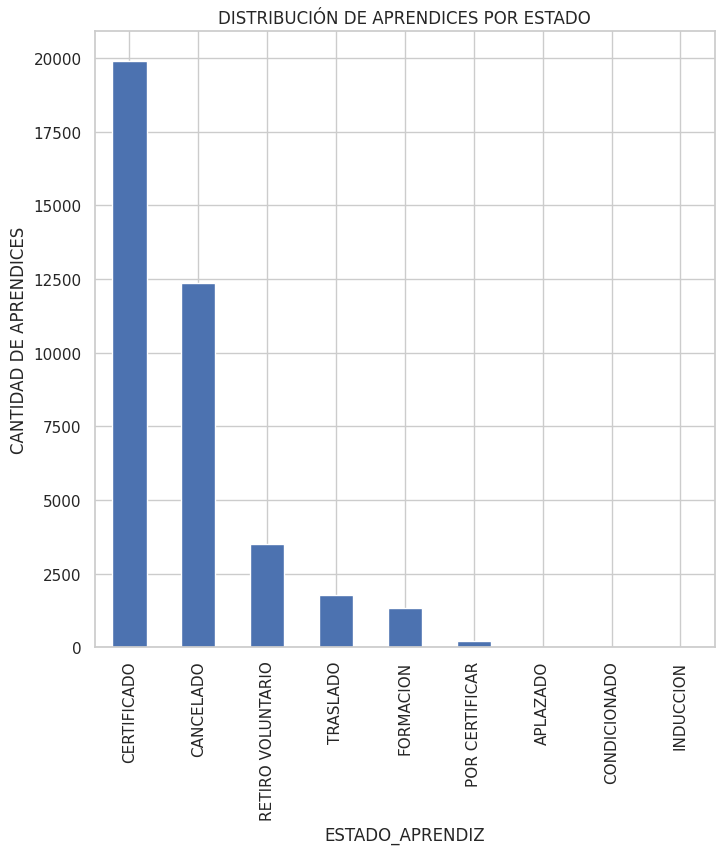

In [1212]:
# INTENTO PARA GENERAR GRAFICA CON NOMBRE ESTADOS
ESTADO_APRENDIZ = df["ESTADO_APRENDIZ"].value_counts()
plt.subplot(1,2,1)
plt.title("ESTADO_APRENDIZ")
CODIGO_ESTADO.plot(kind="bar")
plt.suptitle("ESTADO DEL REGISTRO ACADÉMICO")
plt.show()

plt.xlabel("ESTADOS")
plt.ylabel("CANTIDAD DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR ESTADO")
df["ESTADO_APRENDIZ"].value_counts().plot(kind='bar', figsize=(8,8))

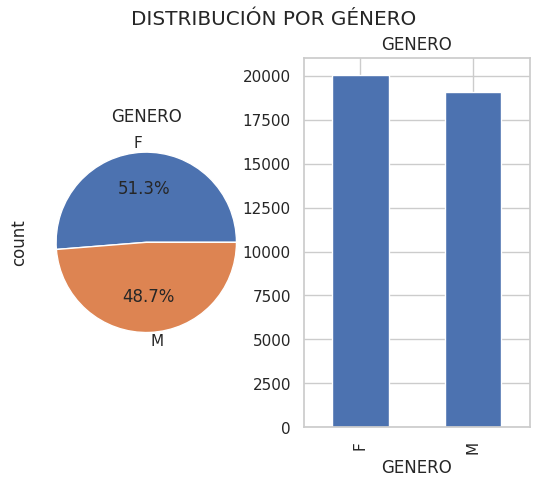

In [1213]:
# INTENTO PARA GENERAR GRAFICA CON PORCENTAJES PARA GENERO
genero = df["GENERO"].value_counts()
plt.subplot(1,2,1)
genero.plot(kind="pie", autopct='%1.01f%%')
plt.title("GENERO")
#plt.suptitle("suptitle")

plt.subplot(1,2,2)
genero.plot(kind="bar")
plt.title("GENERO")
plt.suptitle("DISTRIBUCIÓN POR GÉNERO")
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR COD_NIVEL_FORMACIONL'}, xlabel='COD_NIVEL_FORMACION', ylabel='No. DE APRENDICES'>

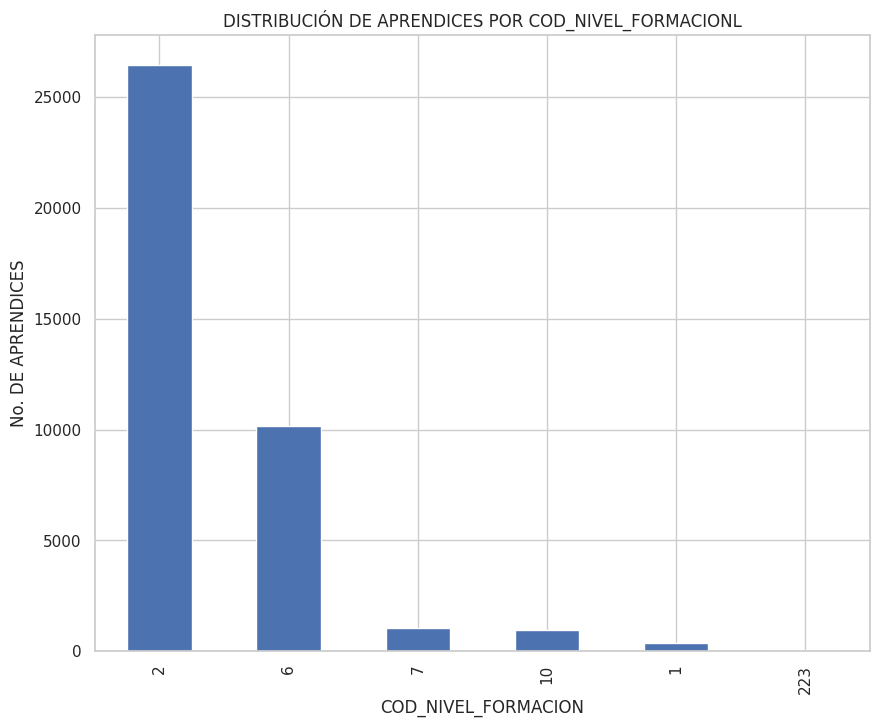

In [1214]:
plt.xlabel("COD_NIVEL_FORMACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR COD_NIVEL_FORMACIONL")
df["COD_NIVEL_FORMACION"].value_counts().plot(kind='bar', figsize=(10,8))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACIONL'}, xlabel='NIVEL_FORMACION', ylabel='No. DE APRENDICES'>

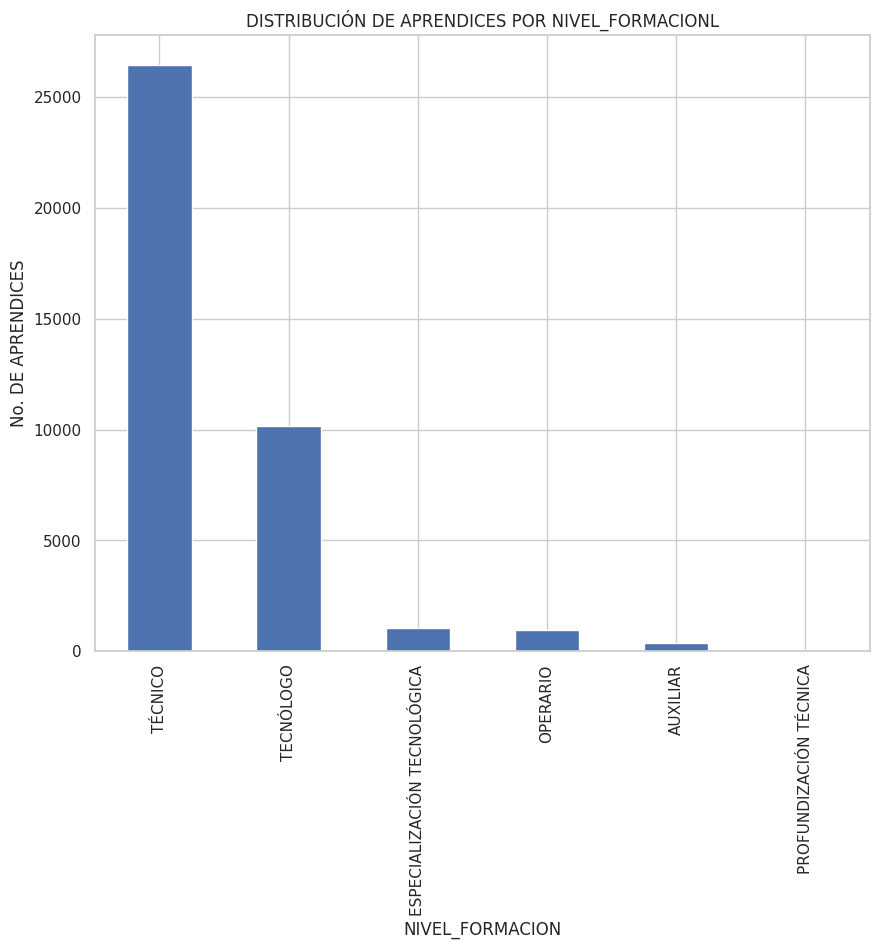

In [1215]:
plt.xlabel("NIVEL_FORMACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR NIVEL_FORMACIONL")
df["NIVEL_FORMACION"].value_counts().plot(kind='bar', figsize=(10,8))

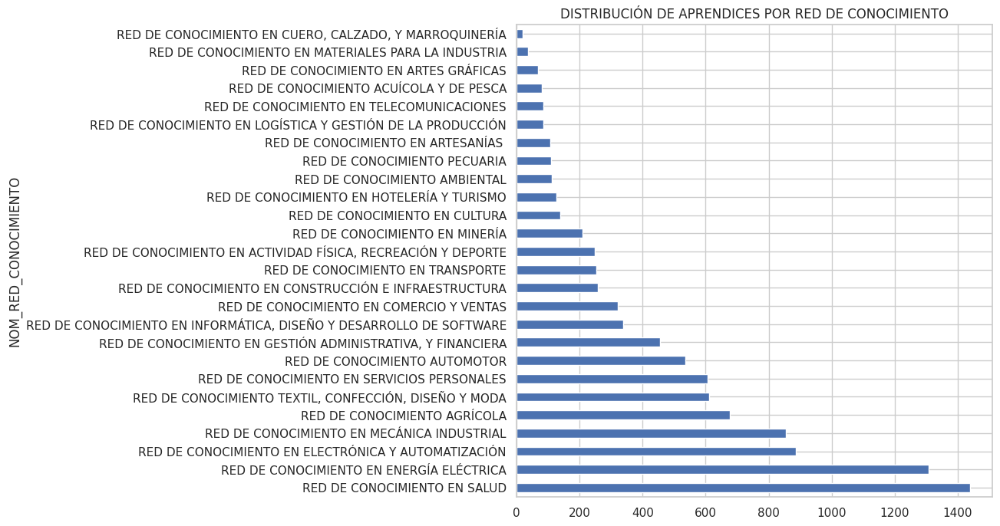

In [1216]:
plt.xlabel("ESTADOS")
plt.ylabel("CANTIDAD DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR RED DE CONOCIMIENTO")
df["NOM_RED_CONOCIMIENTO"].value_counts().plot(kind='barh', figsize=(8,8))
plt.show()

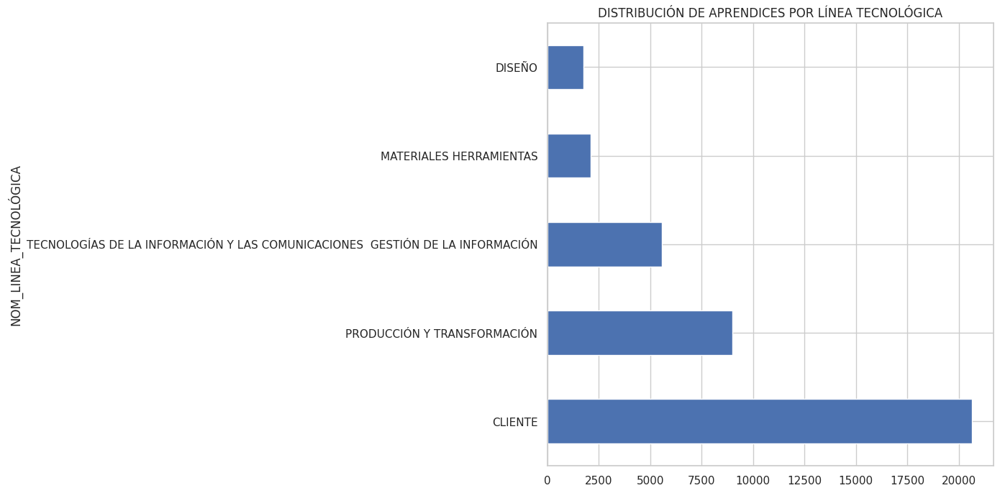

In [1217]:
plt.xlabel("LÍNEA TECNOLÓGICA")
plt.ylabel("CANTIDAD DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR LÍNEA TECNOLÓGICA")
df["NOM_LINEA_TECNOLÓGICA"].value_counts().plot(kind='barh', figsize=(8,8))
plt.show()

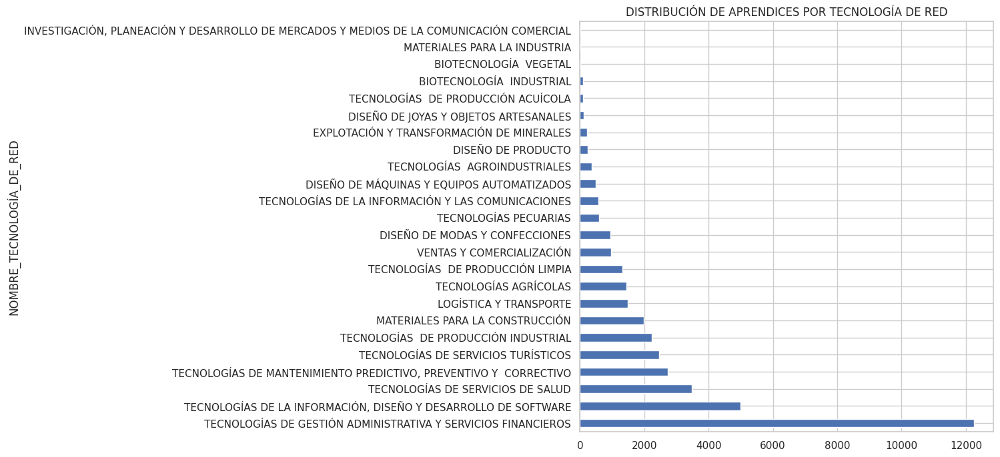

In [1218]:
plt.xlabel("TECNOLOGÍA DE RED")
plt.ylabel("CANTIDAD DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR TECNOLOGÍA DE RED")
df["NOMBRE_TECNOLOGÍA_DE_RED"].value_counts().plot(kind='barh', figsize=(8,8))
plt.show()

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR REGIONAL'}, ylabel='NOMBRE_REGIONAL'>

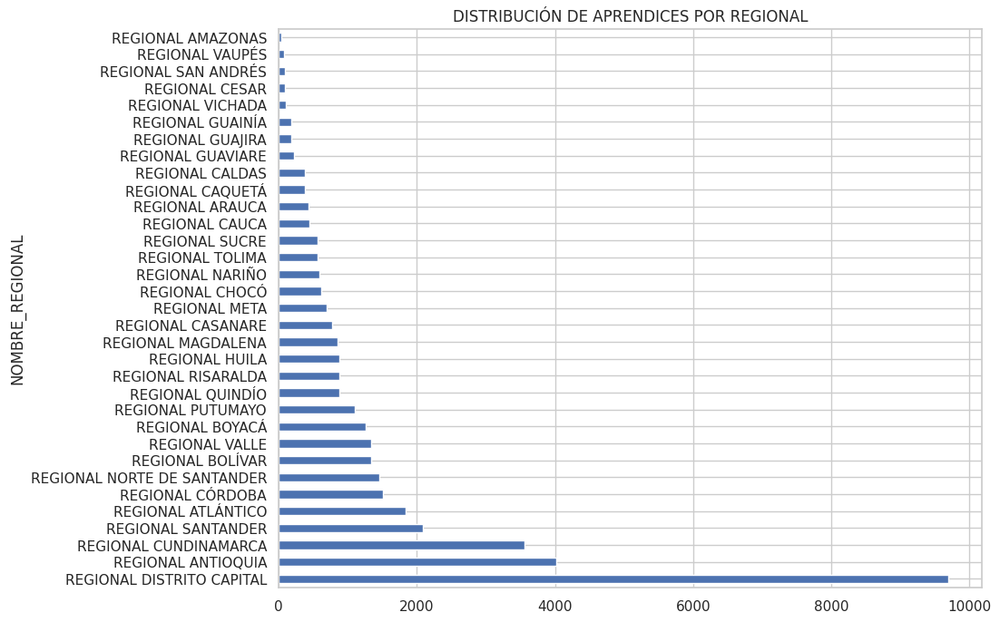

In [1219]:
plt.xlabel("REGIONAL")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR REGIONAL")
df["NOMBRE_REGIONAL"].value_counts().plot(kind='barh', figsize=(10,8))

<Axes: title={'center': 'DISTRIBUCIÓN DE APRENDICES POR TIPO POBLACION'}, xlabel='NOMBRE_TIPO_POBLACIÓN', ylabel='No. DE APRENDICES'>

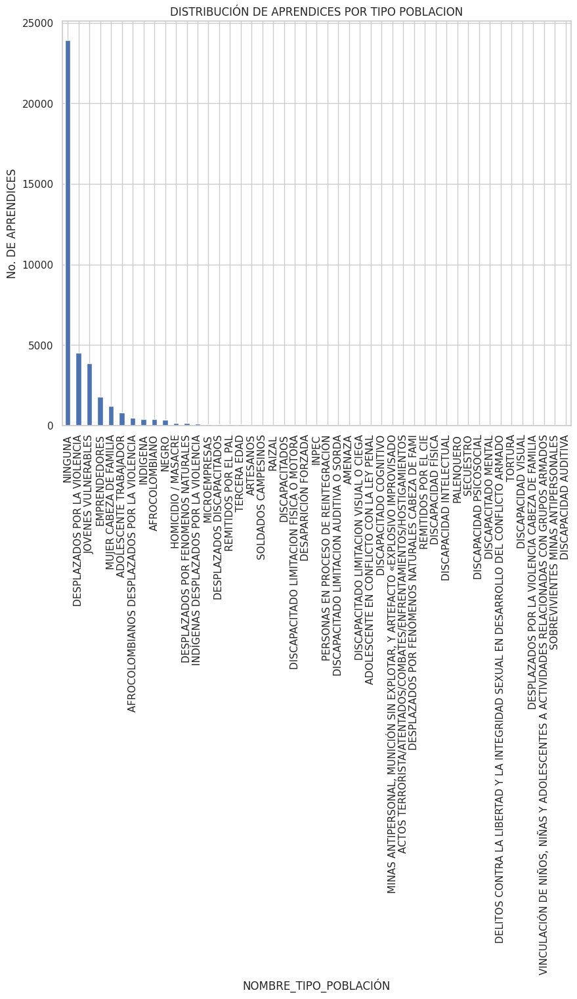

In [1220]:
plt.xlabel("NOMBRE_TIPO_POBLACION")
plt.ylabel("No. DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR TIPO POBLACION")
df["NOMBRE_TIPO_POBLACIÓN"].value_counts().plot(kind='bar', figsize=(10,8))

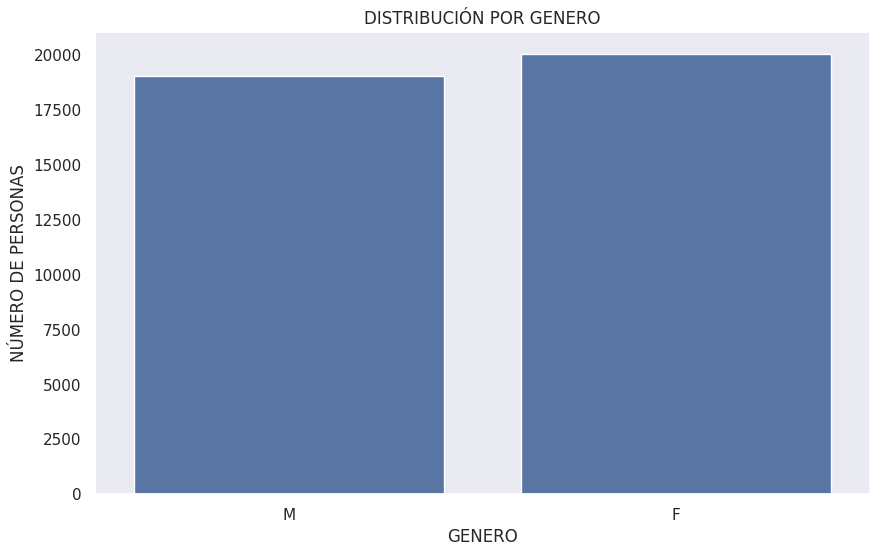

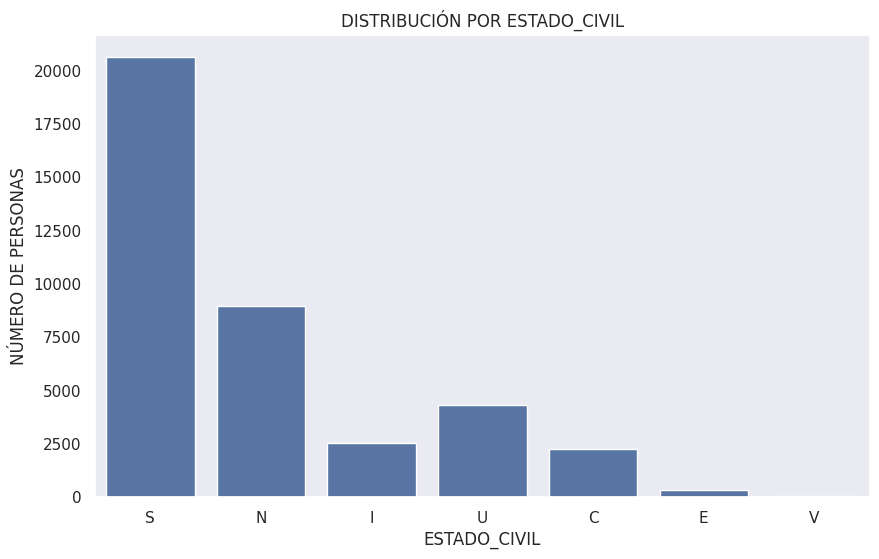

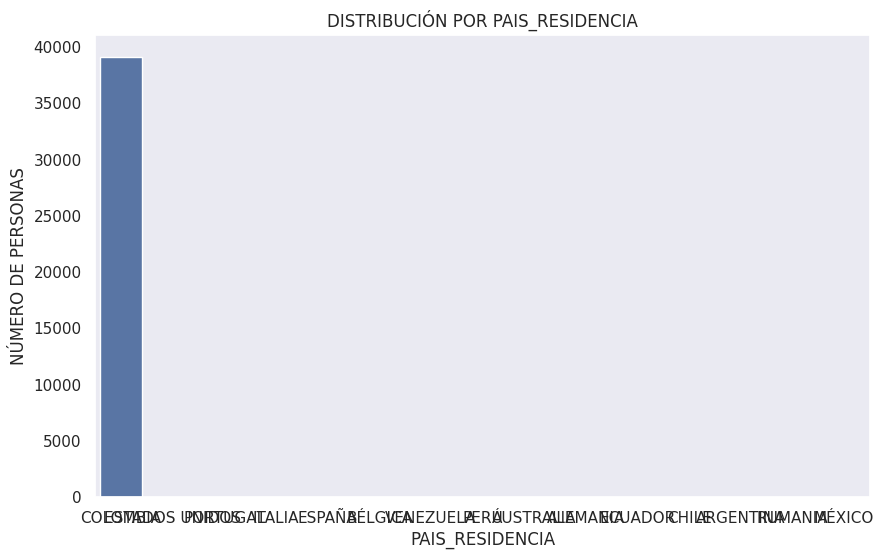

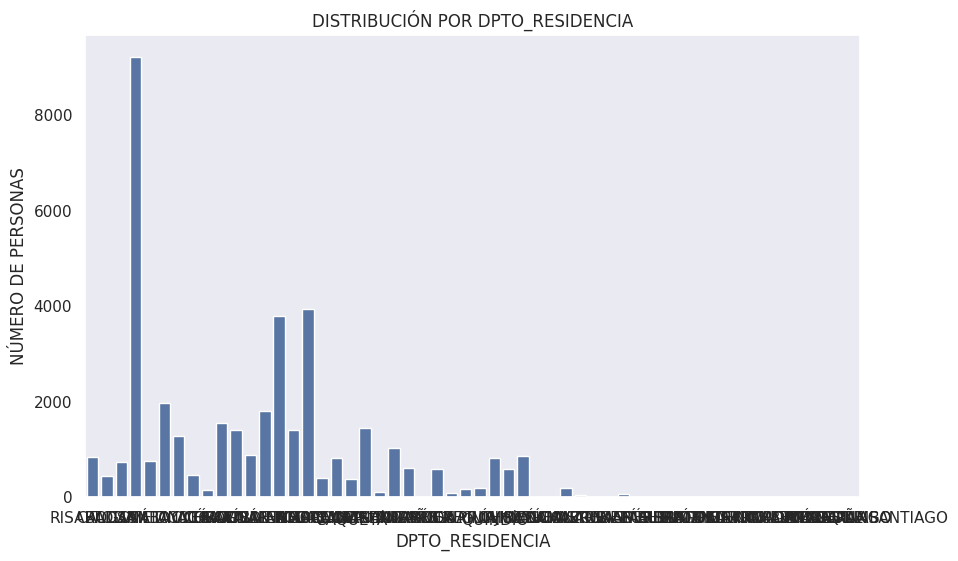

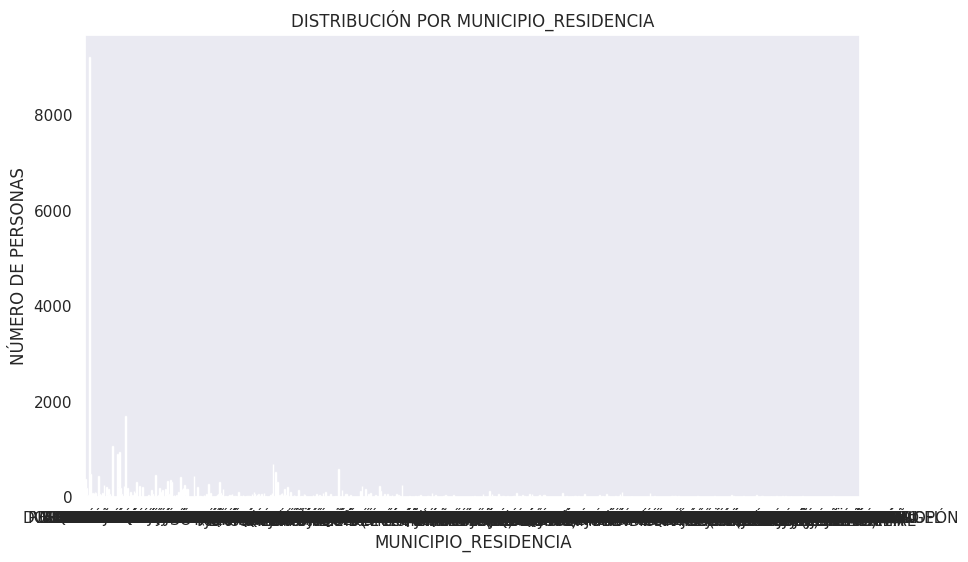

...

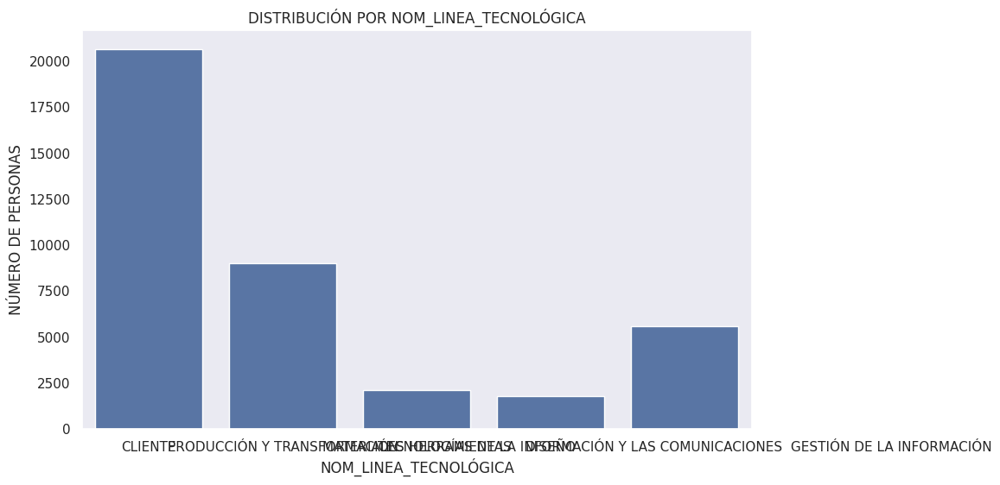

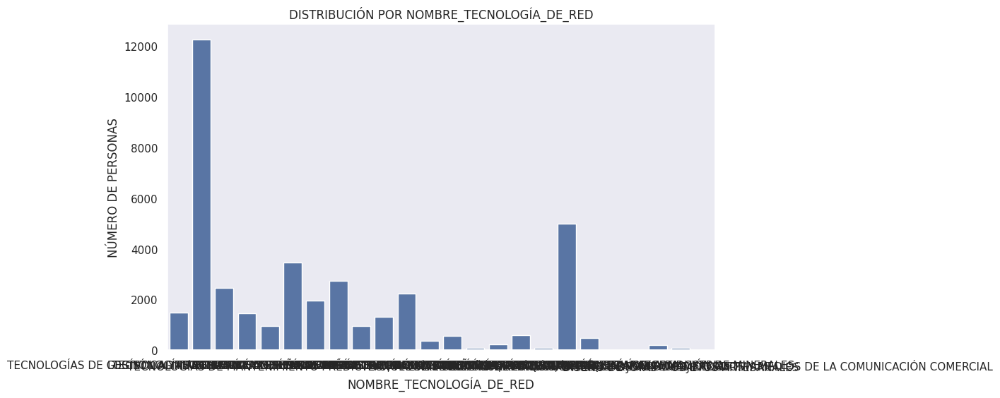

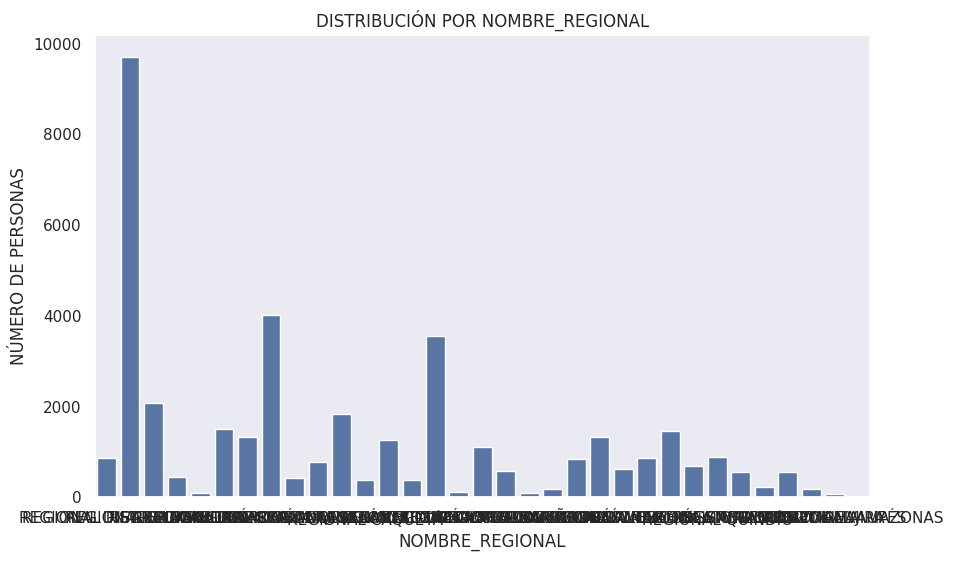

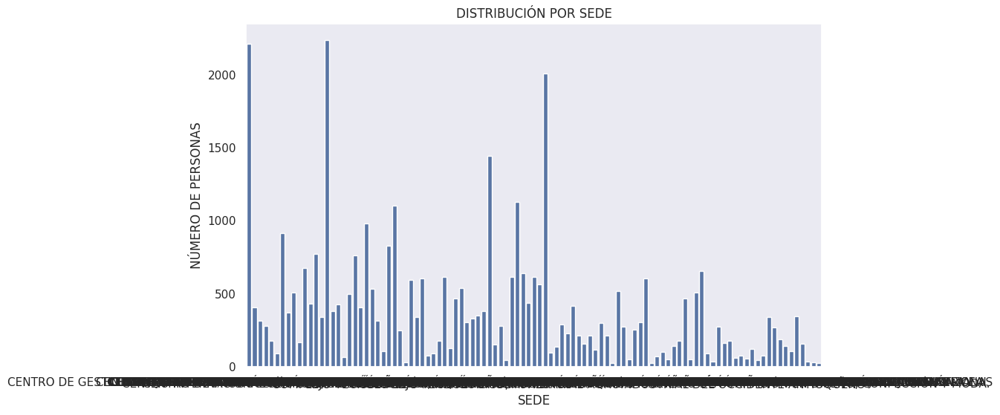

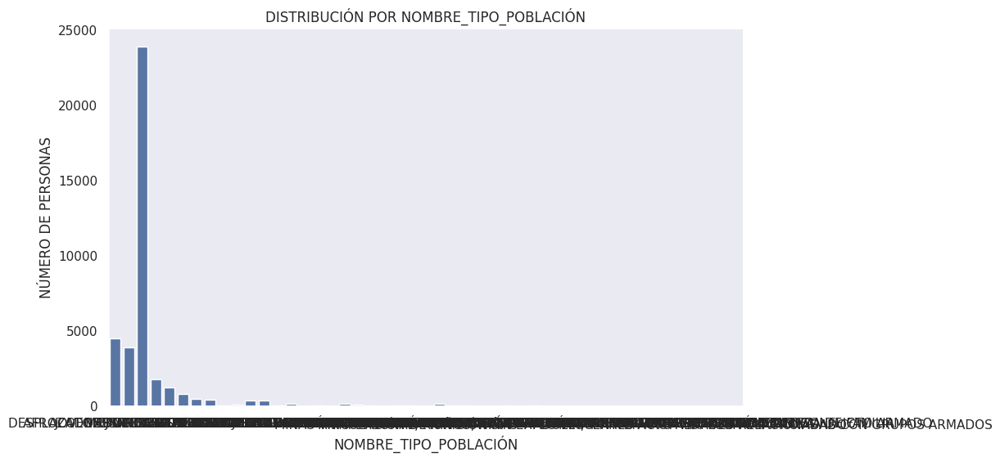

In [1221]:
sns.set_style("dark")
for col in C_col:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=col, data=df)
    plt.title(f'DISTRIBUCIÓN POR {col}')
    plt.xlabel(col)
    plt.ylabel('NÚMERO DE PERSONAS')
    plt.show()

In [1222]:
print("Análisis de Columnas Numéricas")
df.describe()

Análisis de Columnas Numéricas


,NIS,FECHA_NACIMIENTO,ESTRATO,PUNTAJE_ICFES,NIVEL_SISBEN,DBU_HIJOS,COD_PAIS_RESIDENCIA,COD_DPTO_RESIDENCIA,COD_MUNICIPIO_RESIDENCIA,COD_ZONA_RESIDENCIA,...,APOYO_SOSTNMTO_2023,APOYO_FIC_2018,APOYO_FIC_2019,APOYO_FIC_2020,APOYO_FIC_2021,PUNTAJE_TOTAL,FTE_ACC_PREFERENTE,FECHA_MATRICULA,FECHA_ULTIMO_ESTADO,DURACIÓN_PROGRAMA
count,3.910200e+04,39102,39102.000000,1910.000000,6995.000000,115.000000,39102.000000,39102.000000,3.910200e+04,2791.000000,...,39102.0,39102.000000,39102.000000,39102.000000,39102.0,39102.000000,5167.000000,39102,39102,39102.000000
mean,2.033146e+07,1993-03-26 17:13:45.840110336,1.623549,254.324921,2.262616,0.243478,57.018669,57051.360084,5.717202e+07,134.008599,...,0.0,0.036903,0.024449,0.001509,0.0,54.687795,1.339849,2018-01-06 15:38:11.913456896,2019-11-28 06:26:18.763234560,531.537006
min,7.195145e+06,1925-08-20 00:00:00,1.000000,1.000000,1.000000,0.000000,32.000000,32001.000000,3.200100e+07,1.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2017-12-13 00:00:00,2017-12-13 00:00:00,6.000000
25%,1.597555e+07,1989-08-17 00:00:00,1.000000,214.000000,1.000000,0.000000,57.000000,57011.000000,5.701100e+07,10.000000,...,0.0,0.000000,0.000000,0.000000,0.0,42.070000,1.000000,2017-12-19 00:00:00,2018-09-20 00:00:00,12.000000
50%,2.203987e+07,1996-03-10 00:00:00,1.000000,263.000000,2.000000,0.000000,57.000000,57023.000000,5.702318e+07,83.000000,...,0.0,0.000000,0.000000,0.000000,0.0,50.830000,1.000000,2017-12-26 00:00:00,2019-07-09 00:00:00,24.000000
75%,2.579352e+07,1999-07-14 00:00:00,2.000000,300.750000,2.000000,0.000000,57.000000,57054.000000,5.705450e+07,206.000000,...,0.0,0.000000,0.000000,0.000000,0.0,73.230000,1.000000,2018-01-22 00:00:00,2020-10-28 00:00:00,864.000000
max,3.368474e+07,2008-07-02 00:00:00,6.000000,999.000000,6.000000,2.000000,593.000000,593020.000000,1.000000e+09,466.000000,...,0.0,1.000000,1.000000,1.000000,0.0,108.470000,13.000000,2020-11-23 00:00:00,2023-05-12 00:00:00,3960.000000
std,5.916753e+06,NaN,0.717842,137.298622,1.744741,0.555535,3.141385,3141.384418,1.111544e+07,154.681330,...,0.0,0.188527,0.154440,0.038815,0.0,22.819638,1.721582,NaN,NaN,942.339814


In [1223]:
N_colA = N_col[:]
columnas_a_excluir = ['NIS', 'COD_PAIS_RESISENCIA', 'COD_DPTO_RESIDENCIA', 'COD_MUNICIPIO_RESIDENCIA', 'COD_ZONA_RESIDENCIA', 'COD_BARRIO_RESIDENCIA']
for col in columnas_a_excluir:
    if col in N_colA:
        N_colA.remove(col)
print(f"# Columnas Numéricas a Analizar = {len(N_colA)}", N_colA)

# Columnas Numéricas a Analizar = 32 ['FECHA_NACIMIENTO', 'ESTRATO', 'PUNTAJE_ICFES', 'NIVEL_SISBEN', 'DBU_HIJOS', 'COD_PAIS_RESIDENCIA', 'CODIGO_ESTADO', 'COD_NIVEL_FORMACION', 'COD_PROGRAMA', 'CODIGO_RED_CONOCIMIENTO', 'COD_LINEA_TECNOLÓGICA', 'CÓDIGO_TECNOLOGÍA_DE_RED', 'FICHA_NUM_CURSO', 'CÓDIGO_REGIONAL', 'CÓDIGO_CENTRO', 'EDAD', 'CÓDIGO_TIPO_POBLACIÓN', 'APOYO_SOSTNMTO_2018', 'APOYO_SOSTNMTO_2019', 'APOYO_SOSTNMTO_2020', 'APOYO_SOSTNMTO_2021', 'APOYO_SOSTNMTO_2022', 'APOYO_SOSTNMTO_2023', 'APOYO_FIC_2018', 'APOYO_FIC_2019', 'APOYO_FIC_2020', 'APOYO_FIC_2021', 'PUNTAJE_TOTAL', 'FTE_ACC_PREFERENTE', 'FECHA_MATRICULA', 'FECHA_ULTIMO_ESTADO', 'DURACIÓN_PROGRAMA']


In [1224]:
result_dfs = []
for col in N_col:
    col_counts = df[col].value_counts()
    total_rows = len(df)
    col_percentages = (col_counts / total_rows) * 100

    result_df = pd.DataFrame({
        "Valores Únicos": col_counts.index,
        "Recuento": col_counts.values,
        "Porcentaje por Categoría": col_percentages.values
    })
    result_dfs.append(result_df)
for col, result_df in zip(N_col, result_dfs):
    print(f"\nAnálisis para la característica'{col}':")
    display(result_df)
    print("-" * 50)


Análisis para la característica'NIS':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,26104737,4,0.010230
1,26160318,4,0.010230
2,26206428,4,0.010230
3,26039723,4,0.010230
4,24361021,4,0.010230
...,...,...,...
38049,25261757,1,0.002557
38050,25859495,1,0.002557
38051,12481046,1,0.002557
38052,22761016,1,0.002557


--------------------------------------------------

Análisis para la característica'FECHA_NACIMIENTO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,2000-01-01,35,0.089509
1,2000-12-21,32,0.081837
2,2000-12-04,28,0.071608
3,2000-05-26,27,0.069050
4,2000-02-18,25,0.063935
...,...,...,...
10108,1979-11-28,1,0.002557
10109,2003-07-01,1,0.002557
10110,1968-06-05,1,0.002557
10111,1974-07-15,1,0.002557


--------------------------------------------------

Análisis para la característica'ESTRATO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,1,19781,50.588205
1,2,14610,37.363818
2,3,4423,11.311442
3,4,238,0.608665
4,5,38,0.097182
5,6,12,0.030689


--------------------------------------------------

Análisis para la característica'PUNTAJE_ICFES':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,45.0,33,0.084395
1,250.0,27,0.069050
2,298.0,25,0.063935
3,300.0,23,0.058821
4,48.0,21,0.053706
...,...,...,...
393,652.0,1,0.002557
394,422.0,1,0.002557
395,134.0,1,0.002557
396,424.0,1,0.002557


--------------------------------------------------

Análisis para la característica'NIVEL_SISBEN':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,1.0,3202,8.188839
1,2.0,2139,5.470308
2,6.0,1127,2.882206
3,3.0,523,1.337527
4,4.0,4,0.010230


--------------------------------------------------

Análisis para la característica'DBU_HIJOS':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0.0,94,0.240397
1,1.0,14,0.035804
2,2.0,7,0.017902


--------------------------------------------------

Análisis para la característica'COD_PAIS_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,57,39077,99.936065
1,58,6,0.015344
2,34,5,0.012787
3,56,3,0.007672
4,147,1,0.002557
5,351,1,0.002557
6,39,1,0.002557
7,32,1,0.002557
8,51,1,0.002557
9,61,1,0.002557


--------------------------------------------------

Análisis para la característica'COD_DPTO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,57011,9208,23.548668
1,57005,3950,10.101785
2,57025,3791,9.695156
3,57068,1980,5.063680
4,57008,1805,4.616132
5,57023,1553,3.971664
6,57054,1443,3.690348
7,57076,1412,3.611068
8,57013,1402,3.585494
9,57015,1275,3.260703


--------------------------------------------------

Análisis para la característica'COD_MUNICIPIO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,57011001,9208,23.548668
1,57005001,1698,4.342489
2,57013001,1066,2.726203
3,57025754,948,2.424428
4,57008001,914,2.337476
...,...,...,...
895,351015001,1,0.002557
896,57025328,1,0.002557
897,57070678,1,0.002557
898,57005321,1,0.002557


--------------------------------------------------

Análisis para la característica'COD_ZONA_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,7.0,189,0.483351
1,8.0,174,0.444990
2,11.0,164,0.419416
3,19.0,112,0.286430
4,10.0,109,0.278758
...,...,...,...
268,354.0,1,0.002557
269,194.0,1,0.002557
270,349.0,1,0.002557
271,39.0,1,0.002557


--------------------------------------------------

Análisis para la característica'COD_BARRIO_RESIDENCIA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,304.0,33,0.084395
1,424.0,19,0.048591
2,2920.0,16,0.040919
3,664.0,14,0.035804
4,2298.0,14,0.035804
...,...,...,...
1243,2123.0,1,0.002557
1244,8579.0,1,0.002557
1245,637.0,1,0.002557
1246,9016.0,1,0.002557


--------------------------------------------------

Análisis para la característica'CODIGO_ESTADO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,3,19905,50.905325
1,2,12352,31.589177
2,6,3495,8.938162
3,11,1776,4.541967
4,7,1320,3.375786
5,12,219,0.560074
6,1,15,0.038361
7,4,14,0.035804
8,8,6,0.015344


--------------------------------------------------

Análisis para la característica'COD_NIVEL_FORMACION':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,2,26480,67.720321
1,6,10162,25.988440
2,7,1038,2.654596
3,10,978,2.501151
4,1,379,0.969260
5,223,65,0.166232


--------------------------------------------------

Análisis para la característica'COD_PROGRAMA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,122121,2361,6.038054
1,228185,2341,5.986906
2,112005,1478,3.779858
3,133146,1367,3.495985
4,134401,1231,3.148177
...,...,...,...
210,722303,15,0.038361
211,836221,15,0.038361
212,135304,15,0.038361
213,931501,15,0.038361


--------------------------------------------------

Análisis para la característica'CODIGO_RED_CONOCIMIENTO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,26.0,1438,3.677561
1,9.0,1308,3.345097
2,10.0,886,2.265869
3,8.0,854,2.184032
4,23.0,677,1.731369
5,16.0,611,1.562580
6,30.0,606,1.549793
7,14.0,536,1.370774
8,4.0,454,1.161066
9,13.0,337,0.861848


--------------------------------------------------

Análisis para la característica'COD_LINEA_TECNOLÓGICA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,5,20643,52.792696
1,3,9012,23.047414
2,1,5568,14.239681
3,4,2105,5.383356
4,2,1774,4.536852


--------------------------------------------------

Análisis para la característica'CÓDIGO_TECNOLOGÍA_DE_RED':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,25,12248,31.323206
1,1,4992,12.766610
2,24,3467,8.866554
3,9,2740,7.007314
4,23,2452,6.270779
5,10,2234,5.713263
6,18,1974,5.048335
7,22,1489,3.807989
8,8,1453,3.715922
9,11,1311,3.352770


--------------------------------------------------

Análisis para la característica'FICHA_NUM_CURSO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,1581575,216,0.552401
1,1581582,211,0.539614
2,1581576,203,0.519155
3,1576858,138,0.352923
4,1578581,120,0.306890
...,...,...,...
1376,1582100,4,0.010230
1377,1580799,3,0.007672
1378,1578867,3,0.007672
1379,1578856,3,0.007672


--------------------------------------------------

Análisis para la característica'CÓDIGO_REGIONAL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,11,9699,24.804358
1,5,4024,10.291034
2,25,3557,9.096721
3,68,2088,5.339880
4,8,1841,4.708199
5,23,1509,3.859138
6,54,1454,3.718480
7,13,1335,3.414148
8,76,1334,3.411590
9,15,1263,3.230014


--------------------------------------------------

Análisis para la característica'CÓDIGO_CENTRO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,9404,2235,5.715820
1,9405,2006,5.130172
2,9210,1442,3.687791
3,9518,1103,2.820828
4,9512,984,2.516495
...,...,...,...
105,9226,33,0.084395
106,9535,31,0.079280
107,9101,29,0.074165
108,9549,28,0.071608


--------------------------------------------------

Análisis para la característica'EDAD':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,17,4694,12.004501
1,18,4502,11.513478
2,19,3511,8.979080
3,20,2881,7.367910
4,21,2311,5.910184
...,...,...,...
69,77,1,0.002557
70,92,1,0.002557
71,9,1,0.002557
72,75,1,0.002557


--------------------------------------------------

Análisis para la característica'CÓDIGO_TIPO_POBLACIÓN':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,34,23906,61.137538
1,3,4511,11.536494
2,8,3892,9.953455
3,64,1805,4.616132
4,10,1246,3.186538
5,14,807,2.063833
6,127,502,1.283822
7,6,407,1.040867
8,130,395,1.010179
9,11,365,0.933456


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2018':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,37502,95.908138
1,1,1600,4.091862


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2019':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,37878,96.869725
1,1,1224,3.130275


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2020':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,38993,99.721242
1,1,109,0.278758


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2021':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,39102,100.0


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2022':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,39102,100.0


--------------------------------------------------

Análisis para la característica'APOYO_SOSTNMTO_2023':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,39102,100.0


--------------------------------------------------

Análisis para la característica'APOYO_FIC_2018':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,37659,96.309652
1,1,1443,3.690348


--------------------------------------------------

Análisis para la característica'APOYO_FIC_2019':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,38146,97.555112
1,1,956,2.444888


--------------------------------------------------

Análisis para la característica'APOYO_FIC_2020':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,39043,99.849113
1,1,59,0.150887


--------------------------------------------------

Análisis para la característica'APOYO_FIC_2021':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0,39102,100.0


--------------------------------------------------

Análisis para la característica'PUNTAJE_TOTAL':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,0.00,1834,4.690297
1,44.93,63,0.161117
2,46.43,61,0.156002
3,45.57,59,0.150887
4,49.13,55,0.140658
...,...,...,...
6250,16.46,1,0.002557
6251,16.32,1,0.002557
6252,15.30,1,0.002557
6253,16.15,1,0.002557


--------------------------------------------------

Análisis para la característica'FTE_ACC_PREFERENTE':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,1.0,4969,12.707790
1,9.0,133,0.340136
2,11.0,30,0.076722
3,12.0,28,0.071608
4,13.0,7,0.017902


--------------------------------------------------

Análisis para la característica'FECHA_MATRICULA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,2017-12-19,3992,10.209196
1,2017-12-21,3457,8.840980
2,2017-12-18,3118,7.974017
3,2017-12-20,3083,7.884507
4,2017-12-22,2232,5.708148
...,...,...,...
266,2018-07-18,1,0.002557
267,2018-07-13,1,0.002557
268,2018-10-02,1,0.002557
269,2018-03-16,1,0.002557


--------------------------------------------------

Análisis para la característica'FECHA_ULTIMO_ESTADO':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,2017-12-19,346,0.884865
1,2017-12-21,343,0.877193
2,2017-12-20,236,0.603550
3,2017-12-18,208,0.531942
4,2022-07-12,179,0.457777
...,...,...,...
1546,2018-03-26,1,0.002557
1547,2020-12-19,1,0.002557
1548,2021-03-14,1,0.002557
1549,2022-02-09,1,0.002557


--------------------------------------------------

Análisis para la característica'DURACIÓN_PROGRAMA':


,Valores Únicos,Recuento,Porcentaje por Categoría
0,12,18821,48.133088
1,24,9822,25.118920
2,2200,4210,10.766713
3,2208,1847,4.723544
4,2640,1212,3.099586
5,864,888,2.270984
6,6,502,1.283822
7,1296,494,1.263362
8,1760,360,0.920669
9,880,340,0.869521


--------------------------------------------------


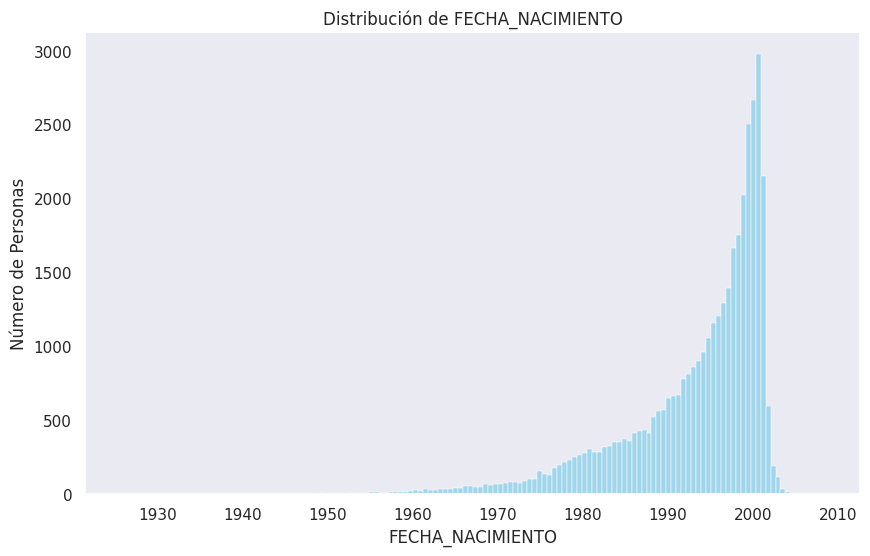

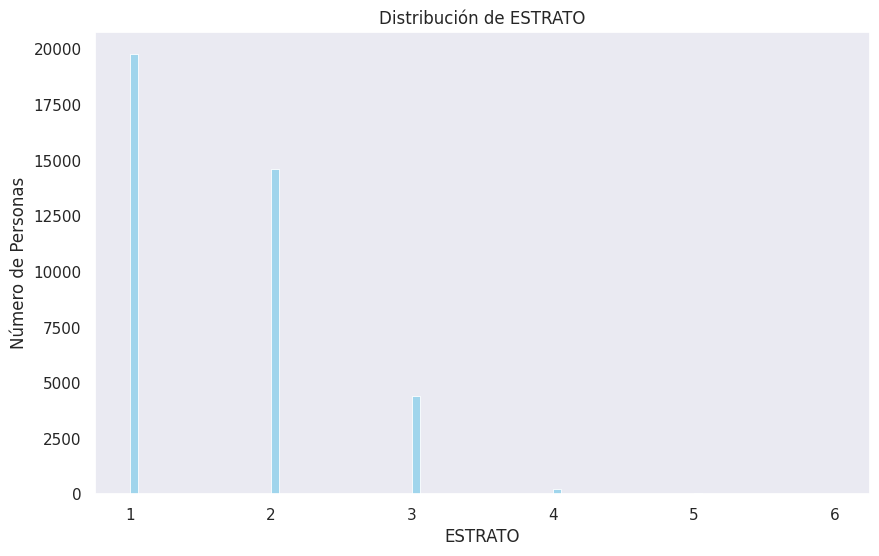

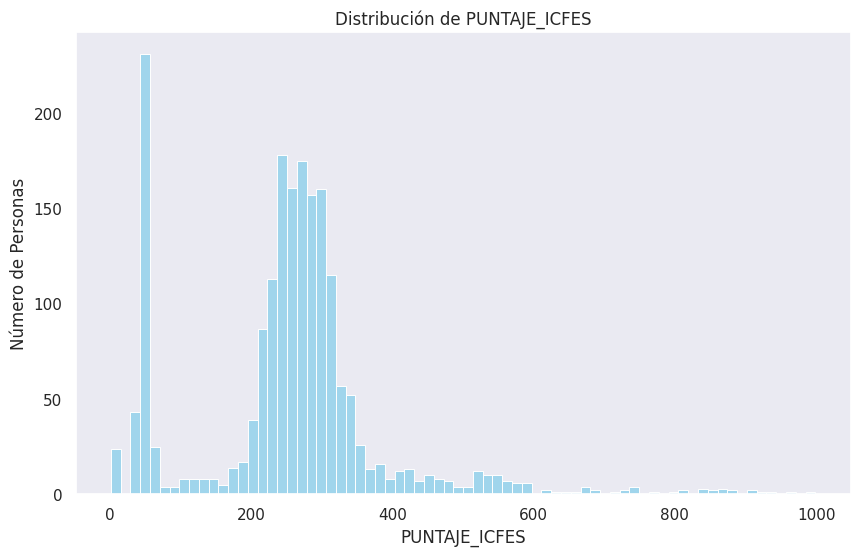

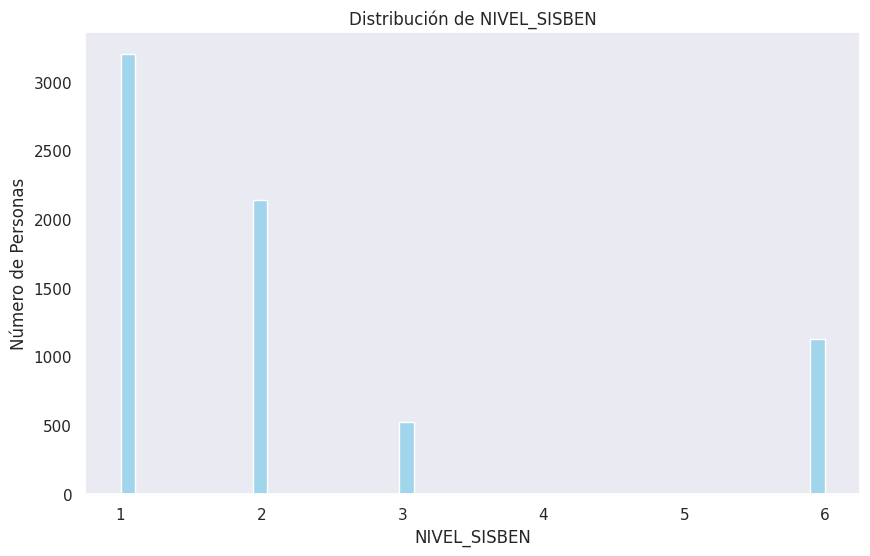

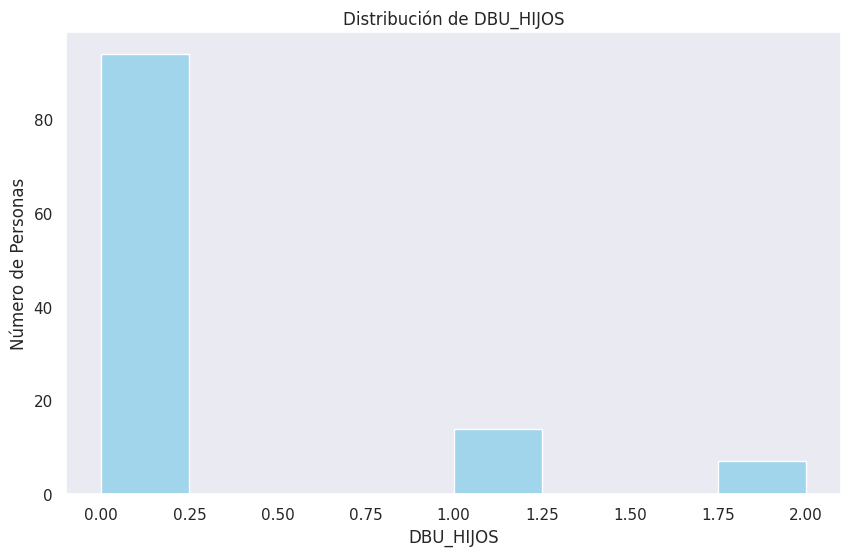

...

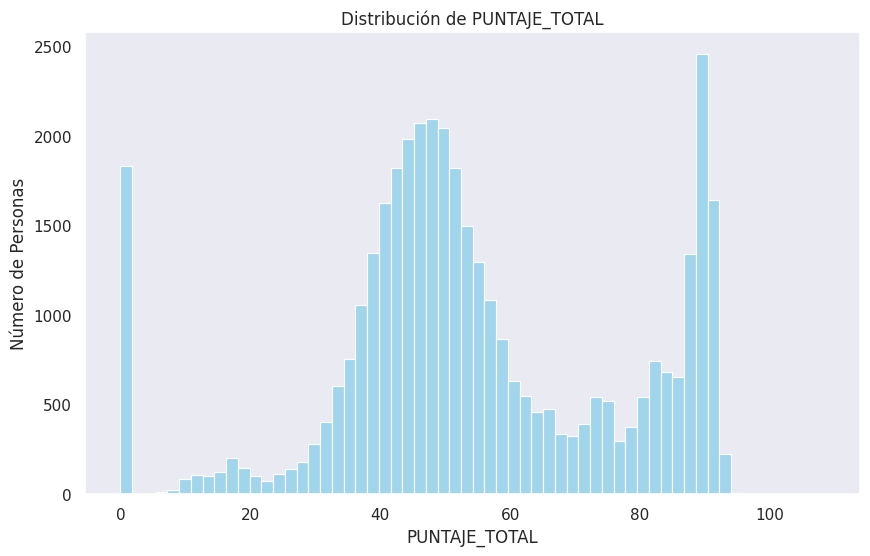

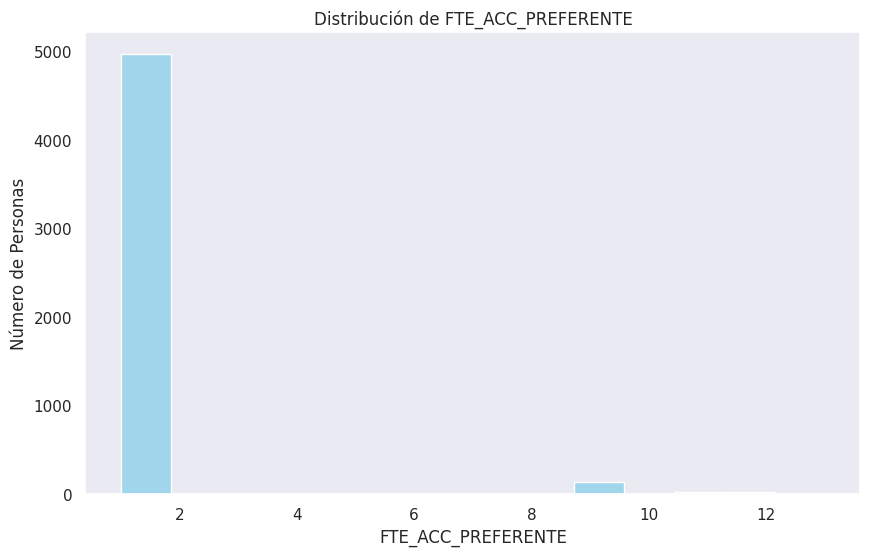

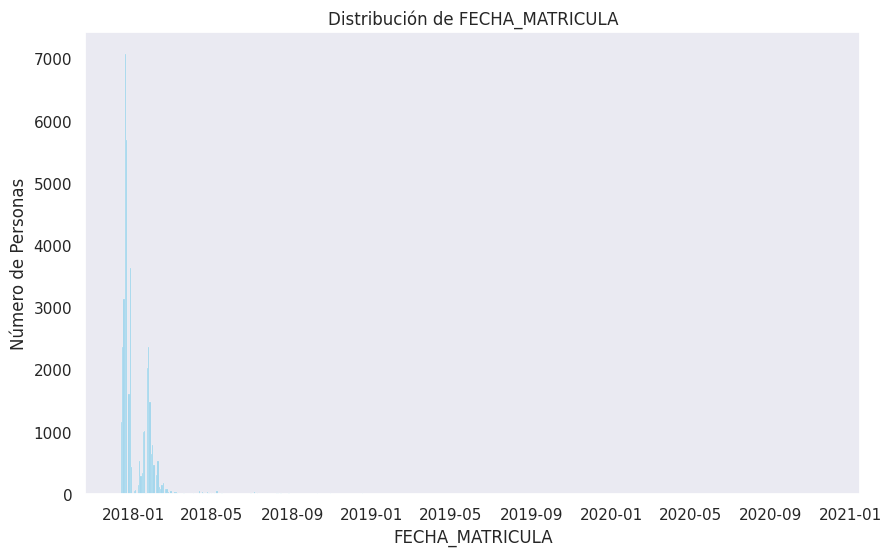

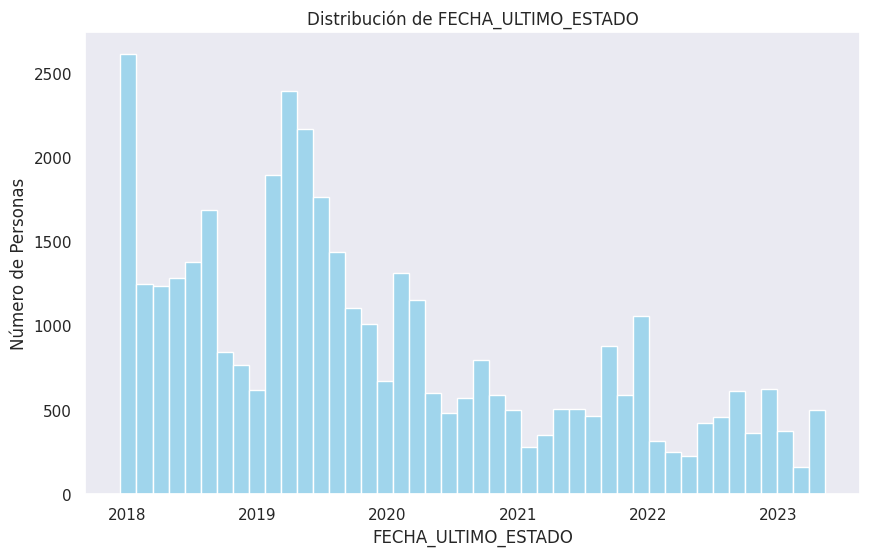

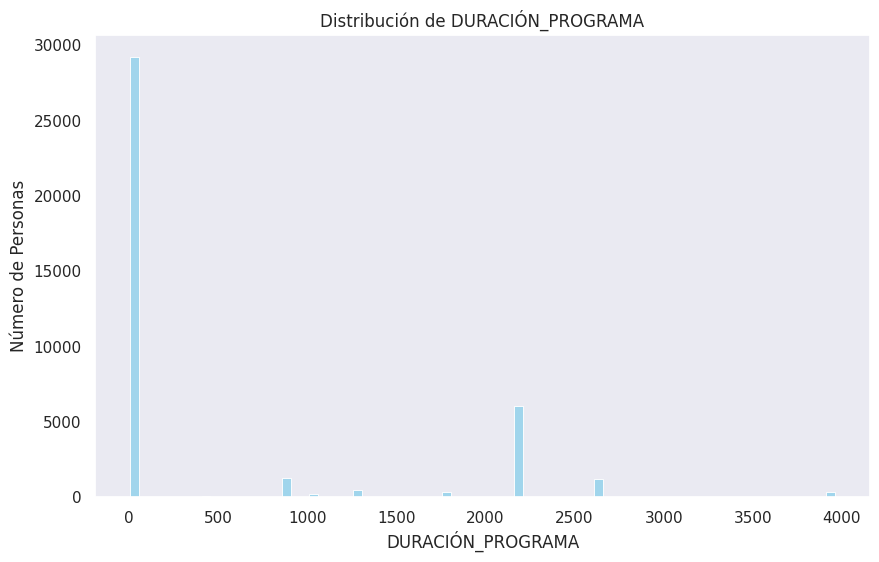

In [1225]:
N_colA
for col in N_colA:
    num_bins=df[col].nunique()
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], color='skyblue')
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Número de Personas')
    plt.show()

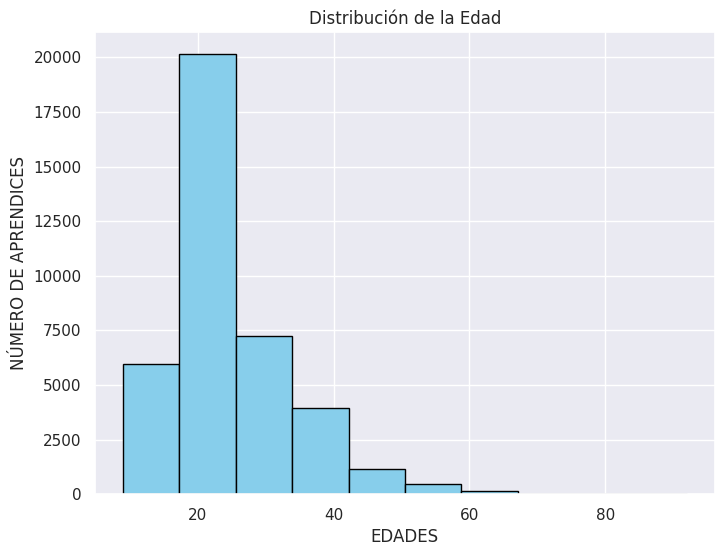

In [1226]:
# Graficar la distribución utilizando Matplotlib
plt.figure(figsize=(8, 6))  # Tamaño de la figura
plt.hist(df['EDAD'], bins=10, color='skyblue', edgecolor='black')  # Histograma
plt.xlabel('EDADES')  # Etiqueta del eje x
plt.ylabel('NÚMERO DE APRENDICES')  # Etiqueta del eje y
plt.title('Distribución de la Edad')  # Título del gráfico
plt.grid(True)  # Mostrar cuadrícula
plt.show()  # Mostrar la gráfica

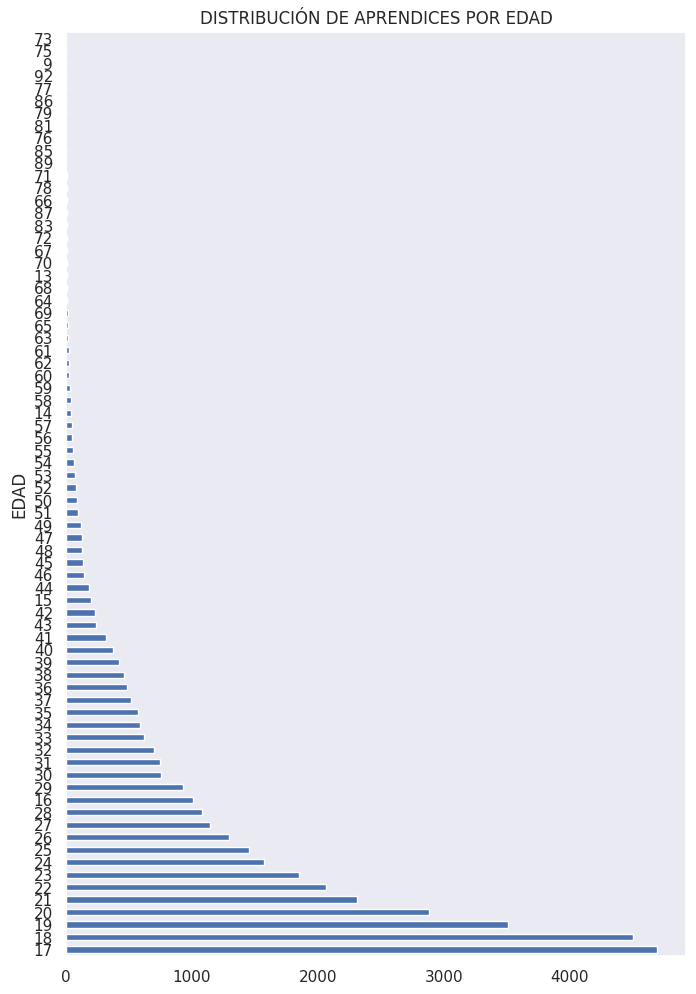

In [1227]:
plt.xlabel("EDAD")
plt.ylabel("CANTIDAD DE APRENDICES")
plt.title("DISTRIBUCIÓN DE APRENDICES POR EDAD")
df["EDAD"].value_counts().plot(kind='barh', figsize=(8,12))
plt.show()

<ipython-input-1228-924c8316e60b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=col, palette='mako_r', ax=ax)
<ipython-input-1228-924c8316e60b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=col, palette='mako_r', ax=ax)
<ipython-input-1228-924c8316e60b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=col, palette='mako_r', ax=ax)


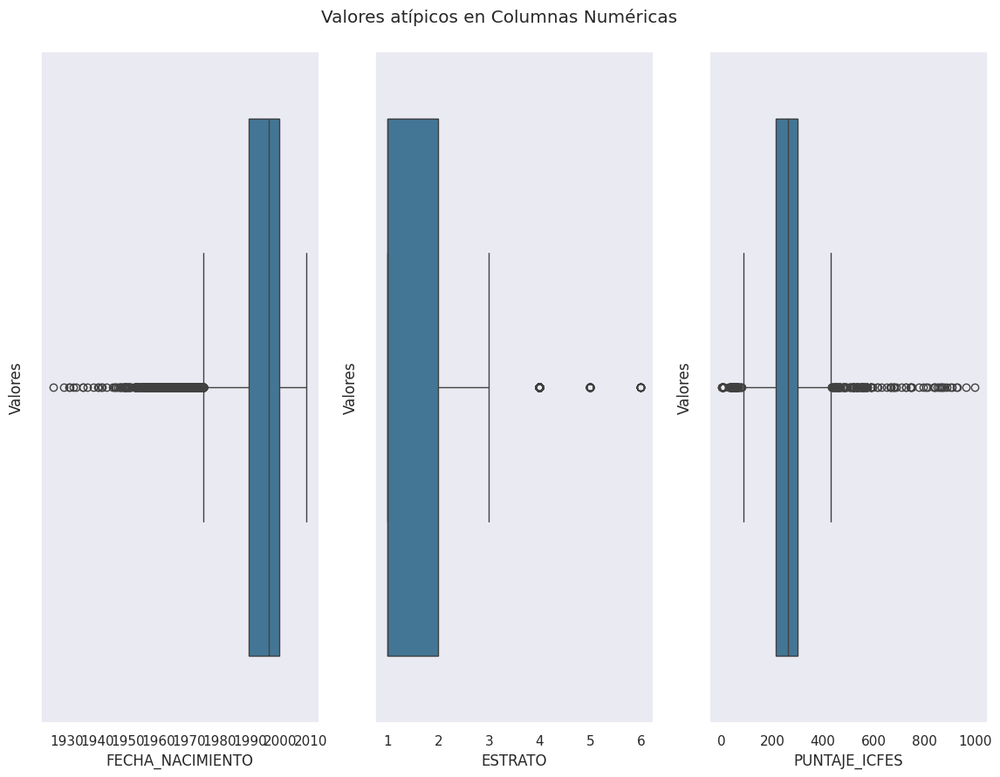

In [1228]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14,10), dpi=100)
fig.suptitle('Valores atípicos en Columnas Numéricas', y = 0.93);
for col, ax in zip(N_colA, axes.ravel()):
    sns.boxplot(data=df, x=col, palette='mako_r', ax=ax)
    ax.set_ylabel('Valores')

ANÁLISIS MULTIVARIADO

GENERO vs RANGO DE EDADES

In [1229]:
#pd.crosstab(index=copia_df["GENERO"], columns=copia_df["R_EDAD"], margins=True)
tabla_contingencia =pd.crosstab(index=copia_df["GENERO"], columns=copia_df["R_EDAD"], margins=True)
tabla_contingencia

R_EDAD,ADOLESCENCIA,ADULTEZ,JUVENTUD,NIÑEZ,VEJEZ,All
GENERO,,,,,,
F,5372,3968,10667,1,36,20044
M,5079,3697,10168,0,114,19058
All,10451,7665,20835,1,150,39102


In [1230]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

R_EDAD  ADOLESCENCIA    ADULTEZ   JUVENTUD     NIÑEZ     VEJEZ         All
GENERO                                                                    
F          13.738428  10.147819  27.279935  0.002557  0.092067   51.260805
M          12.989105   9.454759  26.003785  0.000000  0.291545   48.739195
All        26.727533  19.602578  53.283720  0.002557  0.383612  100.000000


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD Y GÉNERO')

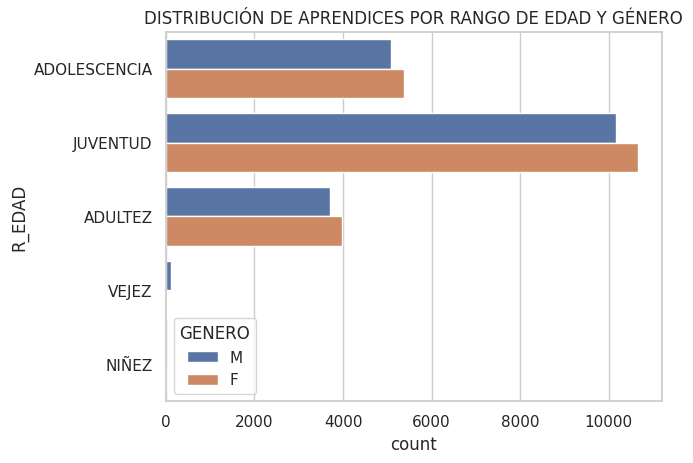

In [1231]:
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["R_EDAD"], hue=copia_df["GENERO"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR RANGO DE EDAD Y GÉNERO")

GENERO vs ESTRATO

In [1232]:
#pd.crosstab(index=copia_df["GENERO"], columns=copia_df["ESTRATO"], margins=True)
tabla_contingencia = pd.crosstab(index=copia_df["GENERO"], columns=copia_df["ESTRATO"], margins=True)
tabla_contingencia

ESTRATO,1,2,3,4,5,6,All
GENERO,,,,,,,
F,10687,7212,2025,102,16,2,20044
M,9094,7398,2398,136,22,10,19058
All,19781,14610,4423,238,38,12,39102


In [1233]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

ESTRATO          1          2          3         4         5         6  \
GENERO                                                                   
F        27.331083  18.444069   5.178763  0.260856  0.040919  0.005115   
M        23.257122  18.919748   6.132679  0.347808  0.056263  0.025574   
All      50.588205  37.363818  11.311442  0.608665  0.097182  0.030689   

ESTRATO         All  
GENERO               
F         51.260805  
M         48.739195  
All      100.000000  


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR ESTRATO Y GÉNERO')

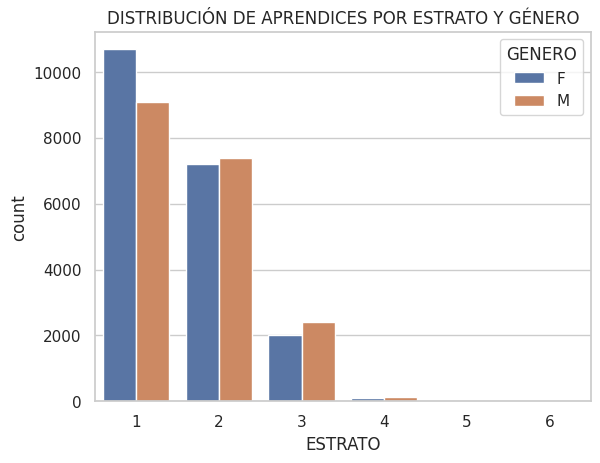

In [1234]:
sns.set_theme(style="whitegrid")
ax = sns.countplot(x=copia_df["ESTRATO"], hue=copia_df["GENERO"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR ESTRATO Y GÉNERO")

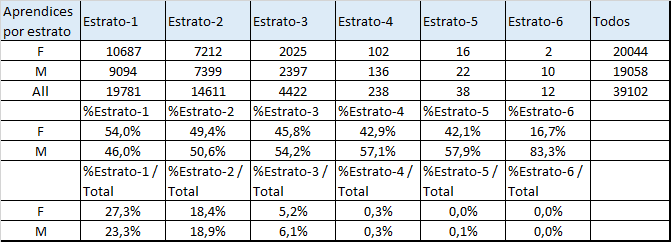

GÉNERO Y DESERCIÓN

Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR GÉNERO Y DESERCIÓN')

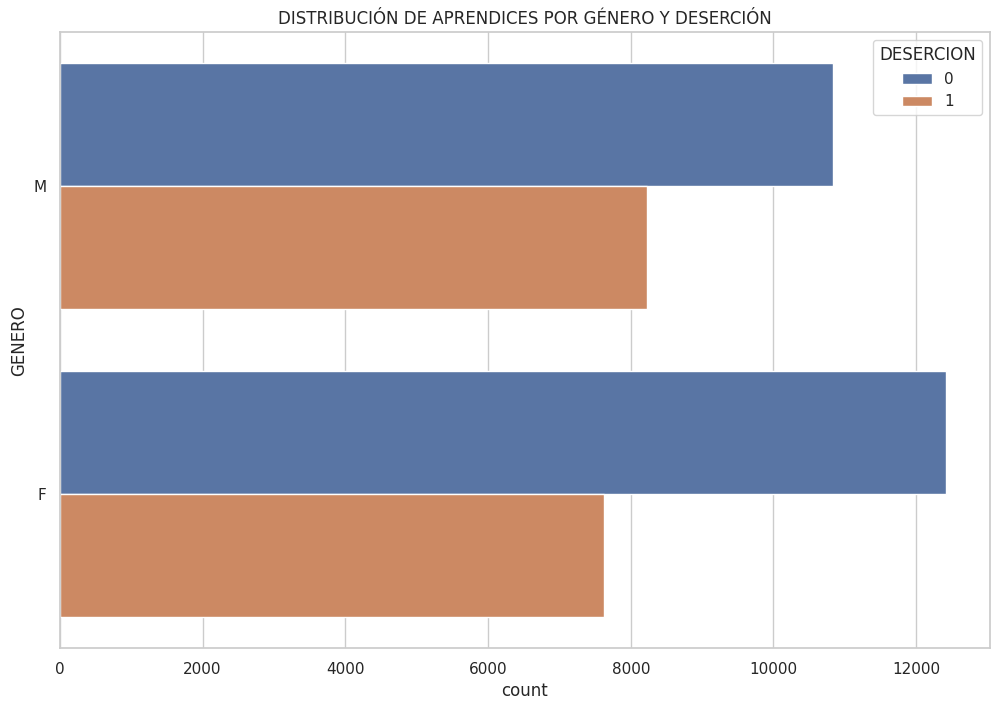

In [1235]:
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["GENERO"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR GÉNERO Y DESERCIÓN")

In [1236]:
tabla_contingencia = pd.crosstab(index=copia_df["GENERO"], columns=copia_df["DESERCION"], margins=True)
tabla_contingencia

DESERCION,0,1,All
GENERO,,,
F,12412,7632,20044
M,10828,8230,19058
All,23240,15862,39102


In [1237]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

DESERCION          0          1         All
GENERO                                     
F          31.742622  19.518183   51.260805
M          27.691678  21.047517   48.739195
All        59.434300  40.565700  100.000000


ESTRATO Y DESERCIÓN

In [1238]:
tabla_contingencia = pd.crosstab(index=copia_df["ESTRATO"], columns=copia_df["DESERCION"], margins=True)
tabla_contingencia

DESERCION,0,1,All
ESTRATO,,,
1,11709,8072,19781
2,8794,5816,14610
3,2575,1848,4423
4,138,100,238
5,19,19,38
6,5,7,12
All,23240,15862,39102


In [1239]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

DESERCION          0          1         All
ESTRATO                                    
1          29.944760  20.643445   50.588205
2          22.489898  14.873919   37.363818
3           6.585341   4.726101   11.311442
4           0.352923   0.255741    0.608665
5           0.048591   0.048591    0.097182
6           0.012787   0.017902    0.030689
All        59.434300  40.565700  100.000000


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR ESTRATO Y DESERCIÓN')

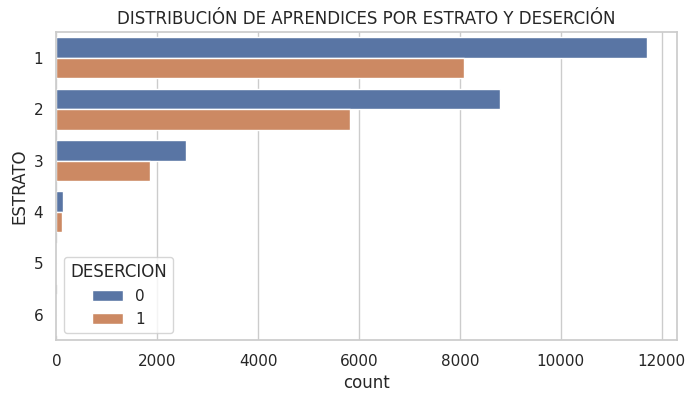

In [1240]:
plt.figure(figsize=(8, 4))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["ESTRATO"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR ESTRATO Y DESERCIÓN")

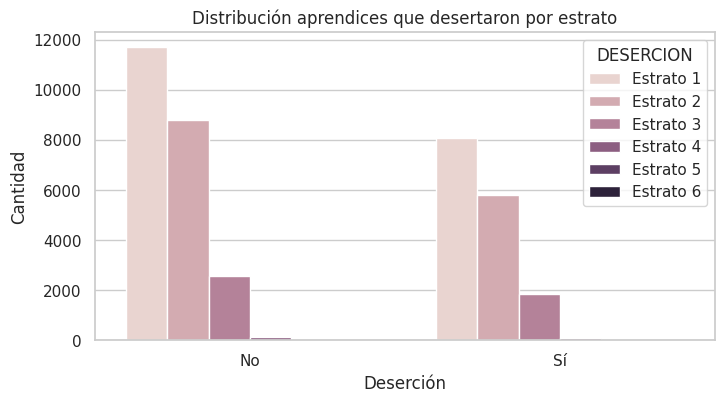

In [1241]:
plt.figure(figsize=(8, 4))
sns.countplot(data=copia_df, x='DESERCION', hue=df['ESTRATO'])
plt.xlabel('Deserción')
plt.ylabel('Cantidad')
plt.title('Distribución aprendices que desertaron por estrato')
plt.legend(title='DESERCION', labels=['Estrato 1', 'Estrato 2', 'Estrato 3', 'Estrato 4', 'Estrato 5', 'Estrato 6'])
plt.xticks([0, 1], ['No', 'Sí'])
plt.show()

ESTADO CIVIL Y DESERCIÓN

In [1242]:
tabla_contingencia = pd.crosstab(index=copia_df["ESTADO_CIVIL"], columns=copia_df["DESERCION"], margins=True)
tabla_contingencia

DESERCION,0,1,All
ESTADO_CIVIL,,,
C,1390,852,2242
E,192,125,317
I,1602,955,2557
N,3709,5268,8977
S,13674,6948,20622
U,2645,1685,4330
V,28,29,57
All,23240,15862,39102


In [1243]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

DESERCION             0          1         All
ESTADO_CIVIL                                  
C              3.554805   2.178917    5.733722
E              0.491023   0.319677    0.810700
I              4.096977   2.442330    6.539307
N              9.485448  13.472457   22.957905
S             34.970078  17.768912   52.738990
U              6.764360   4.309242   11.073602
V              0.071608   0.074165    0.145773
All           59.434300  40.565700  100.000000


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR ESTADO CIVIL Y DESERCIÓN')

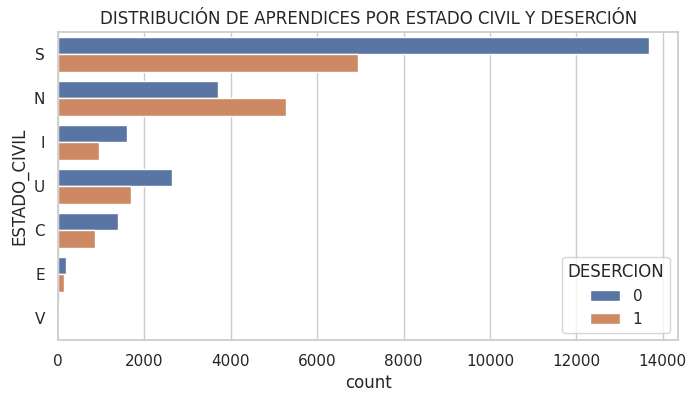

In [1244]:
plt.figure(figsize=(8, 4))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["ESTADO_CIVIL"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR ESTADO CIVIL Y DESERCIÓN")

In [1245]:
mapeo_estado_civil = {
  'S': 'SOLTERO',
  'U': 'UNION LIBRE',
  'C': 'CASADO',
  'V': 'VIUDO',
  'E': 'SEPARADO',
  'I': 'INDIFERENTE',
  'N': 'NO REPORTA'
}


In [1246]:
copia_df['ESTADO_CIVIL'] = copia_df['ESTADO_CIVIL'].map(mapeo_estado_civil)

In [1247]:
copia_df['ESTADO_CIVIL']

0            SOLTERO
1            SOLTERO
2            SOLTERO
3            SOLTERO
4         NO REPORTA
            ...     
39097        SOLTERO
39098        SOLTERO
39099         CASADO
39100        SOLTERO
39101    UNION LIBRE
Name: ESTADO_CIVIL, Length: 39102, dtype: object

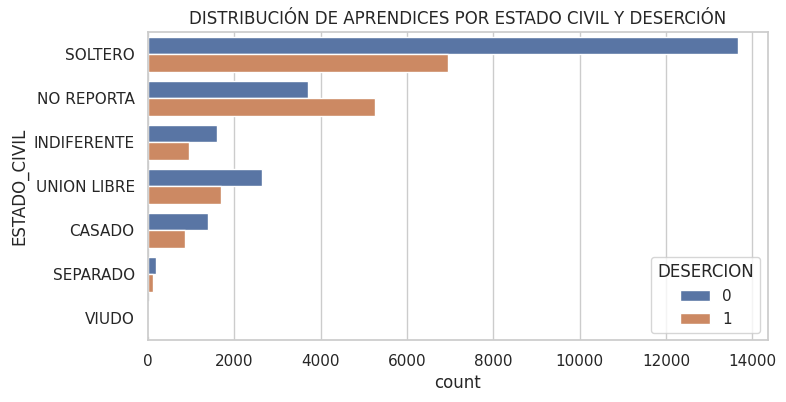

In [1248]:
plt.figure(figsize=(8, 4))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["ESTADO_CIVIL"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR ESTADO CIVIL Y DESERCIÓN")
plt.show()

FTE_ACC_PREFERENTE Y DESERCIÓN

In [1250]:
tabla_contingencia = pd.crosstab(index=copia_df["FTE_ACC_PREFERENTE"], columns=copia_df["DESERCION"], margins=True)
tabla_contingencia

DESERCION,0,1,All
FTE_ACC_PREFERENTE,,,
1.0,2839,2130,4969
9.0,81,52,133
11.0,17,13,30
12.0,12,16,28
13.0,5,2,7
All,2954,2213,5167


In [1251]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

DESERCION                   0          1         All
FTE_ACC_PREFERENTE                                  
1.0                 54.944842  41.223147   96.167989
9.0                  1.567641   1.006387    2.574027
11.0                 0.329011   0.251597    0.580608
12.0                 0.232243   0.309657    0.541901
13.0                 0.096768   0.038707    0.135475
All                 57.170505  42.829495  100.000000


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR FTE_ACC_PREFERENTE Y DESERCIÓN')

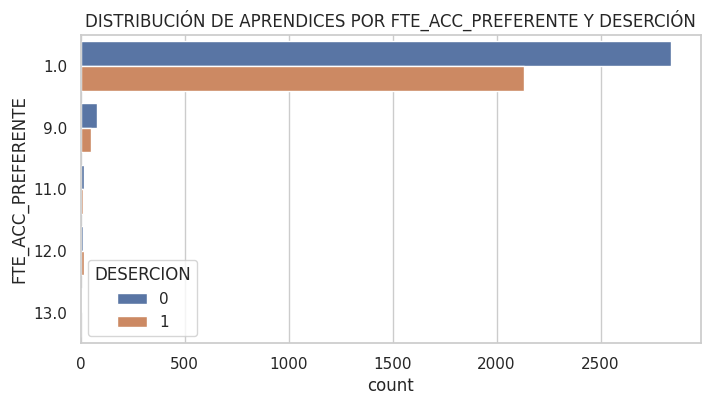

In [1252]:
plt.figure(figsize=(8, 4))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["FTE_ACC_PREFERENTE"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR FTE_ACC_PREFERENTE Y DESERCIÓN")

RANGO PUNTAJES Y DESERCIÓN

Definición rango PUNTAJES:<br>
A (de 0 a 19)<br>
B (de 20 a 39)<br>
C (de 40 a 59)<br>
D (de 60 a 79)<br>
E (de 80 en adelante)

In [1255]:
copia_df['R_PUNTAJES']=''

In [1256]:
for e in range (0,len(copia_df['PUNTAJE_TOTAL'])):
  red=copia_df['PUNTAJE_TOTAL'][e]
  if red >= 0 and red < 20:
    copia_df['R_PUNTAJES'][e]= '0-19'
  elif red >= 20 and red < 40:
    copia_df['R_PUNTAJES'][e]= '20-39'
  elif red >= 40 and red < 60:
      copia_df['R_PUNTAJES'][e]= '40-59'
  elif red >= 60 and red < 80:
          copia_df['R_PUNTAJES'][e]= '60-79'
  else:
    copia_df['R_PUNTAJES'][e]= '80-100'

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-1256-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1256-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1256-7c515ce82952>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copia_df['R_PUNTAJES'][e]= '40-59'
<ipython-input-1256-7c51

In [1257]:
tabla_contingencia = pd.crosstab(index=copia_df["R_PUNTAJES"], columns=copia_df["DESERCION"], margins=True)
tabla_contingencia

DESERCION,0,1,All
R_PUNTAJES,,,
0-19,1467,1182,2649
20-39,2757,2445,5202
40-59,10636,7547,18183
60-79,3048,1843,4891
80-100,5332,2845,8177
All,23240,15862,39102


In [1258]:
porcentaje_tabla = tabla_contingencia / tabla_contingencia.loc["All", "All"] * 100
print(porcentaje_tabla)

DESERCION           0          1         All
R_PUNTAJES                                  
0-19         3.751726   3.022863    6.774590
20-39        7.050790   6.252877   13.303667
40-59       27.200655  19.300803   46.501458
60-79        7.794998   4.713314   12.508312
80-100      13.636131   7.275843   20.911974
All         59.434300  40.565700  100.000000


Text(0.5, 1.0, 'DISTRIBUCIÓN DE APRENDICES POR RANGO PUNTAJES Y DESERCIÓN')

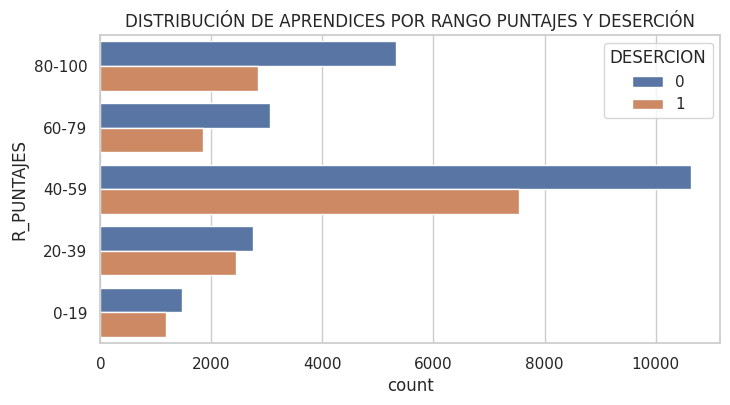

In [1259]:
plt.figure(figsize=(8, 4))
sns.set_theme(style="whitegrid")
ax = sns.countplot(y=copia_df["R_PUNTAJES"], hue=copia_df["DESERCION"])
ax.set_title("DISTRIBUCIÓN DE APRENDICES POR RANGO PUNTAJES Y DESERCIÓN")

EDAD Y DESERCIÓN

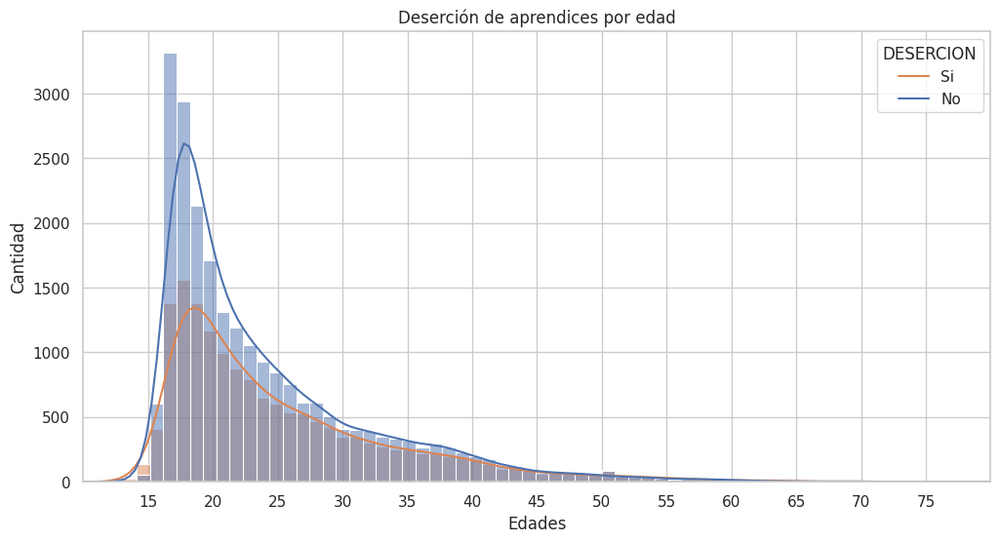

In [1261]:
plt.figure(figsize=(12, 6))
sns.histplot(data=copia_df, x='EDAD', bins=81, kde=True, color='r', hue=copia_df['DESERCION'])
plt.xlabel('Edades')
plt.ylabel('Cantidad')
plt.title('Deserción de aprendices por edad')
plt.xticks(range(15, 80, 5))
plt.xlim(10, 80)
plt.legend(title='DESERCION', labels=['Si', 'No'])
plt.show()